## Germany Offwind Cut Scenario with 130 €/t CO2 price

In [347]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [348]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\27032024_5nodes_co2price\\elec_s_5_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_5_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [349]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [350]:
#n.global_constraints.loc['CO2Limit','constant'] = 184500000 #TCO2 184500000

In [351]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 10 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 13 entries
Component 'Load' has 5 entries
Component 'Generator' has 71 entries
Component 'StorageUnit' has 12 entries
Component 'Store' has 5 entries


In [352]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [353]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [354]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:02<00:00,  5.31it/s]
INFO:linopy.io: Writing time: 15.07s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gca8ch6z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gca8ch6z.lp


Reading time = 4.72 seconds


INFO:gurobipy:Reading time = 4.72 seconds


obj: 849796 rows, 402989 columns, 1564774 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1564774 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


Model fingerprint: 0xa952e189


INFO:gurobipy:Model fingerprint: 0xa952e189


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 593259 rows and 102680 columns


INFO:gurobipy:Presolve removed 593259 rows and 102680 columns


Presolve time: 2.69s


INFO:gurobipy:Presolve time: 2.69s


Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.48s


INFO:gurobipy:Ordering time: 0.48s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 50


INFO:gurobipy: Dense cols : 50


 AA' NZ     : 8.547e+05


INFO:gurobipy: AA' NZ     : 8.547e+05


 Factor NZ  : 4.541e+06 (roughly 260 MB of memory)


INFO:gurobipy: Factor NZ  : 4.541e+06 (roughly 260 MB of memory)


 Factor Ops : 3.131e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.131e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.40430300e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     5s


INFO:gurobipy:   0   1.40430300e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     5s


   1   1.28811437e+17 -7.71653622e+17  4.16e+09 2.23e+04  3.53e+13     5s


INFO:gurobipy:   1   1.28811437e+17 -7.71653622e+17  4.16e+09 2.23e+04  3.53e+13     5s


   2   1.10815650e+17 -5.63579565e+17  3.15e+09 1.47e+04  2.59e+13     6s


INFO:gurobipy:   2   1.10815650e+17 -5.63579565e+17  3.15e+09 1.47e+04  2.59e+13     6s


   3   8.95648433e+16 -2.46894877e+17  1.67e+09 3.49e+03  1.27e+13     7s


INFO:gurobipy:   3   8.95648433e+16 -2.46894877e+17  1.67e+09 3.49e+03  1.27e+13     7s


   4   5.66617403e+16 -4.44806612e+16  3.40e+08 5.68e+02  2.65e+12    10s


INFO:gurobipy:   4   5.66617403e+16 -4.44806612e+16  3.40e+08 5.68e+02  2.65e+12    10s


   5   1.08672052e+16 -6.73515568e+15  1.41e+07 1.22e+02  1.65e+11    11s


INFO:gurobipy:   5   1.08672052e+16 -6.73515568e+15  1.41e+07 1.22e+02  1.65e+11    11s


   6   3.06484933e+15 -5.35895122e+14  2.66e+05 7.42e+00  9.29e+09    12s


INFO:gurobipy:   6   3.06484933e+15 -5.35895122e+14  2.66e+05 7.42e+00  9.29e+09    12s


   7   7.02934741e+14 -1.49794005e+14  4.23e+04 1.02e+00  1.70e+09    14s


INFO:gurobipy:   7   7.02934741e+14 -1.49794005e+14  4.23e+04 1.02e+00  1.70e+09    14s


   8   5.75476055e+14 -5.03422449e+13  3.44e+04 1.34e-01  1.16e+09    15s


INFO:gurobipy:   8   5.75476055e+14 -5.03422449e+13  3.44e+04 1.34e-01  1.16e+09    15s


   9   2.52736061e+13 -2.35961502e+13  7.30e+02 1.88e-04  7.86e+07    16s


INFO:gurobipy:   9   2.52736061e+13 -2.35961502e+13  7.30e+02 1.88e-04  7.86e+07    16s


  10   1.97705420e+12 -1.85419424e+12  5.49e+01 1.07e-05  5.95e+06    17s


INFO:gurobipy:  10   1.97705420e+12 -1.85419424e+12  5.49e+01 1.07e-05  5.95e+06    17s


  11   1.45635891e+12 -3.42400936e+11  4.00e+01 1.31e-06  2.78e+06    17s


INFO:gurobipy:  11   1.45635891e+12 -3.42400936e+11  4.00e+01 1.31e-06  2.78e+06    17s


  12   7.90226456e+11 -1.40733896e+11  2.13e+01 5.13e-07  1.44e+06    18s


INFO:gurobipy:  12   7.90226456e+11 -1.40733896e+11  2.13e+01 5.13e-07  1.44e+06    18s


  13   5.19357472e+11 -1.10598203e+11  1.37e+01 4.16e-07  9.71e+05    19s


INFO:gurobipy:  13   5.19357472e+11 -1.10598203e+11  1.37e+01 4.16e-07  9.71e+05    19s


  14   2.68535599e+11 -6.25229475e+10  6.33e+00 2.50e-07  5.10e+05    19s


INFO:gurobipy:  14   2.68535599e+11 -6.25229475e+10  6.33e+00 2.50e-07  5.10e+05    19s


  15   1.04606123e+11 -4.03696508e+10  2.02e+00 1.74e-07  2.23e+05    20s


INFO:gurobipy:  15   1.04606123e+11 -4.03696508e+10  2.02e+00 1.74e-07  2.23e+05    20s


  16   8.01247132e+10  1.80095163e+09  1.47e+00 4.31e-08  1.21e+05    21s


INFO:gurobipy:  16   8.01247132e+10  1.80095163e+09  1.47e+00 4.31e-08  1.21e+05    21s


  17   6.07488503e+10  8.40341936e+09  1.01e+00 2.54e-08  8.06e+04    22s


INFO:gurobipy:  17   6.07488503e+10  8.40341936e+09  1.01e+00 2.54e-08  8.06e+04    22s


  18   5.20441950e+10  1.01256123e+10  7.88e-01 2.17e-08  6.45e+04    22s


INFO:gurobipy:  18   5.20441950e+10  1.01256123e+10  7.88e-01 2.17e-08  6.45e+04    22s


  19   4.55434636e+10  1.32237952e+10  6.23e-01 1.46e-08  4.97e+04    23s


INFO:gurobipy:  19   4.55434636e+10  1.32237952e+10  6.23e-01 1.46e-08  4.97e+04    23s


  20   4.48631887e+10  1.42731282e+10  6.06e-01 1.25e-08  4.71e+04    23s


INFO:gurobipy:  20   4.48631887e+10  1.42731282e+10  6.06e-01 1.25e-08  4.71e+04    23s


  21   4.24953041e+10  1.54572369e+10  5.43e-01 1.03e-08  4.16e+04    24s


INFO:gurobipy:  21   4.24953041e+10  1.54572369e+10  5.43e-01 1.03e-08  4.16e+04    24s


  22   3.47281799e+10  1.67606847e+10  3.60e-01 7.96e-09  2.77e+04    27s


INFO:gurobipy:  22   3.47281799e+10  1.67606847e+10  3.60e-01 7.96e-09  2.77e+04    27s


  23   3.26212289e+10  1.81169931e+10  3.07e-01 5.92e-09  2.23e+04    28s


INFO:gurobipy:  23   3.26212289e+10  1.81169931e+10  3.07e-01 5.92e-09  2.23e+04    28s


  24   2.91609153e+10  1.88461547e+10  2.15e-01 4.79e-09  1.59e+04    30s


INFO:gurobipy:  24   2.91609153e+10  1.88461547e+10  2.15e-01 4.79e-09  1.59e+04    30s


  25   2.72463281e+10  1.95582487e+10  1.55e-01 3.81e-09  1.18e+04    33s


INFO:gurobipy:  25   2.72463281e+10  1.95582487e+10  1.55e-01 3.81e-09  1.18e+04    33s


  26   2.60398687e+10  2.00680097e+10  1.16e-01 3.11e-09  9.19e+03    35s


INFO:gurobipy:  26   2.60398687e+10  2.00680097e+10  1.16e-01 3.11e-09  9.19e+03    35s


  27   2.52484285e+10  2.05085901e+10  8.97e-02 2.54e-09  7.29e+03    36s


INFO:gurobipy:  27   2.52484285e+10  2.05085901e+10  8.97e-02 2.54e-09  7.29e+03    36s


  28   2.44902354e+10  2.07147642e+10  6.61e-02 2.26e-09  5.81e+03    37s


INFO:gurobipy:  28   2.44902354e+10  2.07147642e+10  6.61e-02 2.26e-09  5.81e+03    37s


  29   2.42034695e+10  2.10446471e+10  5.64e-02 1.86e-09  4.86e+03    38s


INFO:gurobipy:  29   2.42034695e+10  2.10446471e+10  5.64e-02 1.86e-09  4.86e+03    38s


  30   2.37905997e+10  2.11934687e+10  4.32e-02 1.69e-09  4.00e+03    39s


INFO:gurobipy:  30   2.37905997e+10  2.11934687e+10  4.32e-02 1.69e-09  4.00e+03    39s


  31   2.36078576e+10  2.13716268e+10  3.71e-02 2.28e-09  3.44e+03    39s


INFO:gurobipy:  31   2.36078576e+10  2.13716268e+10  3.71e-02 2.28e-09  3.44e+03    39s


  32   2.33783548e+10  2.14406658e+10  2.93e-02 2.68e-09  2.98e+03    40s


INFO:gurobipy:  32   2.33783548e+10  2.14406658e+10  2.93e-02 2.68e-09  2.98e+03    40s


  33   2.32816392e+10  2.15584334e+10  2.61e-02 1.23e-09  2.65e+03    40s


INFO:gurobipy:  33   2.32816392e+10  2.15584334e+10  2.61e-02 1.23e-09  2.65e+03    40s


  34   2.32037010e+10  2.16692416e+10  2.35e-02 1.12e-09  2.36e+03    41s


INFO:gurobipy:  34   2.32037010e+10  2.16692416e+10  2.35e-02 1.12e-09  2.36e+03    41s


  35   2.30996872e+10  2.17550802e+10  2.01e-02 9.79e-10  2.07e+03    42s


INFO:gurobipy:  35   2.30996872e+10  2.17550802e+10  2.01e-02 9.79e-10  2.07e+03    42s


  36   2.30205777e+10  2.18406572e+10  1.76e-02 1.38e-09  1.82e+03    43s


INFO:gurobipy:  36   2.30205777e+10  2.18406572e+10  1.76e-02 1.38e-09  1.82e+03    43s


  37   2.29272830e+10  2.18884363e+10  1.46e-02 8.05e-10  1.60e+03    44s


INFO:gurobipy:  37   2.29272830e+10  2.18884363e+10  1.46e-02 8.05e-10  1.60e+03    44s


  38   2.29008545e+10  2.19329123e+10  1.37e-02 7.47e-10  1.49e+03    44s


INFO:gurobipy:  38   2.29008545e+10  2.19329123e+10  1.37e-02 7.47e-10  1.49e+03    44s


  39   2.28647595e+10  2.19438015e+10  1.25e-02 1.70e-09  1.42e+03    45s


INFO:gurobipy:  39   2.28647595e+10  2.19438015e+10  1.25e-02 1.70e-09  1.42e+03    45s


  40   2.28270899e+10  2.19851050e+10  1.13e-02 1.12e-09  1.30e+03    45s


INFO:gurobipy:  40   2.28270899e+10  2.19851050e+10  1.13e-02 1.12e-09  1.30e+03    45s


  41   2.27915955e+10  2.20435089e+10  1.01e-02 9.82e-10  1.15e+03    46s


INFO:gurobipy:  41   2.27915955e+10  2.20435089e+10  1.01e-02 9.82e-10  1.15e+03    46s


  42   2.27606357e+10  2.20805722e+10  9.19e-03 5.50e-10  1.05e+03    47s


INFO:gurobipy:  42   2.27606357e+10  2.20805722e+10  9.19e-03 5.50e-10  1.05e+03    47s


  43   2.27152194e+10  2.21009359e+10  7.77e-03 5.22e-10  9.45e+02    47s


INFO:gurobipy:  43   2.27152194e+10  2.21009359e+10  7.77e-03 5.22e-10  9.45e+02    47s


  44   2.26943481e+10  2.21601280e+10  7.09e-03 1.90e-09  8.22e+02    48s


INFO:gurobipy:  44   2.26943481e+10  2.21601280e+10  7.09e-03 1.90e-09  8.22e+02    48s


  45   2.26646994e+10  2.21745767e+10  6.18e-03 6.62e-10  7.54e+02    50s


INFO:gurobipy:  45   2.26646994e+10  2.21745767e+10  6.18e-03 6.62e-10  7.54e+02    50s


  46   2.26359742e+10  2.21955535e+10  5.33e-03 1.00e-09  6.78e+02    52s


INFO:gurobipy:  46   2.26359742e+10  2.21955535e+10  5.33e-03 1.00e-09  6.78e+02    52s


  47   2.26242745e+10  2.22110546e+10  5.00e-03 7.86e-10  6.36e+02    53s


INFO:gurobipy:  47   2.26242745e+10  2.22110546e+10  5.00e-03 7.86e-10  6.36e+02    53s


  48   2.26130707e+10  2.22308224e+10  4.69e-03 1.54e-09  5.88e+02    55s


INFO:gurobipy:  48   2.26130707e+10  2.22308224e+10  4.69e-03 1.54e-09  5.88e+02    55s


  49   2.25947013e+10  2.22786175e+10  4.12e-03 6.48e-10  4.86e+02    57s


INFO:gurobipy:  49   2.25947013e+10  2.22786175e+10  4.12e-03 6.48e-10  4.86e+02    57s


  50   2.25718643e+10  2.22953311e+10  3.44e-03 1.20e-09  4.26e+02    58s


INFO:gurobipy:  50   2.25718643e+10  2.22953311e+10  3.44e-03 1.20e-09  4.26e+02    58s


  51   2.25604279e+10  2.23028921e+10  3.09e-03 6.29e-10  3.96e+02    59s


INFO:gurobipy:  51   2.25604279e+10  2.23028921e+10  3.09e-03 6.29e-10  3.96e+02    59s


  52   2.25559553e+10  2.23186880e+10  2.95e-03 1.20e-09  3.65e+02    60s


INFO:gurobipy:  52   2.25559553e+10  2.23186880e+10  2.95e-03 1.20e-09  3.65e+02    60s


  53   2.25360813e+10  2.23256471e+10  2.35e-03 1.69e-09  3.24e+02    61s


INFO:gurobipy:  53   2.25360813e+10  2.23256471e+10  2.35e-03 1.69e-09  3.24e+02    61s


  54   2.25346011e+10  2.23293905e+10  2.30e-03 9.90e-10  3.16e+02    61s


INFO:gurobipy:  54   2.25346011e+10  2.23293905e+10  2.30e-03 9.90e-10  3.16e+02    61s


  55   2.25267470e+10  2.23355961e+10  2.07e-03 1.70e-09  2.94e+02    62s


INFO:gurobipy:  55   2.25267470e+10  2.23355961e+10  2.07e-03 1.70e-09  2.94e+02    62s


  56   2.25235406e+10  2.23424367e+10  1.98e-03 9.09e-10  2.79e+02    62s


INFO:gurobipy:  56   2.25235406e+10  2.23424367e+10  1.98e-03 9.09e-10  2.79e+02    62s


  57   2.25154525e+10  2.23510402e+10  1.73e-03 2.13e-09  2.53e+02    63s


INFO:gurobipy:  57   2.25154525e+10  2.23510402e+10  1.73e-03 2.13e-09  2.53e+02    63s


  58   2.25108120e+10  2.23627093e+10  1.59e-03 2.80e-10  2.28e+02    64s


INFO:gurobipy:  58   2.25108120e+10  2.23627093e+10  1.59e-03 2.80e-10  2.28e+02    64s


  59   2.25046949e+10  2.23692964e+10  1.39e-03 4.07e-10  2.08e+02    64s


INFO:gurobipy:  59   2.25046949e+10  2.23692964e+10  1.39e-03 4.07e-10  2.08e+02    64s


  60   2.25024766e+10  2.23743438e+10  1.33e-03 1.32e-09  1.97e+02    65s


INFO:gurobipy:  60   2.25024766e+10  2.23743438e+10  1.33e-03 1.32e-09  1.97e+02    65s


  61   2.25015197e+10  2.23765809e+10  1.30e-03 4.22e-10  1.92e+02    65s


INFO:gurobipy:  61   2.25015197e+10  2.23765809e+10  1.30e-03 4.22e-10  1.92e+02    65s


  62   2.24949697e+10  2.23863735e+10  1.10e-03 6.18e-10  1.67e+02    66s


INFO:gurobipy:  62   2.24949697e+10  2.23863735e+10  1.10e-03 6.18e-10  1.67e+02    66s


  63   2.24918384e+10  2.23931735e+10  1.00e-03 6.26e-10  1.52e+02    67s


INFO:gurobipy:  63   2.24918384e+10  2.23931735e+10  1.00e-03 6.26e-10  1.52e+02    67s


  64   2.24889227e+10  2.23980024e+10  9.19e-04 1.09e-09  1.40e+02    67s


INFO:gurobipy:  64   2.24889227e+10  2.23980024e+10  9.19e-04 1.09e-09  1.40e+02    67s


  65   2.24867943e+10  2.24019375e+10  8.58e-04 4.15e-10  1.31e+02    68s


INFO:gurobipy:  65   2.24867943e+10  2.24019375e+10  8.58e-04 4.15e-10  1.31e+02    68s


  66   2.24839699e+10  2.24073577e+10  7.70e-04 4.15e-10  1.18e+02    69s


INFO:gurobipy:  66   2.24839699e+10  2.24073577e+10  7.70e-04 4.15e-10  1.18e+02    69s


  67   2.24830315e+10  2.24108006e+10  7.41e-04 2.04e-09  1.11e+02    69s


INFO:gurobipy:  67   2.24830315e+10  2.24108006e+10  7.41e-04 2.04e-09  1.11e+02    69s


  68   2.24794085e+10  2.24132700e+10  6.27e-04 1.16e-09  1.02e+02    70s


INFO:gurobipy:  68   2.24794085e+10  2.24132700e+10  6.27e-04 1.16e-09  1.02e+02    70s


  69   2.24778115e+10  2.24166077e+10  5.74e-04 3.35e-10  9.42e+01    71s


INFO:gurobipy:  69   2.24778115e+10  2.24166077e+10  5.74e-04 3.35e-10  9.42e+01    71s


  70   2.24772227e+10  2.24176192e+10  5.55e-04 4.69e-10  9.17e+01    71s


INFO:gurobipy:  70   2.24772227e+10  2.24176192e+10  5.55e-04 4.69e-10  9.17e+01    71s


  71   2.24742061e+10  2.24214045e+10  4.56e-04 4.28e-10  8.13e+01    72s


INFO:gurobipy:  71   2.24742061e+10  2.24214045e+10  4.56e-04 4.28e-10  8.13e+01    72s


  72   2.24732172e+10  2.24236813e+10  4.25e-04 7.28e-10  7.62e+01    72s


INFO:gurobipy:  72   2.24732172e+10  2.24236813e+10  4.25e-04 7.28e-10  7.62e+01    72s


  73   2.24715746e+10  2.24276355e+10  3.73e-04 3.57e-10  6.76e+01    73s


INFO:gurobipy:  73   2.24715746e+10  2.24276355e+10  3.73e-04 3.57e-10  6.76e+01    73s


  74   2.24708325e+10  2.24310527e+10  3.48e-04 5.68e-10  6.12e+01    74s


INFO:gurobipy:  74   2.24708325e+10  2.24310527e+10  3.48e-04 5.68e-10  6.12e+01    74s


  75   2.24691292e+10  2.24340995e+10  2.91e-04 7.06e-10  5.39e+01    74s


INFO:gurobipy:  75   2.24691292e+10  2.24340995e+10  2.91e-04 7.06e-10  5.39e+01    74s


  76   2.24678792e+10  2.24351584e+10  2.53e-04 1.09e-09  5.04e+01    75s


INFO:gurobipy:  76   2.24678792e+10  2.24351584e+10  2.53e-04 1.09e-09  5.04e+01    75s


  77   2.24675059e+10  2.24379359e+10  2.40e-04 3.39e-10  4.55e+01    75s


INFO:gurobipy:  77   2.24675059e+10  2.24379359e+10  2.40e-04 3.39e-10  4.55e+01    75s


  78   2.24672519e+10  2.24381768e+10  2.32e-04 7.42e-10  4.47e+01    76s


INFO:gurobipy:  78   2.24672519e+10  2.24381768e+10  2.32e-04 7.42e-10  4.47e+01    76s


  79   2.24663438e+10  2.24404913e+10  2.06e-04 2.24e-09  3.98e+01    77s


INFO:gurobipy:  79   2.24663438e+10  2.24404913e+10  2.06e-04 2.24e-09  3.98e+01    77s


  80   2.24660851e+10  2.24415440e+10  1.98e-04 4.66e-10  3.78e+01    77s


INFO:gurobipy:  80   2.24660851e+10  2.24415440e+10  1.98e-04 4.66e-10  3.78e+01    77s


  81   2.24651080e+10  2.24422136e+10  1.68e-04 1.70e-09  3.52e+01    78s


INFO:gurobipy:  81   2.24651080e+10  2.24422136e+10  1.68e-04 1.70e-09  3.52e+01    78s


  82   2.24640504e+10  2.24438947e+10  1.34e-04 5.02e-10  3.10e+01    79s


INFO:gurobipy:  82   2.24640504e+10  2.24438947e+10  1.34e-04 5.02e-10  3.10e+01    79s


  83   2.24634554e+10  2.24447848e+10  1.17e-04 7.28e-10  2.87e+01    80s


INFO:gurobipy:  83   2.24634554e+10  2.24447848e+10  1.17e-04 7.28e-10  2.87e+01    80s


  84   2.24630411e+10  2.24460468e+10  1.06e-04 6.84e-10  2.62e+01    80s


INFO:gurobipy:  84   2.24630411e+10  2.24460468e+10  1.06e-04 6.84e-10  2.62e+01    80s


  85   2.24626653e+10  2.24468875e+10  9.57e-05 1.10e-09  2.43e+01    82s


INFO:gurobipy:  85   2.24626653e+10  2.24468875e+10  9.57e-05 1.10e-09  2.43e+01    82s


  86   2.24625840e+10  2.24480682e+10  9.28e-05 4.15e-10  2.23e+01    84s


INFO:gurobipy:  86   2.24625840e+10  2.24480682e+10  9.28e-05 4.15e-10  2.23e+01    84s


  87   2.24622380e+10  2.24487246e+10  8.31e-05 7.64e-10  2.08e+01    86s


INFO:gurobipy:  87   2.24622380e+10  2.24487246e+10  8.31e-05 7.64e-10  2.08e+01    86s


  88   2.24620954e+10  2.24492651e+10  7.90e-05 1.00e-09  1.97e+01    86s


INFO:gurobipy:  88   2.24620954e+10  2.24492651e+10  7.90e-05 1.00e-09  1.97e+01    86s


  89   2.24618003e+10  2.24505041e+10  7.16e-05 9.75e-10  1.74e+01    87s


INFO:gurobipy:  89   2.24618003e+10  2.24505041e+10  7.16e-05 9.75e-10  1.74e+01    87s


  90   2.24615772e+10  2.24524639e+10  6.48e-05 9.60e-10  1.40e+01    88s


INFO:gurobipy:  90   2.24615772e+10  2.24524639e+10  6.48e-05 9.60e-10  1.40e+01    88s


  91   2.24611580e+10  2.24539170e+10  5.46e-05 6.80e-10  1.11e+01    89s


INFO:gurobipy:  91   2.24611580e+10  2.24539170e+10  5.46e-05 6.80e-10  1.11e+01    89s


  92   2.24600501e+10  2.24548856e+10  4.55e-05 1.69e-09  7.95e+00    91s


INFO:gurobipy:  92   2.24600501e+10  2.24548856e+10  4.55e-05 1.69e-09  7.95e+00    91s


  93   2.24599696e+10  2.24551552e+10  4.12e-05 4.20e-10  7.41e+00    91s


INFO:gurobipy:  93   2.24599696e+10  2.24551552e+10  4.12e-05 4.20e-10  7.41e+00    91s


  94   2.24599222e+10  2.24553620e+10  3.83e-05 5.53e-10  7.02e+00    92s


INFO:gurobipy:  94   2.24599222e+10  2.24553620e+10  3.83e-05 5.53e-10  7.02e+00    92s


  95   2.24598536e+10  2.24556573e+10  3.54e-05 7.39e-10  6.46e+00    94s


INFO:gurobipy:  95   2.24598536e+10  2.24556573e+10  3.54e-05 7.39e-10  6.46e+00    94s


  96   2.24597628e+10  2.24558140e+10  3.09e-05 1.37e-09  6.08e+00    95s


INFO:gurobipy:  96   2.24597628e+10  2.24558140e+10  3.09e-05 1.37e-09  6.08e+00    95s


  97   2.24596941e+10  2.24564774e+10  2.62e-05 6.69e-10  4.95e+00    95s


INFO:gurobipy:  97   2.24596941e+10  2.24564774e+10  2.62e-05 6.69e-10  4.95e+00    95s


  98   2.24595810e+10  2.24567081e+10  2.38e-05 1.40e-09  4.42e+00    96s


INFO:gurobipy:  98   2.24595810e+10  2.24567081e+10  2.38e-05 1.40e-09  4.42e+00    96s


  99   2.24595149e+10  2.24569255e+10  2.13e-05 4.58e-10  3.98e+00    97s


INFO:gurobipy:  99   2.24595149e+10  2.24569255e+10  2.13e-05 4.58e-10  3.98e+00    97s


 100   2.24594371e+10  2.24574343e+10  1.75e-05 1.62e-09  3.08e+00    97s


INFO:gurobipy: 100   2.24594371e+10  2.24574343e+10  1.75e-05 1.62e-09  3.08e+00    97s


 101   2.24593948e+10  2.24576586e+10  1.56e-05 9.97e-10  2.67e+00    98s


INFO:gurobipy: 101   2.24593948e+10  2.24576586e+10  1.56e-05 9.97e-10  2.67e+00    98s


 102   2.24593598e+10  2.24577286e+10  1.39e-05 1.05e-09  2.51e+00    99s


INFO:gurobipy: 102   2.24593598e+10  2.24577286e+10  1.39e-05 1.05e-09  2.51e+00    99s


 103   2.24593471e+10  2.24577815e+10  1.33e-05 4.29e-10  2.41e+00   100s


INFO:gurobipy: 103   2.24593471e+10  2.24577815e+10  1.33e-05 4.29e-10  2.41e+00   100s


 104   2.24593160e+10  2.24578056e+10  1.21e-05 1.54e-09  2.32e+00   101s


INFO:gurobipy: 104   2.24593160e+10  2.24578056e+10  1.21e-05 1.54e-09  2.32e+00   101s


 105   2.24591277e+10  2.24584819e+10  4.56e-06 8.29e-10  9.94e-01   101s


INFO:gurobipy: 105   2.24591277e+10  2.24584819e+10  4.56e-06 8.29e-10  9.94e-01   101s


 106   2.24590657e+10  2.24587035e+10  2.70e-06 2.93e-10  5.57e-01   102s


INFO:gurobipy: 106   2.24590657e+10  2.24587035e+10  2.70e-06 2.93e-10  5.57e-01   102s


 107   2.24590595e+10  2.24587232e+10  2.53e-06 3.27e-10  5.18e-01   103s


INFO:gurobipy: 107   2.24590595e+10  2.24587232e+10  2.53e-06 3.27e-10  5.18e-01   103s


 108   2.24590466e+10  2.24587352e+10  2.18e-06 5.28e-10  4.79e-01   103s


INFO:gurobipy: 108   2.24590466e+10  2.24587352e+10  2.18e-06 5.28e-10  4.79e-01   103s


 109   2.24590456e+10  2.24587728e+10  2.15e-06 6.77e-10  4.20e-01   104s


INFO:gurobipy: 109   2.24590456e+10  2.24587728e+10  2.15e-06 6.77e-10  4.20e-01   104s


 110   2.24590382e+10  2.24587853e+10  1.95e-06 1.19e-09  3.89e-01   104s


INFO:gurobipy: 110   2.24590382e+10  2.24587853e+10  1.95e-06 1.19e-09  3.89e-01   104s


 111   2.24590247e+10  2.24588311e+10  1.59e-06 2.76e-10  2.98e-01   105s


INFO:gurobipy: 111   2.24590247e+10  2.24588311e+10  1.59e-06 2.76e-10  2.98e-01   105s


 112   2.24590136e+10  2.24588909e+10  1.31e-06 3.35e-10  1.89e-01   105s


INFO:gurobipy: 112   2.24590136e+10  2.24588909e+10  1.31e-06 3.35e-10  1.89e-01   105s


 113   2.24590079e+10  2.24588965e+10  1.16e-06 1.09e-09  1.71e-01   106s


INFO:gurobipy: 113   2.24590079e+10  2.24588965e+10  1.16e-06 1.09e-09  1.71e-01   106s


 114   2.24590026e+10  2.24589120e+10  1.02e-06 9.46e-10  1.39e-01   106s


INFO:gurobipy: 114   2.24590026e+10  2.24589120e+10  1.02e-06 9.46e-10  1.39e-01   106s


 115   2.24590015e+10  2.24589135e+10  9.91e-07 1.32e-09  1.35e-01   107s


INFO:gurobipy: 115   2.24590015e+10  2.24589135e+10  9.91e-07 1.32e-09  1.35e-01   107s


 116   2.24590005e+10  2.24589153e+10  9.66e-07 6.21e-10  1.31e-01   107s


INFO:gurobipy: 116   2.24590005e+10  2.24589153e+10  9.66e-07 6.21e-10  1.31e-01   107s


 117   2.24589994e+10  2.24589179e+10  9.36e-07 4.37e-10  1.25e-01   108s


INFO:gurobipy: 117   2.24589994e+10  2.24589179e+10  9.36e-07 4.37e-10  1.25e-01   108s


 118   2.24589866e+10  2.24589263e+10  6.19e-07 1.08e-09  9.28e-02   108s


INFO:gurobipy: 118   2.24589866e+10  2.24589263e+10  6.19e-07 1.08e-09  9.28e-02   108s


 119   2.24589749e+10  2.24589431e+10  3.31e-07 1.51e-09  4.89e-02   109s


INFO:gurobipy: 119   2.24589749e+10  2.24589431e+10  3.31e-07 1.51e-09  4.89e-02   109s


 120   2.24589704e+10  2.24589492e+10  2.21e-07 1.41e-09  3.26e-02   109s


INFO:gurobipy: 120   2.24589704e+10  2.24589492e+10  2.21e-07 1.41e-09  3.26e-02   109s


 121   2.24589662e+10  2.24589534e+10  1.24e-07 3.57e-10  1.97e-02   110s


INFO:gurobipy: 121   2.24589662e+10  2.24589534e+10  1.24e-07 3.57e-10  1.97e-02   110s


 122   2.24589650e+10  2.24589557e+10  9.79e-08 5.53e-10  1.43e-02   110s


INFO:gurobipy: 122   2.24589650e+10  2.24589557e+10  9.79e-08 5.53e-10  1.43e-02   110s


 123   2.24589632e+10  2.24589577e+10  5.86e-08 5.82e-10  8.55e-03   111s


INFO:gurobipy: 123   2.24589632e+10  2.24589577e+10  5.86e-08 5.82e-10  8.55e-03   111s


 124   2.24589624e+10  2.24589584e+10  4.15e-08 1.01e-09  6.15e-03   112s


INFO:gurobipy: 124   2.24589624e+10  2.24589584e+10  4.15e-08 1.01e-09  6.15e-03   112s


 125   2.24589618e+10  2.24589594e+10  2.77e-08 8.88e-10  3.62e-03   113s


INFO:gurobipy: 125   2.24589618e+10  2.24589594e+10  2.77e-08 8.88e-10  3.62e-03   113s


 126   2.24589611e+10  2.24589600e+10  7.69e-08 6.48e-10  1.66e-03   115s


INFO:gurobipy: 126   2.24589611e+10  2.24589600e+10  7.69e-08 6.48e-10  1.66e-03   115s


 127   2.24589609e+10  2.24589602e+10  3.96e-06 2.14e-09  1.03e-03   115s


INFO:gurobipy: 127   2.24589609e+10  2.24589602e+10  3.96e-06 2.14e-09  1.03e-03   115s


 128   2.24589608e+10  2.24589603e+10  3.53e-06 5.48e-10  7.63e-04   116s


INFO:gurobipy: 128   2.24589608e+10  2.24589603e+10  3.53e-06 5.48e-10  7.63e-04   116s


 129   2.24589607e+10  2.24589604e+10  2.88e-06 1.53e-09  5.23e-04   116s


INFO:gurobipy: 129   2.24589607e+10  2.24589604e+10  2.88e-06 1.53e-09  5.23e-04   116s


 130   2.24589607e+10  2.24589604e+10  2.26e-06 2.10e-09  3.83e-04   117s


INFO:gurobipy: 130   2.24589607e+10  2.24589604e+10  2.26e-06 2.10e-09  3.83e-04   117s


INFO:gurobipy:


Barrier solved model in 130 iterations and 116.88 seconds (23.07 work units)


INFO:gurobipy:Barrier solved model in 130 iterations and 116.88 seconds (23.07 work units)


Optimal objective 2.24589607e+10


INFO:gurobipy:Optimal objective 2.24589607e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  117991 DPushes remaining with DInf 0.0000000e+00               117s


INFO:gurobipy:  117991 DPushes remaining with DInf 0.0000000e+00               117s


    4499 DPushes remaining with DInf 0.0000000e+00               120s


INFO:gurobipy:    4499 DPushes remaining with DInf 0.0000000e+00               120s


     147 DPushes remaining with DInf 0.0000000e+00               125s


INFO:gurobipy:     147 DPushes remaining with DInf 0.0000000e+00               125s


       0 DPushes remaining with DInf 0.0000000e+00               125s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               125s


INFO:gurobipy:


  187383 PPushes remaining with PInf 5.3510656e-06               126s


INFO:gurobipy:  187383 PPushes remaining with PInf 5.3510656e-06               126s


   34815 PPushes remaining with PInf 1.1011575e-01               130s


INFO:gurobipy:   34815 PPushes remaining with PInf 1.1011575e-01               130s


       0 PPushes remaining with PInf 0.0000000e+00               135s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               135s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.9263335e+05    135s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.9263335e+05    135s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  258794    2.2458961e+10   0.000000e+00   5.926334e+05    135s


INFO:gurobipy:  258794    2.2458961e+10   0.000000e+00   5.926334e+05    135s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  260704    2.2458961e+10   0.000000e+00   4.462256e-06    140s


INFO:gurobipy:  260704    2.2458961e+10   0.000000e+00   4.462256e-06    140s


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


  260705    2.2458961e+10   0.000000e+00   0.000000e+00    141s


INFO:gurobipy:  260705    2.2458961e+10   0.000000e+00   0.000000e+00    141s


INFO:gurobipy:


Solved in 260705 iterations and 141.06 seconds (33.12 work units)


INFO:gurobipy:Solved in 260705 iterations and 141.06 seconds (33.12 work units)


Optimal objective  2.245896052e+10


INFO:gurobipy:Optimal objective  2.245896052e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [355]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [356]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


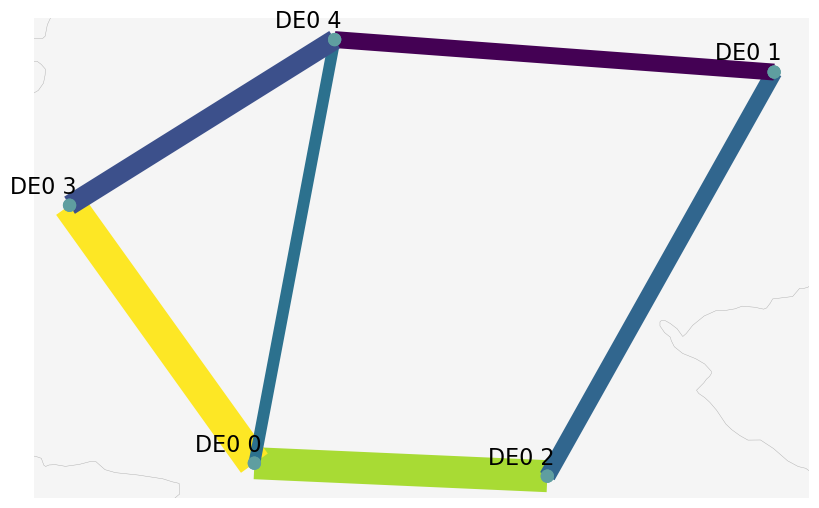

In [357]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [358]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


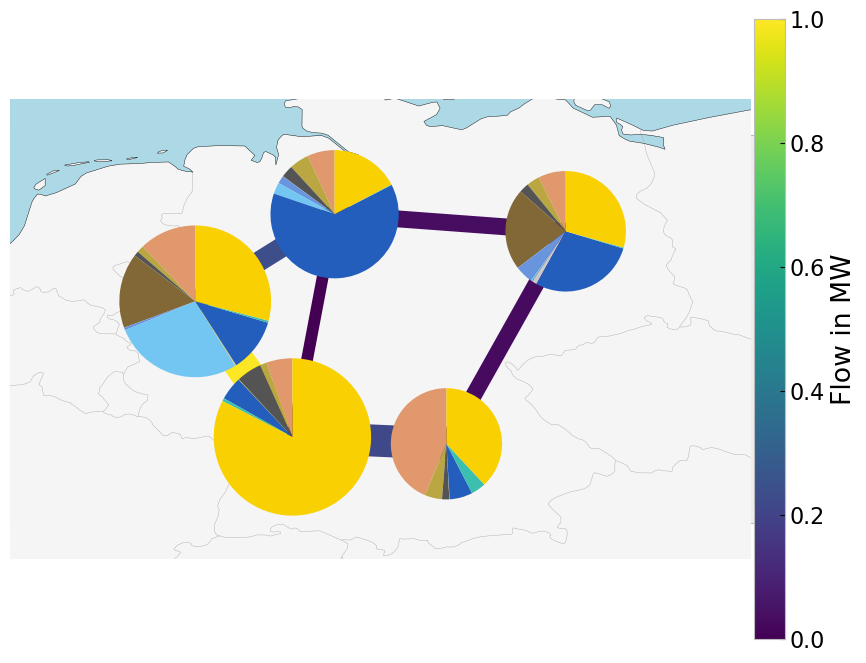

In [359]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [360]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


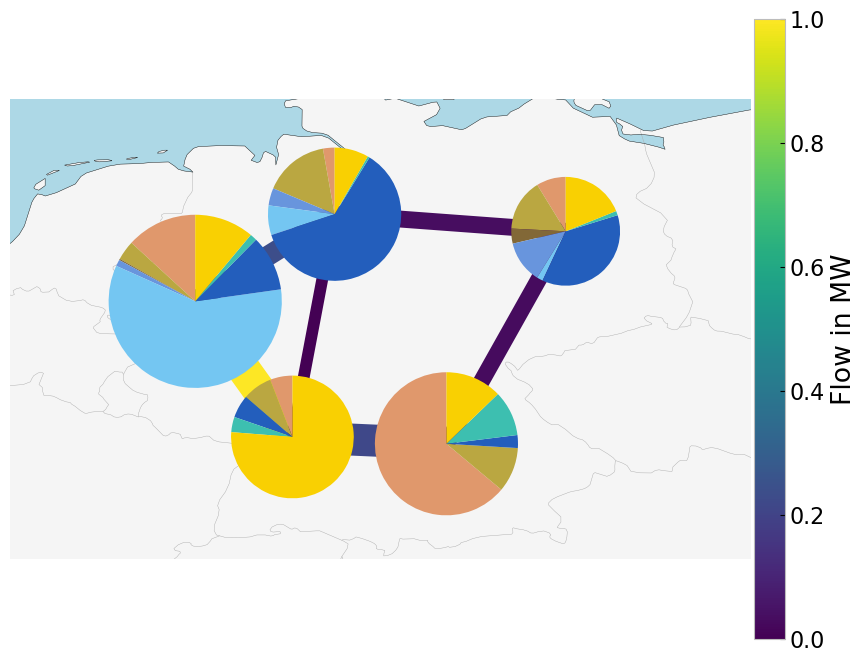

In [361]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

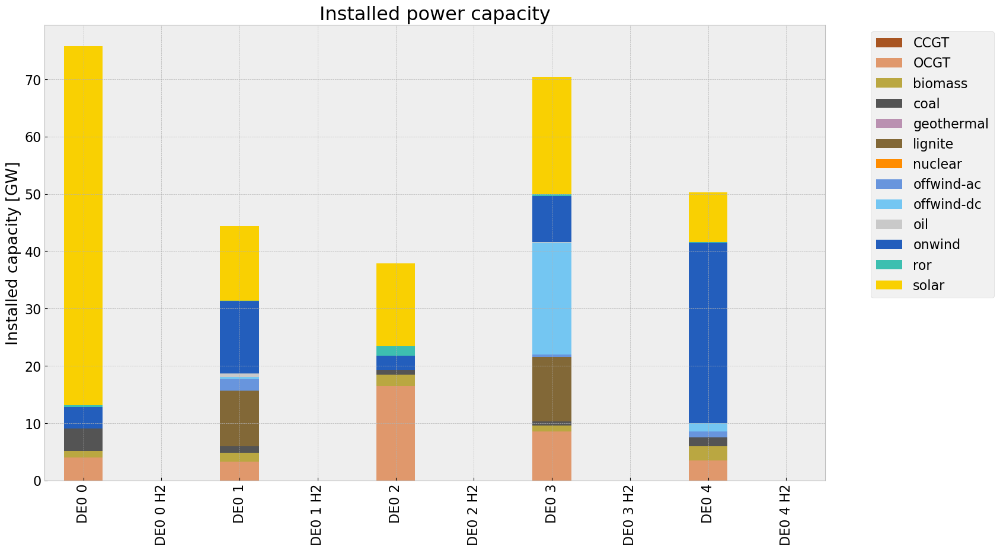

In [362]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

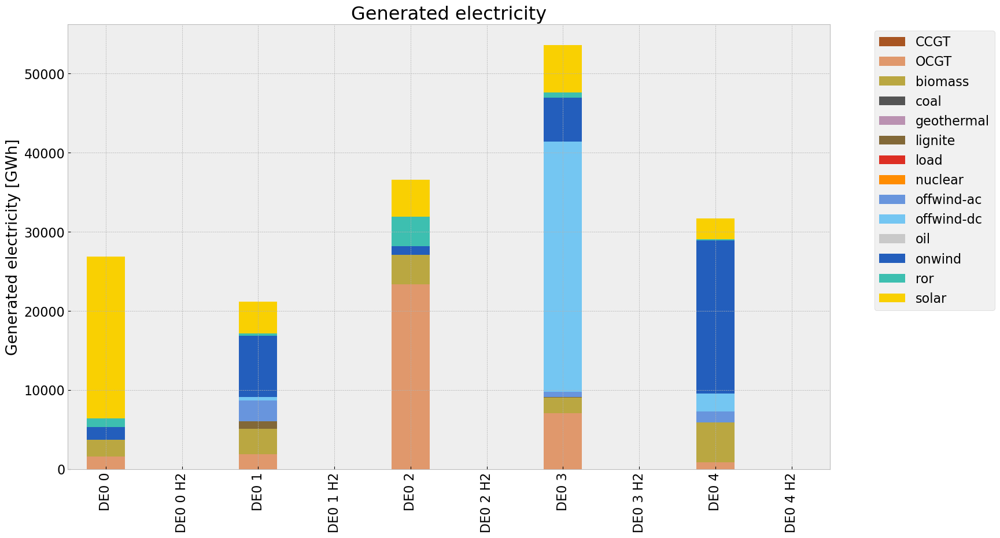

In [363]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [364]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3551839577.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3551839577.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3551839577.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()


In [365]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [366]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    links = links.drop(columns='DC', inplace=False)
    links['H2 fuel cell']*=-1
       
    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_no_H.where(p_no_H>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [367]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [368]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [369]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [370]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


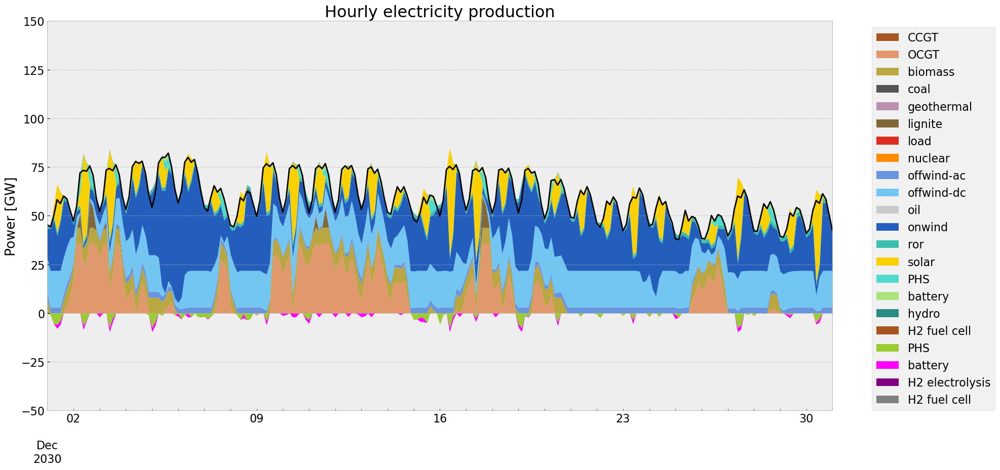

In [371]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


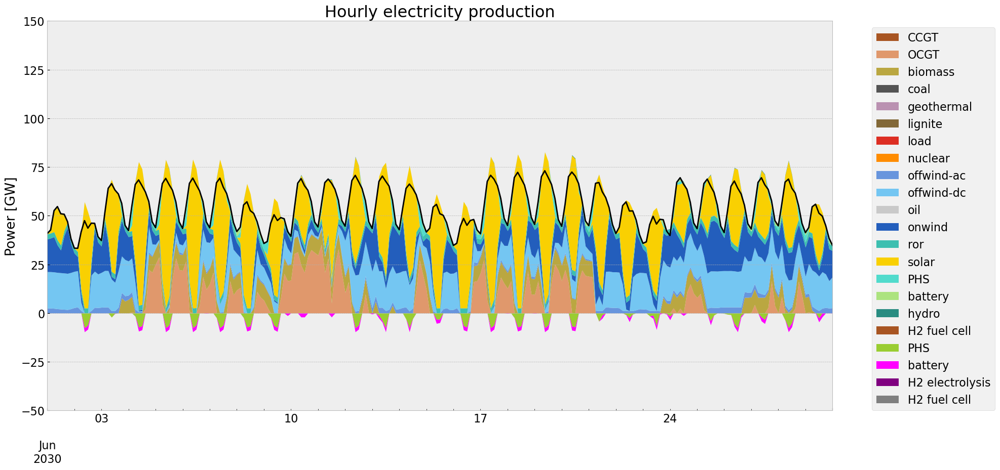

In [372]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [373]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,0.000000,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,0.000000,NaN


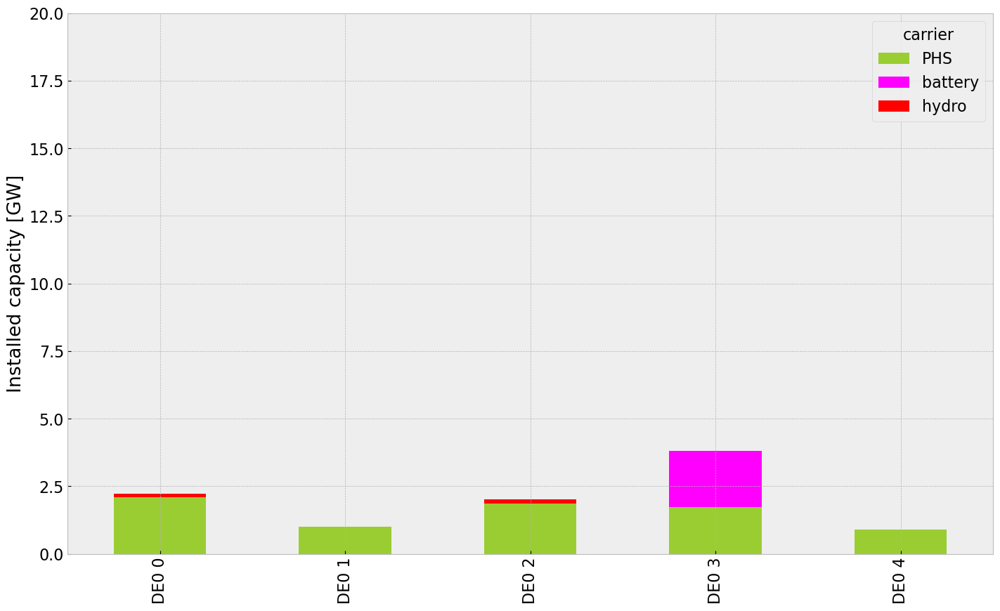

In [374]:
inst_store_table(n)

In [375]:
n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


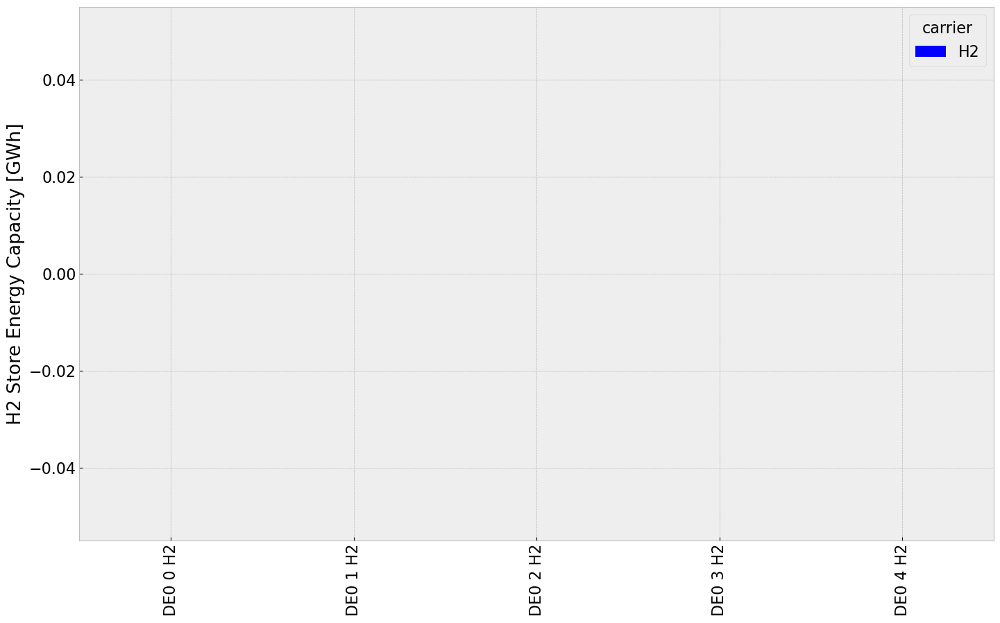

In [376]:
def inst_storeh2_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["blue"],
                                grid=True,
                                xlabel="",
                                ylabel="H2 Store Energy Capacity [GWh]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                #ylim=[0,7500]
    )

    return n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

inst_storeh2_table(n)

In [377]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,build_year,e_nom_opt,type,e_nom,e_nom_mod,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,standing_loss,lifetime
Store,,,,,,,,,,,,,,,,,,,,,,,,
DE0 0 H2,DE0 0 H2,H2,True,True,148.31893,0.010771,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 1 H2,DE0 1 H2,H2,True,True,148.31893,0.010254,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 2 H2,DE0 2 H2,H2,True,True,148.31893,0.010447,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 3 H2,DE0 3 H2,H2,True,True,148.31893,0.009032,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 4 H2,DE0 4 H2,H2,True,True,148.31893,0.010189,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf


In [378]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


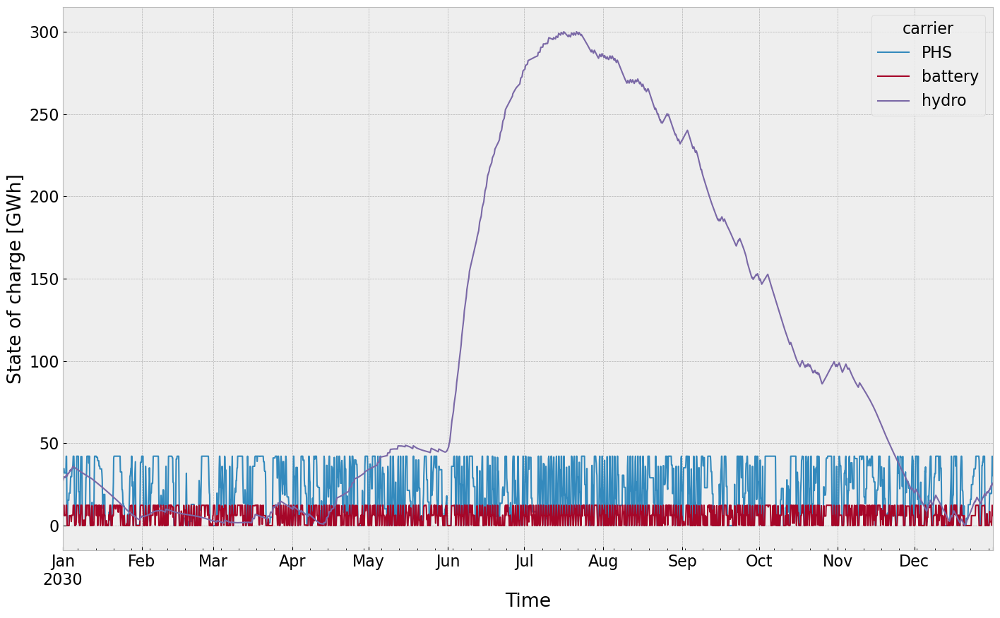

In [379]:
state_of_charge_plot(n)

## Electricity Price

In [380]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [381]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


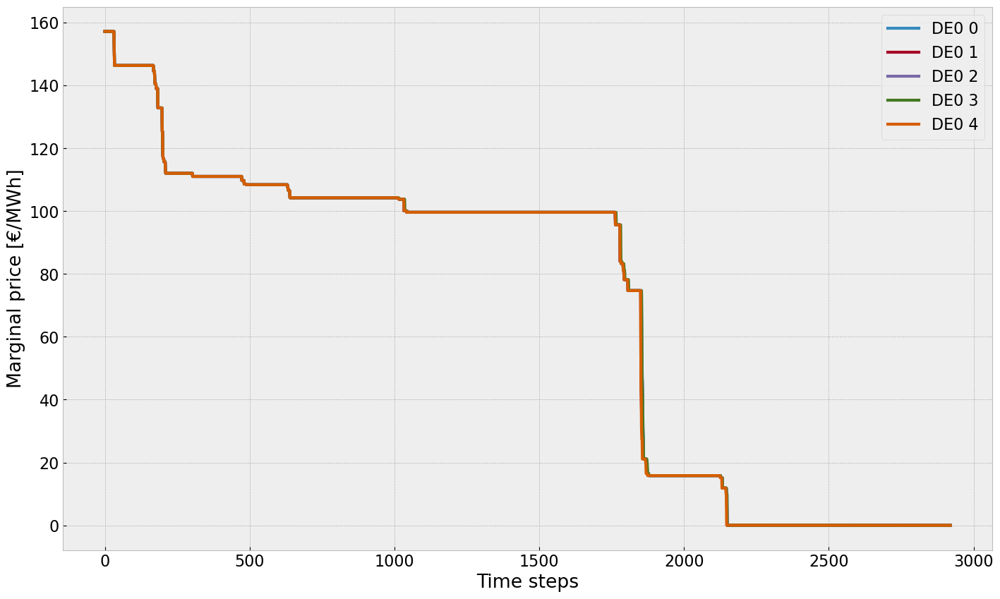

In [382]:
price_dur_curve_plot(n)

In [383]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

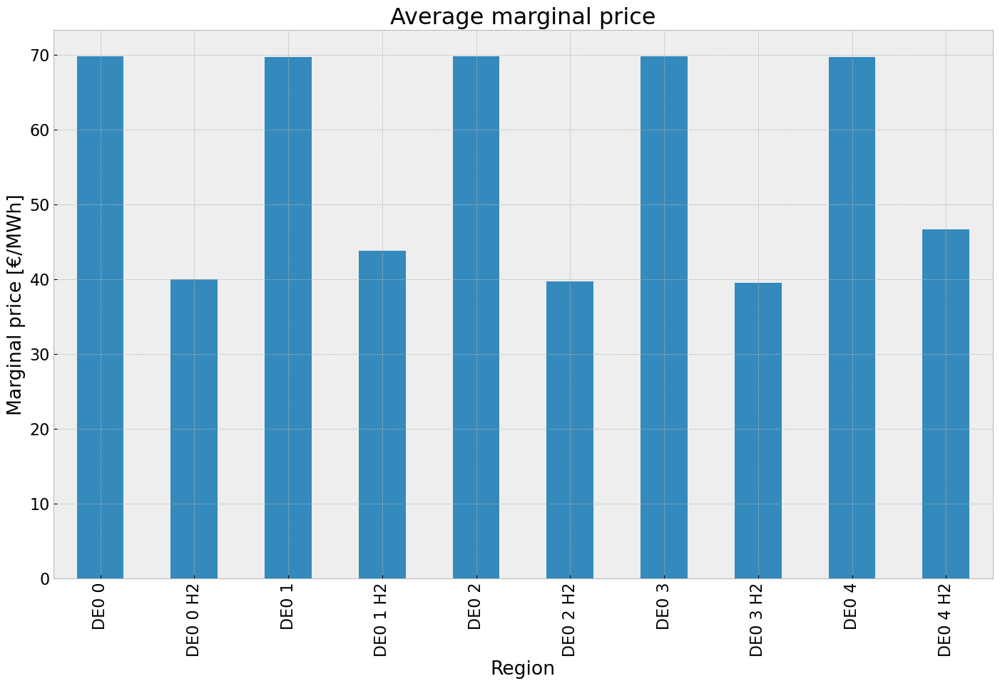

In [384]:
price_regions_table(n)

In [385]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    hprice = mean_p.filter(like='H2')
    eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(16, 8))
    
    # Plot for hprice
    hprice_plot = axs[0].hexbin(
        n.buses.x.filter(like='H2'),  # Assuming n.buses.x and n.buses.y hold the coordinates
        n.buses.y.filter(like='H2'),
        gridsize=20,
        C=hprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[0], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the first subplot
    cb = fig.colorbar(hprice_plot, ax=axs[0], location="bottom")
    cb.set_label("Mean H2 Marginal Price (EUR/MWh) for H2")

    # Plot for eprice
    eprice_plot = axs[1].hexbin(
        n.buses.x[~n.buses.x.index.str.contains('H2')],
        n.buses.y[~n.buses.x.index.str.contains('H2')],
        gridsize=20,
        C=eprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[1], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    cb = fig.colorbar(eprice_plot, ax=axs[1], location="bottom")
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")

    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


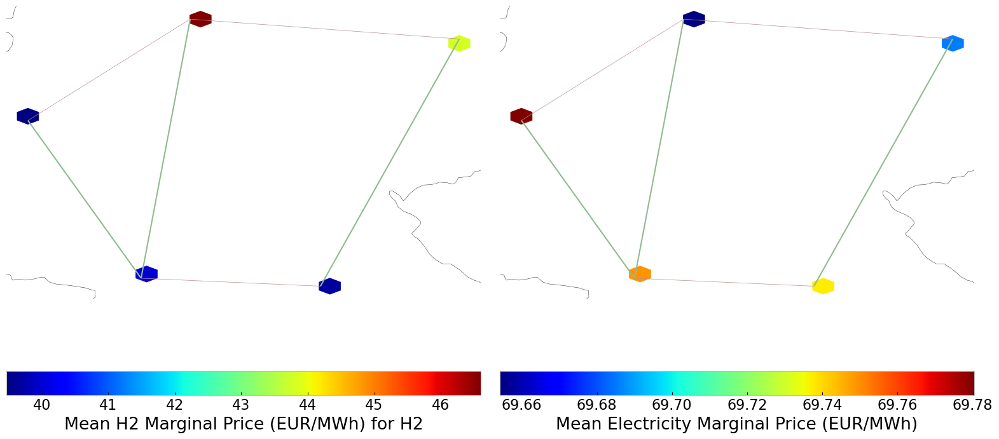

In [386]:
price_regions(n)

## Emission

In [387]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.475453e+07,0.499437,0.1980,1.377831e+07
biomass,1.604494e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.067147e+06,0.358368,0.4069,1.211667e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.633844e+06,1.000000,0.0000,0.000000e+00


# Offwind Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [388]:
#copy network
n1=n.copy()

#p_max_pu of offwind generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [389]:
n1.optimize.create_model()


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [390]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00,  9.55it/s]
INFO:linopy.io: Writing time: 11.75s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qsv0n_2p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qsv0n_2p.lp


Reading time = 3.35 seconds


INFO:gurobipy:Reading time = 3.35 seconds


obj: 849796 rows, 402989 columns, 1550697 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1550697 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1550697 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1550697 nonzeros


Model fingerprint: 0x0c9017f4


INFO:gurobipy:Model fingerprint: 0x0c9017f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 609749 rows and 116762 columns


INFO:gurobipy:Presolve removed 609749 rows and 116762 columns


Presolve time: 1.91s


INFO:gurobipy:Presolve time: 1.91s


Presolved: 240047 rows, 286227 columns, 853899 nonzeros


INFO:gurobipy:Presolved: 240047 rows, 286227 columns, 853899 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.42s


INFO:gurobipy:Ordering time: 0.42s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 45


INFO:gurobipy: Dense cols : 45


 AA' NZ     : 8.218e+05


INFO:gurobipy: AA' NZ     : 8.218e+05


 Factor NZ  : 4.313e+06 (roughly 250 MB of memory)


INFO:gurobipy: Factor NZ  : 4.313e+06 (roughly 250 MB of memory)


 Factor Ops : 2.621e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.621e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.38279811e+17 -1.33356692e+18  4.61e+09 4.31e+04  3.97e+13     3s


INFO:gurobipy:   0   1.38279811e+17 -1.33356692e+18  4.61e+09 4.31e+04  3.97e+13     3s


   1   1.26941595e+17 -4.79559745e+17  4.05e+09 1.36e+04  2.35e+13     4s


INFO:gurobipy:   1   1.26941595e+17 -4.79559745e+17  4.05e+09 1.36e+04  2.35e+13     4s


   2   1.07529754e+17 -3.30076793e+17  3.01e+09 8.02e+03  1.66e+13     5s


INFO:gurobipy:   2   1.07529754e+17 -3.30076793e+17  3.01e+09 8.02e+03  1.66e+13     5s


   3   8.45189298e+16 -1.22708501e+17  1.56e+09 1.63e+03  8.12e+12     5s


INFO:gurobipy:   3   8.45189298e+16 -1.22708501e+17  1.56e+09 1.63e+03  8.12e+12     5s


   4   4.13083331e+16 -1.75280164e+16  2.91e+08 2.49e+02  1.54e+12     6s


INFO:gurobipy:   4   4.13083331e+16 -1.75280164e+16  2.91e+08 2.49e+02  1.54e+12     6s


   5   7.28927572e+15 -2.67631781e+15  1.30e+07 3.60e+01  8.89e+10     7s


INFO:gurobipy:   5   7.28927572e+15 -2.67631781e+15  1.30e+07 3.60e+01  8.89e+10     7s


   6   1.29760872e+15 -3.09438966e+14  3.98e+05 3.13e+00  5.10e+09     7s


INFO:gurobipy:   6   1.29760872e+15 -3.09438966e+14  3.98e+05 3.13e+00  5.10e+09     7s


   7   2.64975769e+14 -7.01572726e+13  6.37e+04 1.19e-01  8.43e+08     8s


INFO:gurobipy:   7   2.64975769e+14 -7.01572726e+13  6.37e+04 1.19e-01  8.43e+08     8s


   8   1.77700242e+14 -2.16622033e+13  4.21e+04 4.42e-04  4.73e+08     9s


INFO:gurobipy:   8   1.77700242e+14 -2.16622033e+13  4.21e+04 4.42e-04  4.73e+08     9s


   9   2.85039025e+13 -1.32539093e+13  5.84e+03 8.48e-07  8.63e+07     9s


INFO:gurobipy:   9   2.85039025e+13 -1.32539093e+13  5.84e+03 8.48e-07  8.63e+07     9s


  10   1.08995940e+13 -2.44748605e+12  2.15e+03 2.88e-07  2.53e+07    10s


INFO:gurobipy:  10   1.08995940e+13 -2.44748605e+12  2.15e+03 2.88e-07  2.53e+07    10s


  11   2.03803515e+12 -5.22501211e+11  3.92e+02 2.19e-08  4.54e+06    10s


INFO:gurobipy:  11   2.03803515e+12 -5.22501211e+11  3.92e+02 2.19e-08  4.54e+06    10s


  12   1.70912633e+12 -4.24163248e+11  3.30e+02 1.58e-08  3.74e+06    10s


INFO:gurobipy:  12   1.70912633e+12 -4.24163248e+11  3.30e+02 1.58e-08  3.74e+06    10s


  13   8.67304245e+11 -2.98240083e+11  1.64e+02 8.85e-09  2.01e+06    11s


INFO:gurobipy:  13   8.67304245e+11 -2.98240083e+11  1.64e+02 8.85e-09  2.01e+06    11s


  14   6.48492707e+11 -2.55981062e+11  1.21e+02 9.17e-09  1.55e+06    11s


INFO:gurobipy:  14   6.48492707e+11 -2.55981062e+11  1.21e+02 9.17e-09  1.55e+06    11s


  15   5.15592337e+11 -2.35626058e+11  9.25e+01 7.97e-09  1.28e+06    12s


INFO:gurobipy:  15   5.15592337e+11 -2.35626058e+11  9.25e+01 7.97e-09  1.28e+06    12s


  16   3.25928175e+11 -1.81473670e+11  5.28e+01 6.82e-09  8.57e+05    12s


INFO:gurobipy:  16   3.25928175e+11 -1.81473670e+11  5.28e+01 6.82e-09  8.57e+05    12s


  17   2.87777962e+11 -1.51370428e+11  4.44e+01 4.93e-09  7.40e+05    13s


INFO:gurobipy:  17   2.87777962e+11 -1.51370428e+11  4.44e+01 4.93e-09  7.40e+05    13s


  18   2.22499901e+11 -1.30259120e+11  3.34e+01 4.78e-09  5.92e+05    13s


INFO:gurobipy:  18   2.22499901e+11 -1.30259120e+11  3.34e+01 4.78e-09  5.92e+05    13s


  19   1.68408789e+11 -8.53085332e+10  2.42e+01 4.24e-09  4.24e+05    14s


INFO:gurobipy:  19   1.68408789e+11 -8.53085332e+10  2.42e+01 4.24e-09  4.24e+05    14s


  20   1.18195644e+11 -5.70439029e+10  1.61e+01 3.25e-09  2.92e+05    15s


INFO:gurobipy:  20   1.18195644e+11 -5.70439029e+10  1.61e+01 3.25e-09  2.92e+05    15s


  21   8.33260943e+10 -2.18141040e+10  9.77e+00 1.80e-09  1.75e+05    15s


INFO:gurobipy:  21   8.33260943e+10 -2.18141040e+10  9.77e+00 1.80e-09  1.75e+05    15s


  22   7.56380873e+10 -3.36121887e+09  8.44e+00 1.18e-09  1.31e+05    16s


INFO:gurobipy:  22   7.56380873e+10 -3.36121887e+09  8.44e+00 1.18e-09  1.31e+05    16s


  23   6.04308793e+10  4.85649085e+09  5.83e+00 4.00e-10  9.20e+04    17s


INFO:gurobipy:  23   6.04308793e+10  4.85649085e+09  5.83e+00 4.00e-10  9.20e+04    17s


  24   5.31321669e+10  8.28325117e+09  4.51e+00 1.87e-09  7.42e+04    17s


INFO:gurobipy:  24   5.31321669e+10  8.28325117e+09  4.51e+00 1.87e-09  7.42e+04    17s


  25   4.93242960e+10  1.17678787e+10  3.79e+00 1.48e-09  6.22e+04    17s


INFO:gurobipy:  25   4.93242960e+10  1.17678787e+10  3.79e+00 1.48e-09  6.22e+04    17s


  26   4.28318891e+10  1.46725161e+10  2.73e+00 1.81e-09  4.66e+04    18s


INFO:gurobipy:  26   4.28318891e+10  1.46725161e+10  2.73e+00 1.81e-09  4.66e+04    18s


  27   3.85023884e+10  1.58114751e+10  1.94e+00 1.41e-09  3.75e+04    18s


INFO:gurobipy:  27   3.85023884e+10  1.58114751e+10  1.94e+00 1.41e-09  3.75e+04    18s


  28   3.60318493e+10  1.78968059e+10  1.47e+00 1.13e-09  3.00e+04    19s


INFO:gurobipy:  28   3.60318493e+10  1.78968059e+10  1.47e+00 1.13e-09  3.00e+04    19s


  29   3.44277665e+10  1.99872975e+10  1.14e+00 8.66e-10  2.39e+04    20s


INFO:gurobipy:  29   3.44277665e+10  1.99872975e+10  1.14e+00 8.66e-10  2.39e+04    20s


  30   3.30262780e+10  2.13213165e+10  8.65e-01 7.06e-10  1.94e+04    20s


INFO:gurobipy:  30   3.30262780e+10  2.13213165e+10  8.65e-01 7.06e-10  1.94e+04    20s


  31   3.19930753e+10  2.25487477e+10  6.62e-01 1.05e-09  1.56e+04    21s


INFO:gurobipy:  31   3.19930753e+10  2.25487477e+10  6.62e-01 1.05e-09  1.56e+04    21s


  32   3.11710638e+10  2.33142930e+10  5.02e-01 8.38e-10  1.30e+04    21s


INFO:gurobipy:  32   3.11710638e+10  2.33142930e+10  5.02e-01 8.38e-10  1.30e+04    21s


  33   3.07427968e+10  2.38308350e+10  4.22e-01 4.75e-10  1.14e+04    22s


INFO:gurobipy:  33   3.07427968e+10  2.38308350e+10  4.22e-01 4.75e-10  1.14e+04    22s


  34   3.01706513e+10  2.48414880e+10  3.17e-01 4.22e-10  8.81e+03    23s


INFO:gurobipy:  34   3.01706513e+10  2.48414880e+10  3.17e-01 4.22e-10  8.81e+03    23s


  35   2.98279109e+10  2.53024560e+10  2.57e-01 3.38e-10  7.48e+03    23s


INFO:gurobipy:  35   2.98279109e+10  2.53024560e+10  2.57e-01 3.38e-10  7.48e+03    23s


  36   2.96652718e+10  2.55267552e+10  2.30e-01 4.91e-10  6.84e+03    24s


INFO:gurobipy:  36   2.96652718e+10  2.55267552e+10  2.30e-01 4.91e-10  6.84e+03    24s


  37   2.95910767e+10  2.56117598e+10  2.18e-01 4.88e-10  6.58e+03    25s


INFO:gurobipy:  37   2.95910767e+10  2.56117598e+10  2.18e-01 4.88e-10  6.58e+03    25s


  38   2.93444512e+10  2.61486082e+10  1.78e-01 4.13e-10  5.28e+03    25s


INFO:gurobipy:  38   2.93444512e+10  2.61486082e+10  1.78e-01 4.13e-10  5.28e+03    25s


  39   2.91180203e+10  2.63387245e+10  1.43e-01 7.30e-10  4.59e+03    26s


INFO:gurobipy:  39   2.91180203e+10  2.63387245e+10  1.43e-01 7.30e-10  4.59e+03    26s


  40   2.89425579e+10  2.64813430e+10  1.15e-01 3.74e-10  4.07e+03    26s


INFO:gurobipy:  40   2.89425579e+10  2.64813430e+10  1.15e-01 3.74e-10  4.07e+03    26s


  41   2.88285748e+10  2.67481618e+10  9.69e-02 4.00e-10  3.44e+03    27s


INFO:gurobipy:  41   2.88285748e+10  2.67481618e+10  9.69e-02 4.00e-10  3.44e+03    27s


  42   2.87410127e+10  2.69266895e+10  8.35e-02 3.53e-10  3.00e+03    27s


INFO:gurobipy:  42   2.87410127e+10  2.69266895e+10  8.35e-02 3.53e-10  3.00e+03    27s


  43   2.86312372e+10  2.70286043e+10  6.70e-02 4.09e-10  2.65e+03    28s


INFO:gurobipy:  43   2.86312372e+10  2.70286043e+10  6.70e-02 4.09e-10  2.65e+03    28s


  44   2.85970356e+10  2.70717322e+10  6.18e-02 5.14e-10  2.52e+03    28s


INFO:gurobipy:  44   2.85970356e+10  2.70717322e+10  6.18e-02 5.14e-10  2.52e+03    28s


  45   2.85432517e+10  2.72022678e+10  5.41e-02 2.96e-10  2.22e+03    29s


INFO:gurobipy:  45   2.85432517e+10  2.72022678e+10  5.41e-02 2.96e-10  2.22e+03    29s


  46   2.85219659e+10  2.72232413e+10  5.10e-02 3.57e-10  2.15e+03    29s


INFO:gurobipy:  46   2.85219659e+10  2.72232413e+10  5.10e-02 3.57e-10  2.15e+03    29s


  47   2.84824384e+10  2.72835792e+10  4.54e-02 5.23e-10  1.98e+03    30s


INFO:gurobipy:  47   2.84824384e+10  2.72835792e+10  4.54e-02 5.23e-10  1.98e+03    30s


  48   2.84239370e+10  2.73495785e+10  3.73e-02 6.78e-10  1.78e+03    31s


INFO:gurobipy:  48   2.84239370e+10  2.73495785e+10  3.73e-02 6.78e-10  1.78e+03    31s


  49   2.83966137e+10  2.74645115e+10  3.36e-02 3.53e-10  1.54e+03    31s


INFO:gurobipy:  49   2.83966137e+10  2.74645115e+10  3.36e-02 3.53e-10  1.54e+03    31s


  50   2.83571609e+10  2.75113776e+10  2.86e-02 1.59e-10  1.40e+03    32s


INFO:gurobipy:  50   2.83571609e+10  2.75113776e+10  2.86e-02 1.59e-10  1.40e+03    32s


  51   2.83220693e+10  2.75543914e+10  2.40e-02 2.67e-10  1.27e+03    32s


INFO:gurobipy:  51   2.83220693e+10  2.75543914e+10  2.40e-02 2.67e-10  1.27e+03    32s


  52   2.82941632e+10  2.76374310e+10  2.03e-02 3.86e-10  1.09e+03    33s


INFO:gurobipy:  52   2.82941632e+10  2.76374310e+10  2.03e-02 3.86e-10  1.09e+03    33s


  53   2.82723308e+10  2.76870956e+10  1.76e-02 4.45e-10  9.67e+02    33s


INFO:gurobipy:  53   2.82723308e+10  2.76870956e+10  1.76e-02 4.45e-10  9.67e+02    33s


  54   2.82581540e+10  2.77206246e+10  1.59e-02 2.09e-10  8.88e+02    34s


INFO:gurobipy:  54   2.82581540e+10  2.77206246e+10  1.59e-02 2.09e-10  8.88e+02    34s


  55   2.82481959e+10  2.77338518e+10  1.46e-02 1.44e-10  8.50e+02    35s


INFO:gurobipy:  55   2.82481959e+10  2.77338518e+10  1.46e-02 1.44e-10  8.50e+02    35s


  56   2.82322423e+10  2.77691022e+10  1.27e-02 2.73e-10  7.65e+02    35s


INFO:gurobipy:  56   2.82322423e+10  2.77691022e+10  1.27e-02 2.73e-10  7.65e+02    35s


  57   2.82262497e+10  2.77868370e+10  1.20e-02 3.20e-10  7.26e+02    36s


INFO:gurobipy:  57   2.82262497e+10  2.77868370e+10  1.20e-02 3.20e-10  7.26e+02    36s


  58   2.82187542e+10  2.78032727e+10  1.11e-02 3.43e-10  6.87e+02    36s


INFO:gurobipy:  58   2.82187542e+10  2.78032727e+10  1.11e-02 3.43e-10  6.87e+02    36s


  59   2.82090813e+10  2.78191310e+10  9.92e-03 2.37e-10  6.44e+02    37s


INFO:gurobipy:  59   2.82090813e+10  2.78191310e+10  9.92e-03 2.37e-10  6.44e+02    37s


  60   2.82038988e+10  2.78555545e+10  9.25e-03 3.44e-10  5.76e+02    37s


INFO:gurobipy:  60   2.82038988e+10  2.78555545e+10  9.25e-03 3.44e-10  5.76e+02    37s


  61   2.81887071e+10  2.78795199e+10  7.59e-03 2.90e-10  5.11e+02    38s


INFO:gurobipy:  61   2.81887071e+10  2.78795199e+10  7.59e-03 2.90e-10  5.11e+02    38s


  62   2.81807624e+10  2.79031616e+10  6.68e-03 3.57e-10  4.59e+02    39s


INFO:gurobipy:  62   2.81807624e+10  2.79031616e+10  6.68e-03 3.57e-10  4.59e+02    39s


  63   2.81757349e+10  2.79233719e+10  6.12e-03 3.71e-10  4.17e+02    39s


INFO:gurobipy:  63   2.81757349e+10  2.79233719e+10  6.12e-03 3.71e-10  4.17e+02    39s


  64   2.81688312e+10  2.79362774e+10  5.19e-03 2.04e-10  3.84e+02    40s


INFO:gurobipy:  64   2.81688312e+10  2.79362774e+10  5.19e-03 2.04e-10  3.84e+02    40s


  65   2.81622199e+10  2.79598483e+10  4.47e-03 1.56e-10  3.34e+02    41s


INFO:gurobipy:  65   2.81622199e+10  2.79598483e+10  4.47e-03 1.56e-10  3.34e+02    41s


  66   2.81565133e+10  2.79725659e+10  3.85e-03 3.82e-10  3.04e+02    41s


INFO:gurobipy:  66   2.81565133e+10  2.79725659e+10  3.85e-03 3.82e-10  3.04e+02    41s


  67   2.81535379e+10  2.79900611e+10  3.54e-03 4.52e-10  2.70e+02    42s


INFO:gurobipy:  67   2.81535379e+10  2.79900611e+10  3.54e-03 4.52e-10  2.70e+02    42s


  68   2.81499602e+10  2.79998673e+10  3.16e-03 2.28e-10  2.48e+02    42s


INFO:gurobipy:  68   2.81499602e+10  2.79998673e+10  3.16e-03 2.28e-10  2.48e+02    42s


  69   2.81448978e+10  2.80075734e+10  2.62e-03 2.43e-10  2.27e+02    43s


INFO:gurobipy:  69   2.81448978e+10  2.80075734e+10  2.62e-03 2.43e-10  2.27e+02    43s


  70   2.81422813e+10  2.80218119e+10  2.34e-03 2.74e-10  1.99e+02    43s


INFO:gurobipy:  70   2.81422813e+10  2.80218119e+10  2.34e-03 2.74e-10  1.99e+02    43s


  71   2.81396086e+10  2.80294693e+10  2.06e-03 3.27e-10  1.82e+02    44s


INFO:gurobipy:  71   2.81396086e+10  2.80294693e+10  2.06e-03 3.27e-10  1.82e+02    44s


  72   2.81385027e+10  2.80368614e+10  1.91e-03 1.44e-10  1.68e+02    44s


INFO:gurobipy:  72   2.81385027e+10  2.80368614e+10  1.91e-03 1.44e-10  1.68e+02    44s


  73   2.81360687e+10  2.80428513e+10  1.65e-03 6.42e-10  1.54e+02    45s


INFO:gurobipy:  73   2.81360687e+10  2.80428513e+10  1.65e-03 6.42e-10  1.54e+02    45s


  74   2.81357155e+10  2.80441575e+10  1.61e-03 1.58e-10  1.51e+02    45s


INFO:gurobipy:  74   2.81357155e+10  2.80441575e+10  1.61e-03 1.58e-10  1.51e+02    45s


  75   2.81347646e+10  2.80473464e+10  1.50e-03 3.09e-10  1.44e+02    46s


INFO:gurobipy:  75   2.81347646e+10  2.80473464e+10  1.50e-03 3.09e-10  1.44e+02    46s


  76   2.81327941e+10  2.80518348e+10  1.29e-03 2.27e-10  1.34e+02    46s


INFO:gurobipy:  76   2.81327941e+10  2.80518348e+10  1.29e-03 2.27e-10  1.34e+02    46s


  77   2.81318526e+10  2.80570369e+10  1.20e-03 4.50e-10  1.24e+02    47s


INFO:gurobipy:  77   2.81318526e+10  2.80570369e+10  1.20e-03 4.50e-10  1.24e+02    47s


  78   2.81301618e+10  2.80645994e+10  1.01e-03 7.27e-10  1.08e+02    47s


INFO:gurobipy:  78   2.81301618e+10  2.80645994e+10  1.01e-03 7.27e-10  1.08e+02    47s


  79   2.81285674e+10  2.80683515e+10  8.30e-04 1.98e-10  9.95e+01    48s


INFO:gurobipy:  79   2.81285674e+10  2.80683515e+10  8.30e-04 1.98e-10  9.95e+01    48s


  80   2.81269703e+10  2.80742952e+10  6.51e-04 1.21e-10  8.70e+01    48s


INFO:gurobipy:  80   2.81269703e+10  2.80742952e+10  6.51e-04 1.21e-10  8.70e+01    48s


  81   2.81266034e+10  2.80792351e+10  6.01e-04 1.99e-10  7.83e+01    49s


INFO:gurobipy:  81   2.81266034e+10  2.80792351e+10  6.01e-04 1.99e-10  7.83e+01    49s


  82   2.81260756e+10  2.80827682e+10  5.50e-04 3.12e-10  7.16e+01    49s


INFO:gurobipy:  82   2.81260756e+10  2.80827682e+10  5.50e-04 3.12e-10  7.16e+01    49s


  83   2.81251523e+10  2.80861558e+10  4.52e-04 3.30e-10  6.44e+01    50s


INFO:gurobipy:  83   2.81251523e+10  2.80861558e+10  4.52e-04 3.30e-10  6.44e+01    50s


  84   2.81244413e+10  2.80883007e+10  3.78e-04 3.70e-10  5.97e+01    51s


INFO:gurobipy:  84   2.81244413e+10  2.80883007e+10  3.78e-04 3.70e-10  5.97e+01    51s


  85   2.81242138e+10  2.80918271e+10  3.50e-04 2.97e-10  5.35e+01    51s


INFO:gurobipy:  85   2.81242138e+10  2.80918271e+10  3.50e-04 2.97e-10  5.35e+01    51s


  86   2.81238450e+10  2.80949365e+10  3.16e-04 4.21e-10  4.78e+01    52s


INFO:gurobipy:  86   2.81238450e+10  2.80949365e+10  3.16e-04 4.21e-10  4.78e+01    52s


  87   2.81235721e+10  2.80958958e+10  2.87e-04 3.67e-10  4.57e+01    52s


INFO:gurobipy:  87   2.81235721e+10  2.80958958e+10  2.87e-04 3.67e-10  4.57e+01    52s


  88   2.81230179e+10  2.81016254e+10  2.26e-04 3.58e-10  3.53e+01    53s


INFO:gurobipy:  88   2.81230179e+10  2.81016254e+10  2.26e-04 3.58e-10  3.53e+01    53s


  89   2.81226715e+10  2.81030020e+10  1.93e-04 5.15e-10  3.25e+01    53s


INFO:gurobipy:  89   2.81226715e+10  2.81030020e+10  1.93e-04 5.15e-10  3.25e+01    53s


  90   2.81222785e+10  2.81056958e+10  1.57e-04 2.16e-10  2.74e+01    54s


INFO:gurobipy:  90   2.81222785e+10  2.81056958e+10  1.57e-04 2.16e-10  2.74e+01    54s


  91   2.81220560e+10  2.81066700e+10  1.38e-04 3.91e-10  2.54e+01    54s


INFO:gurobipy:  91   2.81220560e+10  2.81066700e+10  1.38e-04 3.91e-10  2.54e+01    54s


  92   2.81218629e+10  2.81081949e+10  1.21e-04 7.79e-10  2.26e+01    55s


INFO:gurobipy:  92   2.81218629e+10  2.81081949e+10  1.21e-04 7.79e-10  2.26e+01    55s


  93   2.81217345e+10  2.81093101e+10  1.10e-04 2.91e-10  2.05e+01    57s


INFO:gurobipy:  93   2.81217345e+10  2.81093101e+10  1.10e-04 2.91e-10  2.05e+01    57s


  94   2.81216474e+10  2.81099916e+10  1.03e-04 5.45e-10  1.93e+01    57s


INFO:gurobipy:  94   2.81216474e+10  2.81099916e+10  1.03e-04 5.45e-10  1.93e+01    57s


  95   2.81215867e+10  2.81127908e+10  9.75e-05 1.56e-10  1.45e+01    58s


INFO:gurobipy:  95   2.81215867e+10  2.81127908e+10  9.75e-05 1.56e-10  1.45e+01    58s


  96   2.81214084e+10  2.81138739e+10  8.09e-05 2.93e-10  1.25e+01    58s


INFO:gurobipy:  96   2.81214084e+10  2.81138739e+10  8.09e-05 2.93e-10  1.25e+01    58s


  97   2.81212714e+10  2.81154273e+10  6.93e-05 3.91e-10  9.66e+00    59s


INFO:gurobipy:  97   2.81212714e+10  2.81154273e+10  6.93e-05 3.91e-10  9.66e+00    59s


  98   2.81211407e+10  2.81157845e+10  5.87e-05 2.58e-10  8.85e+00    59s


INFO:gurobipy:  98   2.81211407e+10  2.81157845e+10  5.87e-05 2.58e-10  8.85e+00    59s


  99   2.81210454e+10  2.81158357e+10  5.13e-05 2.07e-10  8.61e+00    60s


INFO:gurobipy:  99   2.81210454e+10  2.81158357e+10  5.13e-05 2.07e-10  8.61e+00    60s


 100   2.81210078e+10  2.81162297e+10  4.84e-05 4.58e-10  7.90e+00    60s


INFO:gurobipy: 100   2.81210078e+10  2.81162297e+10  4.84e-05 4.58e-10  7.90e+00    60s


 101   2.81209603e+10  2.81164989e+10  4.47e-05 2.95e-10  7.37e+00    61s


INFO:gurobipy: 101   2.81209603e+10  2.81164989e+10  4.47e-05 2.95e-10  7.37e+00    61s


 102   2.81208831e+10  2.81168293e+10  3.87e-05 3.08e-10  6.70e+00    61s


INFO:gurobipy: 102   2.81208831e+10  2.81168293e+10  3.87e-05 3.08e-10  6.70e+00    61s


 103   2.81207825e+10  2.81177199e+10  3.12e-05 5.13e-10  5.06e+00    62s


INFO:gurobipy: 103   2.81207825e+10  2.81177199e+10  3.12e-05 5.13e-10  5.06e+00    62s


 104   2.81207030e+10  2.81178526e+10  2.61e-05 3.34e-10  4.71e+00    62s


INFO:gurobipy: 104   2.81207030e+10  2.81178526e+10  2.61e-05 3.34e-10  4.71e+00    62s


 105   2.81206701e+10  2.81180385e+10  2.36e-05 4.17e-10  4.35e+00    63s


INFO:gurobipy: 105   2.81206701e+10  2.81180385e+10  2.36e-05 4.17e-10  4.35e+00    63s


 106   2.81205973e+10  2.81187658e+10  1.90e-05 4.62e-10  3.03e+00    64s


INFO:gurobipy: 106   2.81205973e+10  2.81187658e+10  1.90e-05 4.62e-10  3.03e+00    64s


 107   2.81205684e+10  2.81189973e+10  1.73e-05 6.58e-10  2.60e+00    64s


INFO:gurobipy: 107   2.81205684e+10  2.81189973e+10  1.73e-05 6.58e-10  2.60e+00    64s


 108   2.81205235e+10  2.81192372e+10  1.76e-05 4.07e-10  2.13e+00    65s


INFO:gurobipy: 108   2.81205235e+10  2.81192372e+10  1.76e-05 4.07e-10  2.13e+00    65s


 109   2.81204893e+10  2.81193749e+10  1.50e-05 7.02e-10  1.84e+00    65s


INFO:gurobipy: 109   2.81204893e+10  2.81193749e+10  1.50e-05 7.02e-10  1.84e+00    65s


 110   2.81204773e+10  2.81194180e+10  1.41e-05 2.33e-10  1.75e+00    66s


INFO:gurobipy: 110   2.81204773e+10  2.81194180e+10  1.41e-05 2.33e-10  1.75e+00    66s


 111   2.81204448e+10  2.81195309e+10  1.41e-05 3.35e-10  1.51e+00    66s


INFO:gurobipy: 111   2.81204448e+10  2.81195309e+10  1.41e-05 3.35e-10  1.51e+00    66s


 112   2.81204288e+10  2.81196366e+10  1.32e-05 3.67e-10  1.31e+00    67s


INFO:gurobipy: 112   2.81204288e+10  2.81196366e+10  1.32e-05 3.67e-10  1.31e+00    67s


 113   2.81204046e+10  2.81197142e+10  1.14e-05 2.27e-10  1.14e+00    68s


INFO:gurobipy: 113   2.81204046e+10  2.81197142e+10  1.14e-05 2.27e-10  1.14e+00    68s


 114   2.81203677e+10  2.81198073e+10  1.05e-05 4.66e-10  9.26e-01    69s


INFO:gurobipy: 114   2.81203677e+10  2.81198073e+10  1.05e-05 4.66e-10  9.26e-01    69s


 115   2.81203546e+10  2.81198577e+10  9.43e-06 5.17e-10  8.21e-01    70s


INFO:gurobipy: 115   2.81203546e+10  2.81198577e+10  9.43e-06 5.17e-10  8.21e-01    70s


 116   2.81203457e+10  2.81198717e+10  8.66e-06 3.97e-10  7.83e-01    70s


INFO:gurobipy: 116   2.81203457e+10  2.81198717e+10  8.66e-06 3.97e-10  7.83e-01    70s


 117   2.81203431e+10  2.81199000e+10  8.43e-06 2.12e-10  7.32e-01    71s


INFO:gurobipy: 117   2.81203431e+10  2.81199000e+10  8.43e-06 2.12e-10  7.32e-01    71s


 118   2.81203273e+10  2.81199066e+10  7.16e-06 2.02e-10  6.95e-01    72s


INFO:gurobipy: 118   2.81203273e+10  2.81199066e+10  7.16e-06 2.02e-10  6.95e-01    72s


 119   2.81203102e+10  2.81200734e+10  6.15e-06 2.55e-10  3.91e-01    72s


INFO:gurobipy: 119   2.81203102e+10  2.81200734e+10  6.15e-06 2.55e-10  3.91e-01    72s


 120   2.81203076e+10  2.81200777e+10  5.84e-06 4.90e-10  3.80e-01    73s


INFO:gurobipy: 120   2.81203076e+10  2.81200777e+10  5.84e-06 4.90e-10  3.80e-01    73s


 121   2.81202849e+10  2.81200903e+10  4.07e-06 4.65e-10  3.22e-01    74s


INFO:gurobipy: 121   2.81202849e+10  2.81200903e+10  4.07e-06 4.65e-10  3.22e-01    74s


 122   2.81202768e+10  2.81201476e+10  3.38e-06 4.32e-10  2.13e-01    74s


INFO:gurobipy: 122   2.81202768e+10  2.81201476e+10  3.38e-06 4.32e-10  2.13e-01    74s


 123   2.81202538e+10  2.81201794e+10  2.60e-06 2.80e-10  1.23e-01    75s


INFO:gurobipy: 123   2.81202538e+10  2.81201794e+10  2.60e-06 2.80e-10  1.23e-01    75s


 124   2.81202489e+10  2.81201960e+10  2.00e-06 3.00e-10  8.74e-02    76s


INFO:gurobipy: 124   2.81202489e+10  2.81201960e+10  2.00e-06 3.00e-10  8.74e-02    76s


 125   2.81202440e+10  2.81202117e+10  1.42e-06 2.19e-10  5.34e-02    77s


INFO:gurobipy: 125   2.81202440e+10  2.81202117e+10  1.42e-06 2.19e-10  5.34e-02    77s


 126   2.81202411e+10  2.81202149e+10  1.06e-06 1.08e-10  4.33e-02    77s


INFO:gurobipy: 126   2.81202411e+10  2.81202149e+10  1.06e-06 1.08e-10  4.33e-02    77s


 127   2.81202396e+10  2.81202190e+10  8.87e-07 1.84e-10  3.40e-02    78s


INFO:gurobipy: 127   2.81202396e+10  2.81202190e+10  8.87e-07 1.84e-10  3.40e-02    78s


 128   2.81202380e+10  2.81202247e+10  7.03e-07 2.66e-10  2.19e-02    78s


INFO:gurobipy: 128   2.81202380e+10  2.81202247e+10  7.03e-07 2.66e-10  2.19e-02    78s


 129   2.81202369e+10  2.81202260e+10  5.80e-07 1.85e-10  1.81e-02    79s


INFO:gurobipy: 129   2.81202369e+10  2.81202260e+10  5.80e-07 1.85e-10  1.81e-02    79s


 130   2.81202346e+10  2.81202285e+10  3.03e-07 2.39e-10  1.00e-02    79s


INFO:gurobipy: 130   2.81202346e+10  2.81202285e+10  3.03e-07 2.39e-10  1.00e-02    79s


 131   2.81202332e+10  2.81202295e+10  1.49e-07 1.12e-10  6.12e-03    79s


INFO:gurobipy: 131   2.81202332e+10  2.81202295e+10  1.49e-07 1.12e-10  6.12e-03    79s


 132   2.81202328e+10  2.81202306e+10  1.10e-07 2.04e-10  3.74e-03    80s


INFO:gurobipy: 132   2.81202328e+10  2.81202306e+10  1.10e-07 2.04e-10  3.74e-03    80s


 133   2.81202326e+10  2.81202308e+10  8.24e-08 3.98e-10  3.00e-03    81s


INFO:gurobipy: 133   2.81202326e+10  2.81202308e+10  8.24e-08 3.98e-10  3.00e-03    81s


 134   2.81202324e+10  2.81202308e+10  1.64e-06 5.37e-10  2.53e-03    81s


INFO:gurobipy: 134   2.81202324e+10  2.81202308e+10  1.64e-06 5.37e-10  2.53e-03    81s


 135   2.81202323e+10  2.81202310e+10  2.05e-06 8.03e-10  2.06e-03    82s


INFO:gurobipy: 135   2.81202323e+10  2.81202310e+10  2.05e-06 8.03e-10  2.06e-03    82s


 136   2.81202321e+10  2.81202314e+10  3.58e-06 1.20e-09  1.17e-03    82s


INFO:gurobipy: 136   2.81202321e+10  2.81202314e+10  3.58e-06 1.20e-09  1.17e-03    82s


 137   2.81202320e+10  2.81202316e+10  6.00e-06 7.48e-10  6.95e-04    82s


INFO:gurobipy: 137   2.81202320e+10  2.81202316e+10  6.00e-06 7.48e-10  6.95e-04    82s


 138   2.81202319e+10  2.81202317e+10  2.58e-05 4.86e-10  3.46e-04    83s


INFO:gurobipy: 138   2.81202319e+10  2.81202317e+10  2.58e-05 4.86e-10  3.46e-04    83s


 139   2.81202318e+10  2.81202317e+10  1.59e-05 6.37e-10  1.88e-04    83s


INFO:gurobipy: 139   2.81202318e+10  2.81202317e+10  1.59e-05 6.37e-10  1.88e-04    83s


INFO:gurobipy:


Barrier solved model in 139 iterations and 83.28 seconds (23.92 work units)


INFO:gurobipy:Barrier solved model in 139 iterations and 83.28 seconds (23.92 work units)


Optimal objective 2.81202318e+10


INFO:gurobipy:Optimal objective 2.81202318e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   95443 DPushes remaining with DInf 0.0000000e+00                84s


INFO:gurobipy:   95443 DPushes remaining with DInf 0.0000000e+00                84s


    2677 DPushes remaining with DInf 0.0000000e+00                85s


INFO:gurobipy:    2677 DPushes remaining with DInf 0.0000000e+00                85s


       0 DPushes remaining with DInf 0.0000000e+00                89s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                89s


INFO:gurobipy:


  143756 PPushes remaining with PInf 1.5480817e-03                89s


INFO:gurobipy:  143756 PPushes remaining with PInf 1.5480817e-03                89s


   34979 PPushes remaining with PInf 4.5817381e-02                93s


INFO:gurobipy:   34979 PPushes remaining with PInf 4.5817381e-02                93s


   10980 PPushes remaining with PInf 4.7397246e-02                95s


INFO:gurobipy:   10980 PPushes remaining with PInf 4.7397246e-02                95s


       0 PPushes remaining with PInf 0.0000000e+00                99s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                99s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.4197700e+05     99s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.4197700e+05     99s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  203242    2.8120232e+10   0.000000e+00   5.419770e+05     99s


INFO:gurobipy:  203242    2.8120232e+10   0.000000e+00   5.419770e+05     99s


  203482    2.8120232e+10   0.000000e+00   1.327900e+05    100s


INFO:gurobipy:  203482    2.8120232e+10   0.000000e+00   1.327900e+05    100s


  204486    2.8120232e+10   0.000000e+00   2.028296e+00    105s


INFO:gurobipy:  204486    2.8120232e+10   0.000000e+00   2.028296e+00    105s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  204835    2.8120232e+10   0.000000e+00   0.000000e+00    106s


INFO:gurobipy:  204835    2.8120232e+10   0.000000e+00   0.000000e+00    106s


INFO:gurobipy:


Solved in 204835 iterations and 106.40 seconds (33.36 work units)


INFO:gurobipy:Solved in 204835 iterations and 106.40 seconds (33.36 work units)


Optimal objective  2.812023178e+10


INFO:gurobipy:Optimal objective  2.812023178e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.81e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [391]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

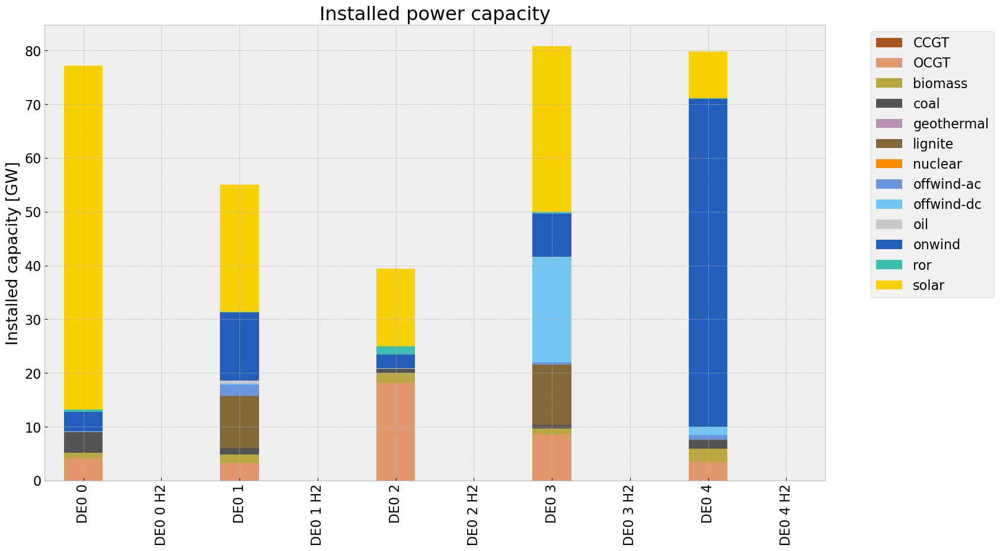

In [392]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

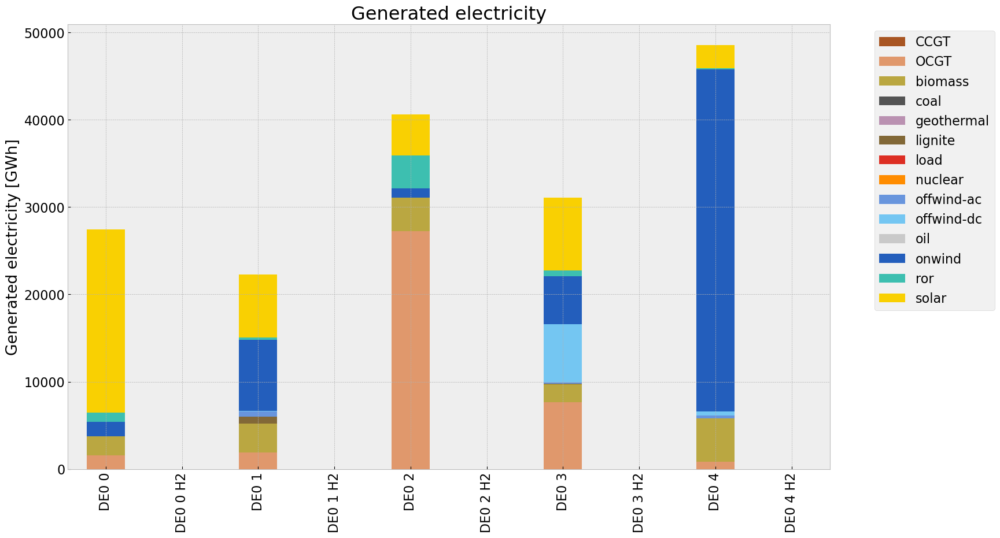

In [393]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)

## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

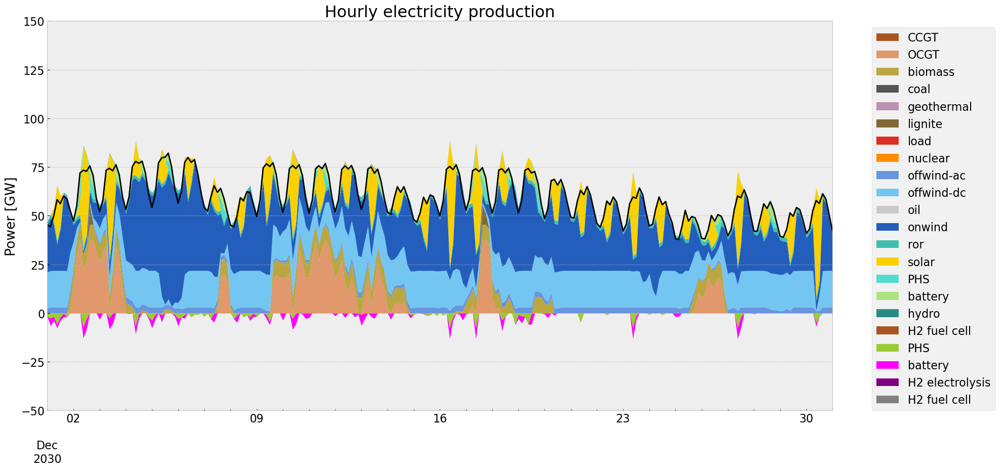

In [394]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


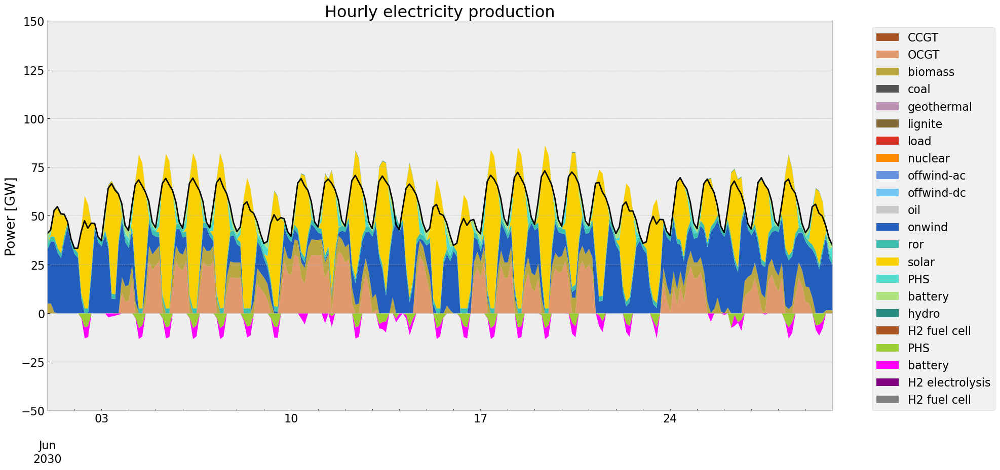

In [395]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen)

## Storage

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,1.849853,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,1.686117,NaN


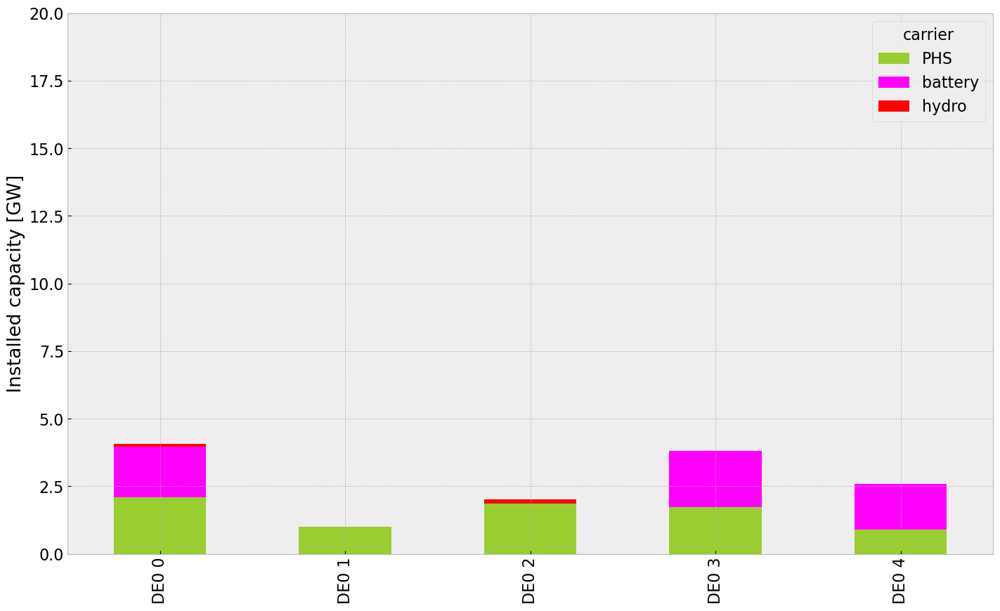

In [396]:
inst_store_table(n1)

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


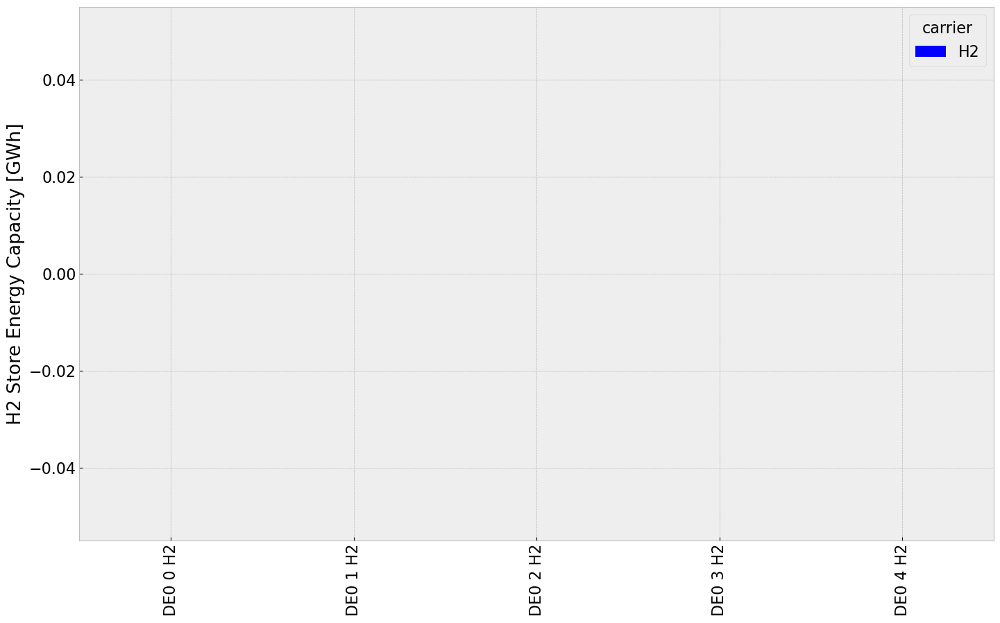

In [397]:
inst_storeh2_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


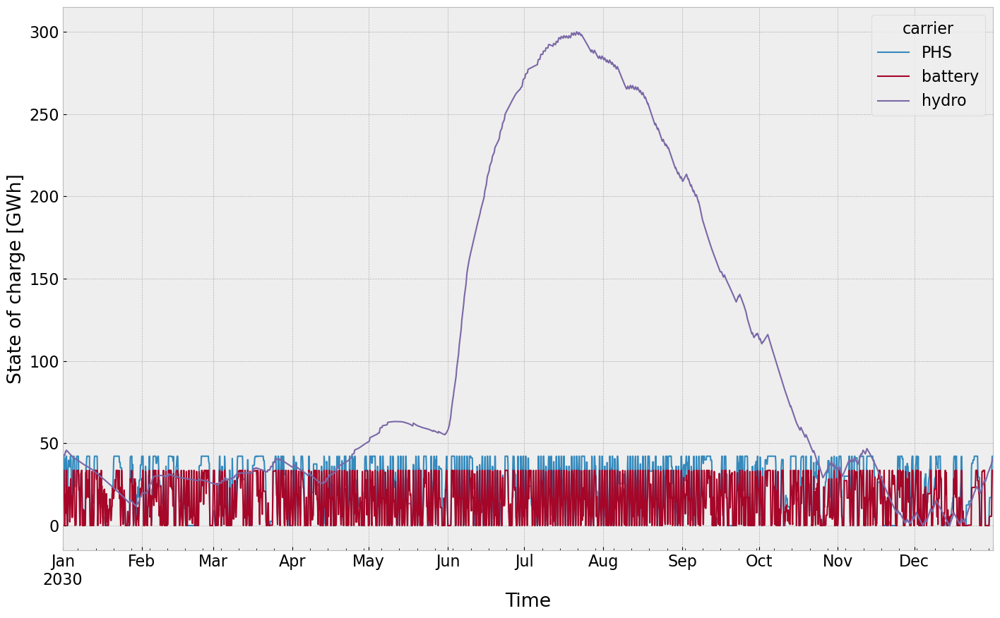

In [398]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


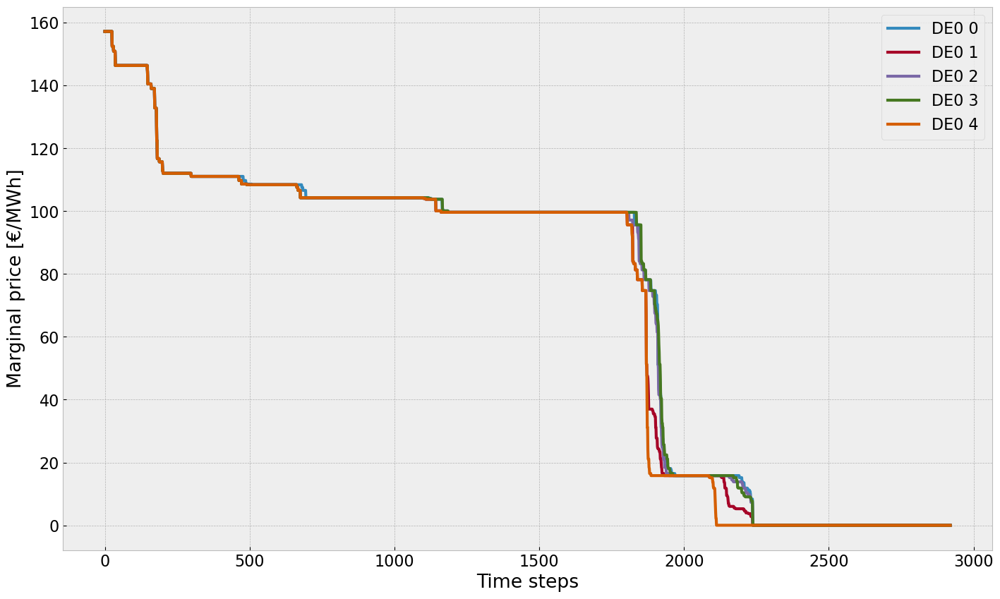

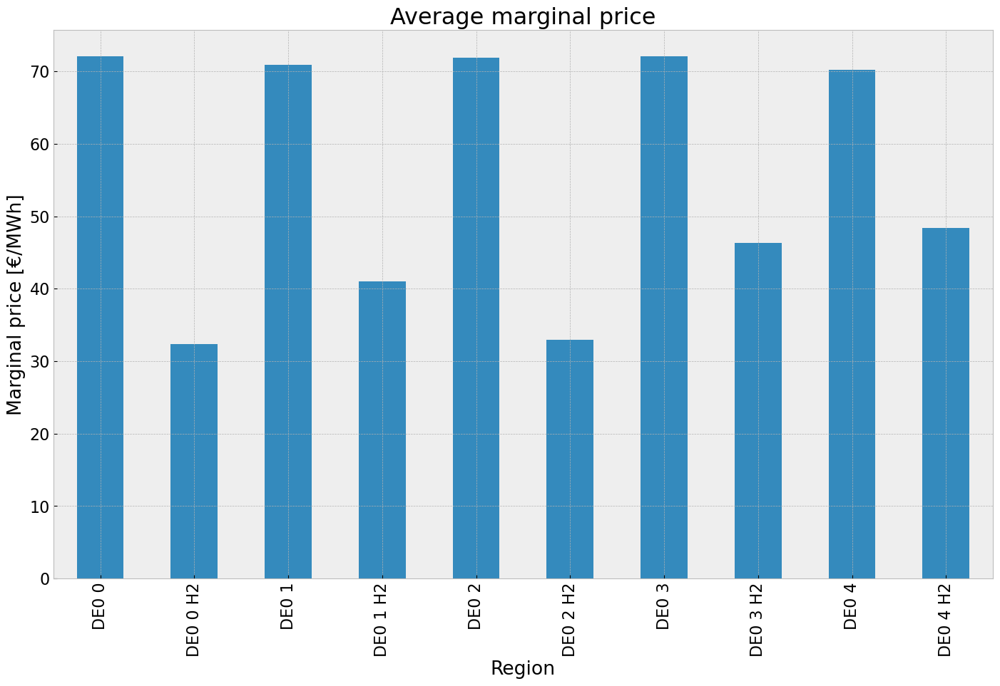

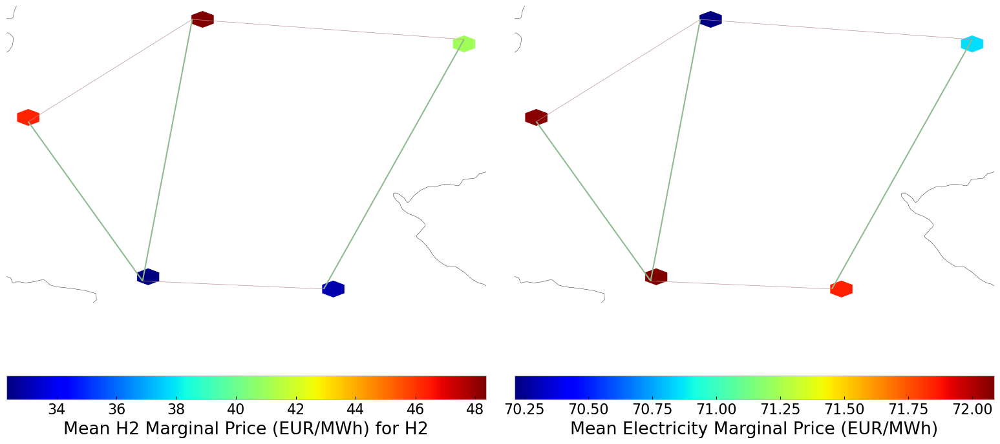

In [399]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [400]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.923444e+07,0.499437,0.1980,1.555436e+07
biomass,1.633369e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,8.786689e+05,0.358368,0.4069,9.976639e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.023135e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [401]:
#copy network
n2=n.copy()

#offwind cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index < cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n2.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [402]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * Store-fix-e-lower (snapshot, Store-fix)
 * Store-fix-e-upper (snapshot, Store-fix)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUni

In [403]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 10/10 [00:02<00:00,  4.42it/s]
INFO:linopy.io: Writing time: 15.78s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-35i_1j12.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-35i_1j12.lp


Reading time = 3.19 seconds


INFO:gurobipy:Reading time = 3.19 seconds


obj: 849737 rows, 402951 columns, 1419117 nonzeros


INFO:gurobipy:obj: 849737 rows, 402951 columns, 1419117 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


INFO:gurobipy:Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


Model fingerprint: 0xba8a3613


INFO:gurobipy:Model fingerprint: 0xba8a3613


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+02]


INFO:gurobipy:  Bounds range     [1e+01, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 759233 rows and 160550 columns


INFO:gurobipy:Presolve removed 759233 rows and 160550 columns


Presolve time: 1.96s


INFO:gurobipy:Presolve time: 1.96s


Presolved: 90504 rows, 242401 columns, 461372 nonzeros


INFO:gurobipy:Presolved: 90504 rows, 242401 columns, 461372 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.13s


INFO:gurobipy:Ordering time: 0.13s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 13


INFO:gurobipy: Dense cols : 13


 AA' NZ     : 2.219e+05


INFO:gurobipy: AA' NZ     : 2.219e+05


 Factor NZ  : 1.514e+06 (roughly 150 MB of memory)


INFO:gurobipy: Factor NZ  : 1.514e+06 (roughly 150 MB of memory)


 Factor Ops : 3.644e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.644e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.81416476e+18 -9.47603348e+18  2.86e+08 5.18e+06  1.51e+14     3s


INFO:gurobipy:   0   1.81416476e+18 -9.47603348e+18  2.86e+08 5.18e+06  1.51e+14     3s


   1   9.55852630e+17 -8.24700310e+17  1.46e+08 7.96e+05  6.40e+13     3s


INFO:gurobipy:   1   9.55852630e+17 -8.24700310e+17  1.46e+08 7.96e+05  6.40e+13     3s


   2   9.24227333e+17 -4.47056961e+17  1.41e+08 3.75e+05  5.99e+13     3s


INFO:gurobipy:   2   9.24227333e+17 -4.47056961e+17  1.41e+08 3.75e+05  5.99e+13     3s


   3   1.82030541e+17 -2.98682302e+17  2.20e+07 1.80e+05  1.07e+13     3s


INFO:gurobipy:   3   1.82030541e+17 -2.98682302e+17  2.20e+07 1.80e+05  1.07e+13     3s


   4   4.11912520e+16 -3.10678481e+16  7.11e+05 5.19e+03  4.55e+11     4s


INFO:gurobipy:   4   4.11912520e+16 -3.10678481e+16  7.11e+05 5.19e+03  4.55e+11     4s


   5   1.16589328e+16 -9.47895478e+15  5.37e+04 1.50e+03  6.88e+10     4s


INFO:gurobipy:   5   1.16589328e+16 -9.47895478e+15  5.37e+04 1.50e+03  6.88e+10     4s


   6   1.17459497e+15 -8.29078665e+14  2.18e+03 3.49e+01  4.79e+09     4s


INFO:gurobipy:   6   1.17459497e+15 -8.29078665e+14  2.18e+03 3.49e+01  4.79e+09     4s


   7   1.04227250e+14 -9.26953371e+13  1.80e+02 4.65e-01  4.24e+08     4s


INFO:gurobipy:   7   1.04227250e+14 -9.26953371e+13  1.80e+02 4.65e-01  4.24e+08     4s


   8   4.00230901e+13 -2.87693962e+13  6.91e+01 1.19e-01  1.43e+08     4s


INFO:gurobipy:   8   4.00230901e+13 -2.87693962e+13  6.91e+01 1.19e-01  1.43e+08     4s


   9   4.48595670e+12 -6.53838725e+12  7.78e+00 1.93e-02  2.23e+07     5s


INFO:gurobipy:   9   4.48595670e+12 -6.53838725e+12  7.78e+00 1.93e-02  2.23e+07     5s


  10   3.10885986e+11 -1.03676014e+12  5.42e-01 1.60e-03  2.70e+06     5s


INFO:gurobipy:  10   3.10885986e+11 -1.03676014e+12  5.42e-01 1.60e-03  2.70e+06     5s


  11   1.73963081e+11 -5.89944486e+11  2.22e-01 9.21e-04  1.53e+06     5s


INFO:gurobipy:  11   1.73963081e+11 -5.89944486e+11  2.22e-01 9.21e-04  1.53e+06     5s


  12   1.41216216e+11 -3.97298096e+11  1.49e-01 6.41e-04  1.08e+06     5s


INFO:gurobipy:  12   1.41216216e+11 -3.97298096e+11  1.49e-01 6.41e-04  1.08e+06     5s


  13   1.25009475e+11 -2.74701700e+11  1.15e-01 4.65e-04  8.01e+05     6s


INFO:gurobipy:  13   1.25009475e+11 -2.74701700e+11  1.15e-01 4.65e-04  8.01e+05     6s


  14   1.07377194e+11 -1.87455822e+11  8.08e-02 3.32e-04  5.90e+05     6s


INFO:gurobipy:  14   1.07377194e+11 -1.87455822e+11  8.08e-02 3.32e-04  5.90e+05     6s


  15   9.64113720e+10 -1.29832885e+11  6.13e-02 2.48e-04  4.53e+05     6s


INFO:gurobipy:  15   9.64113720e+10 -1.29832885e+11  6.13e-02 2.48e-04  4.53e+05     6s


  16   7.59620935e+10 -8.13404176e+10  3.38e-02 1.75e-04  3.15e+05     6s


INFO:gurobipy:  16   7.59620935e+10 -8.13404176e+10  3.38e-02 1.75e-04  3.15e+05     6s


  17   5.54396586e+10 -4.20614415e+10  1.91e-02 1.09e-04  1.95e+05     7s


INFO:gurobipy:  17   5.54396586e+10 -4.20614415e+10  1.91e-02 1.09e-04  1.95e+05     7s


  18   3.91156608e+10 -1.42386585e+10  9.24e-03 6.07e-05  1.07e+05     7s


INFO:gurobipy:  18   3.91156608e+10 -1.42386585e+10  9.24e-03 6.07e-05  1.07e+05     7s


  19   3.11890040e+10  6.65987038e+08  5.11e-03 3.40e-05  6.11e+04     7s


INFO:gurobipy:  19   3.11890040e+10  6.65987038e+08  5.11e-03 3.40e-05  6.11e+04     7s


  20   2.57608936e+10  8.55866429e+09  2.61e-03 1.95e-05  3.44e+04     8s


INFO:gurobipy:  20   2.57608936e+10  8.55866429e+09  2.61e-03 1.95e-05  3.44e+04     8s


  21   2.36752314e+10  1.02467525e+10  1.74e-03 1.63e-05  2.69e+04     8s


INFO:gurobipy:  21   2.36752314e+10  1.02467525e+10  1.74e-03 1.63e-05  2.69e+04     8s


  22   2.23829517e+10  1.25235747e+10  1.22e-03 1.22e-05  1.97e+04    10s


INFO:gurobipy:  22   2.23829517e+10  1.25235747e+10  1.22e-03 1.22e-05  1.97e+04    10s


  23   2.12607882e+10  1.41475960e+10  8.03e-04 9.06e-06  1.42e+04    11s


INFO:gurobipy:  23   2.12607882e+10  1.41475960e+10  8.03e-04 9.06e-06  1.42e+04    11s


  24   2.03952967e+10  1.51686559e+10  4.85e-04 7.08e-06  1.05e+04    12s


INFO:gurobipy:  24   2.03952967e+10  1.51686559e+10  4.85e-04 7.08e-06  1.05e+04    12s


  25   1.99521757e+10  1.63258067e+10  3.31e-04 4.83e-06  7.26e+03    13s


INFO:gurobipy:  25   1.99521757e+10  1.63258067e+10  3.31e-04 4.83e-06  7.26e+03    13s


  26   1.93007667e+10  1.79080765e+10  1.16e-04 1.68e-06  2.79e+03    13s


INFO:gurobipy:  26   1.93007667e+10  1.79080765e+10  1.16e-04 1.68e-06  2.79e+03    13s


INFO:gurobipy:


Barrier performed 26 iterations in 13.47 seconds (2.52 work units)


INFO:gurobipy:Barrier performed 26 iterations in 13.47 seconds (2.52 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   54264    1.8833342e+10   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:   54264    1.8833342e+10   0.000000e+00   0.000000e+00     14s


INFO:gurobipy:


Solved in 54264 iterations and 14.08 seconds (4.38 work units)


INFO:gurobipy:Solved in 54264 iterations and 14.08 seconds (4.38 work units)


Optimal objective  1.883334200e+10


INFO:gurobipy:Optimal objective  1.883334200e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402951 primals, 849737 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [404]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

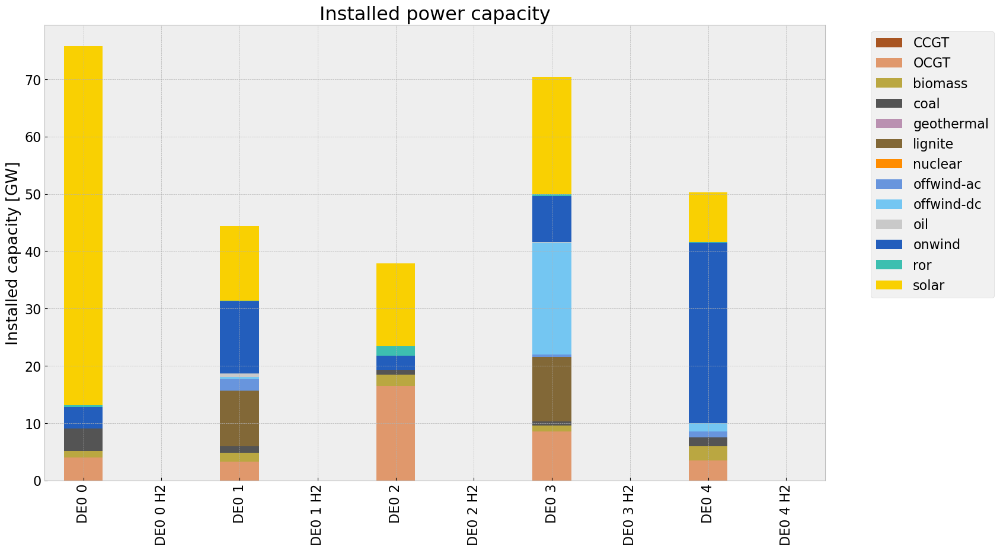

In [405]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

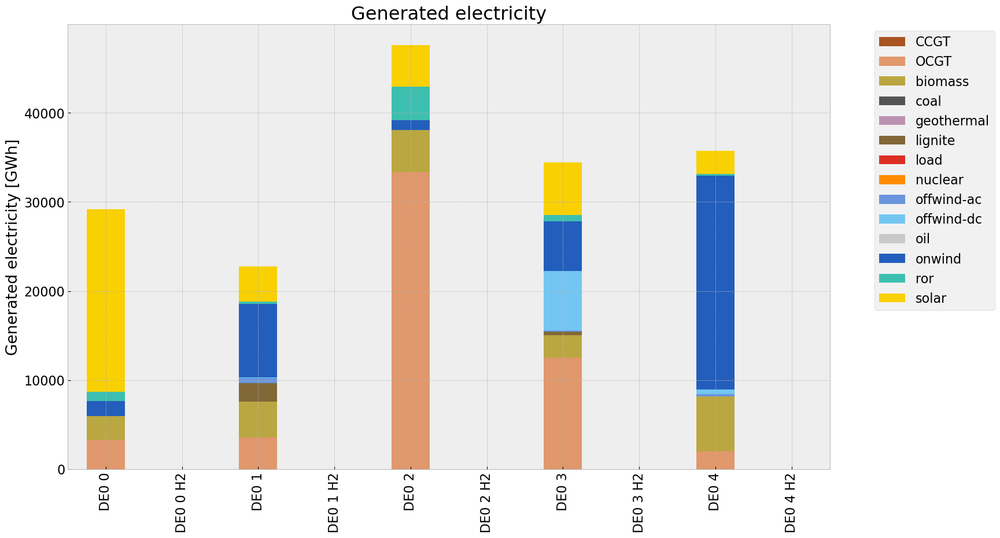

In [406]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2615338355.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2615338355.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier

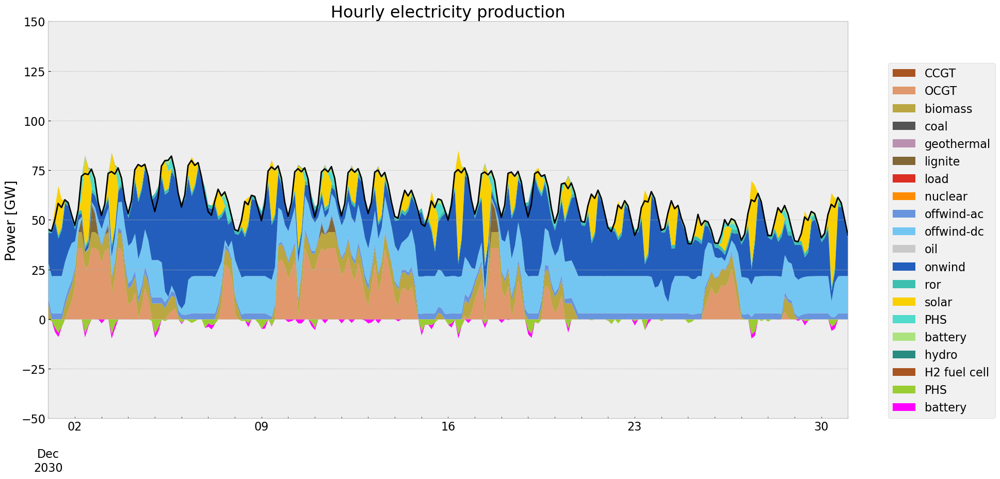

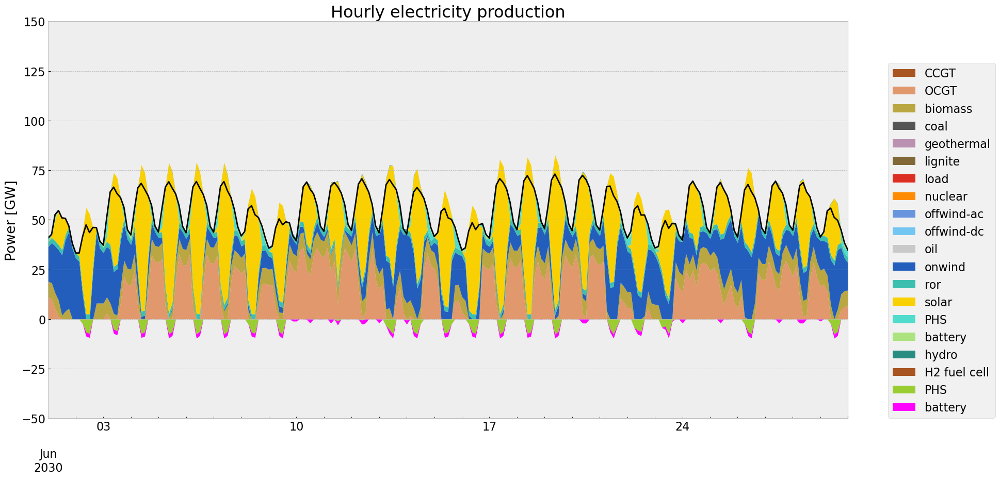

In [407]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2144961626.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2144961626.py:5: FutureWarning: 'H' is deprecated and will be removed in a future

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.467019e+07,0.499437,0.1980,2.167381e+07
biomass,2.014244e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,2.429932e+06,0.358368,0.4069,2.759009e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.030717e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


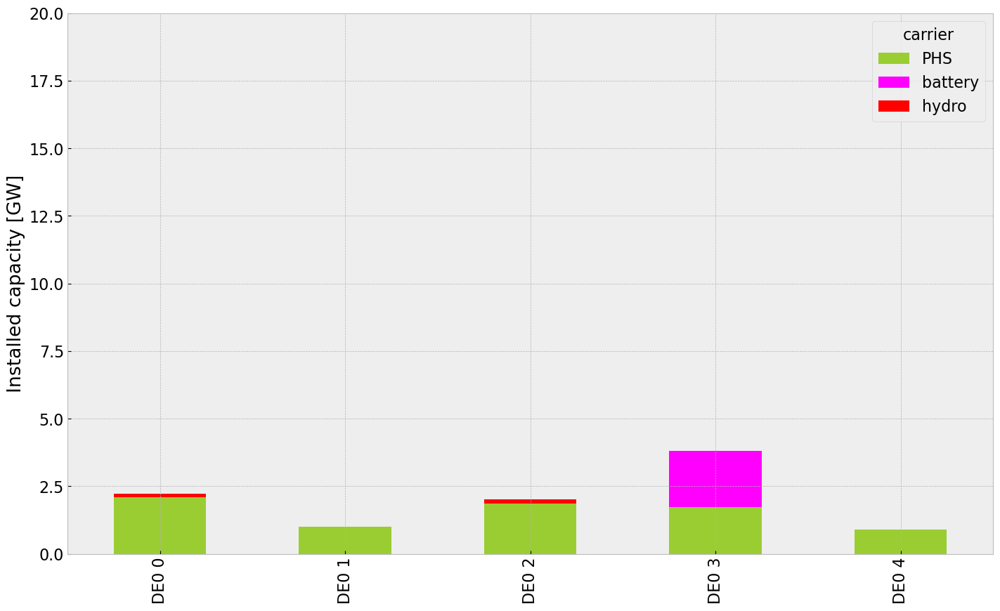

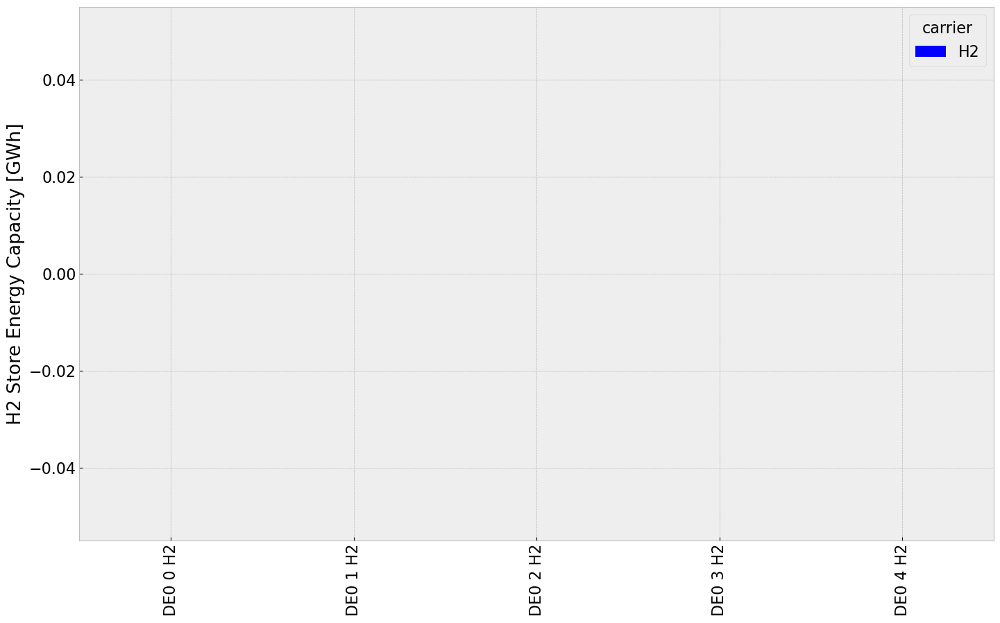

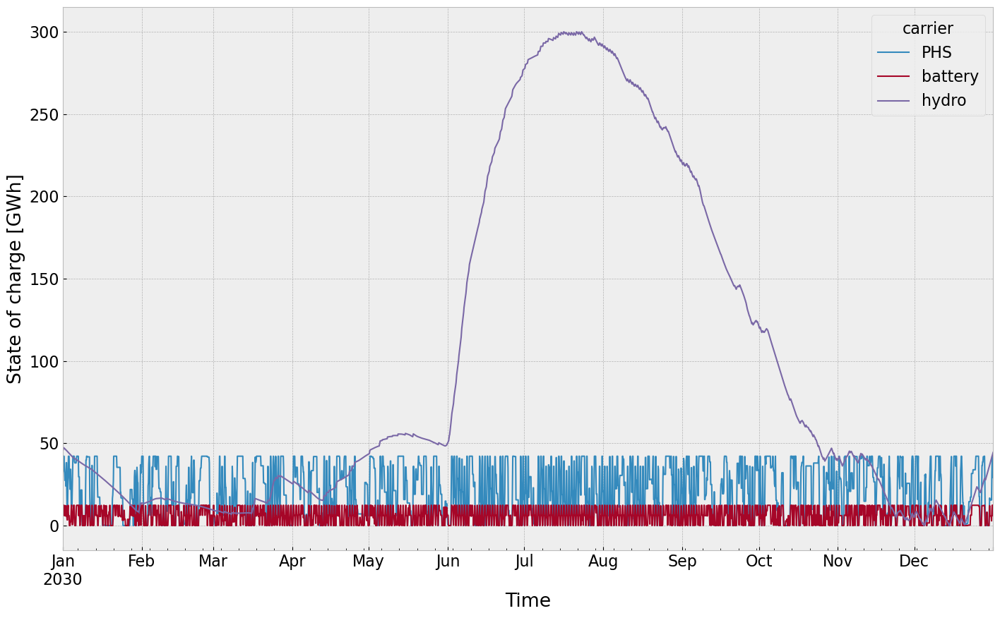

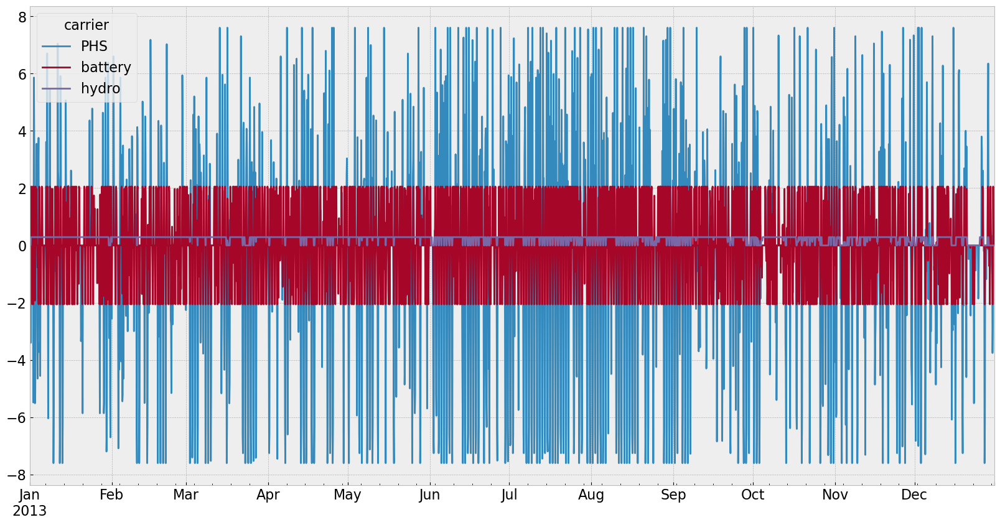

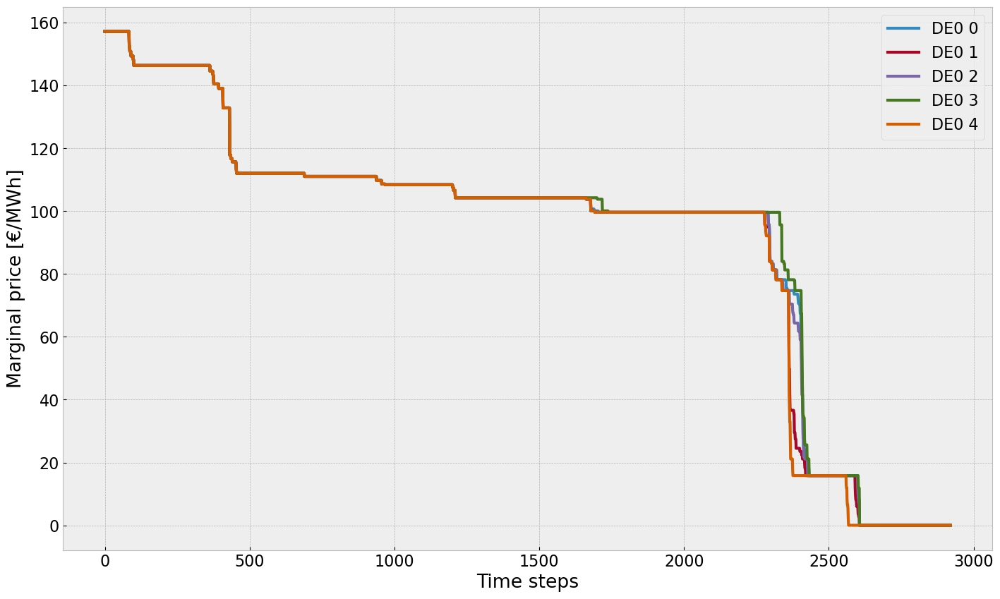

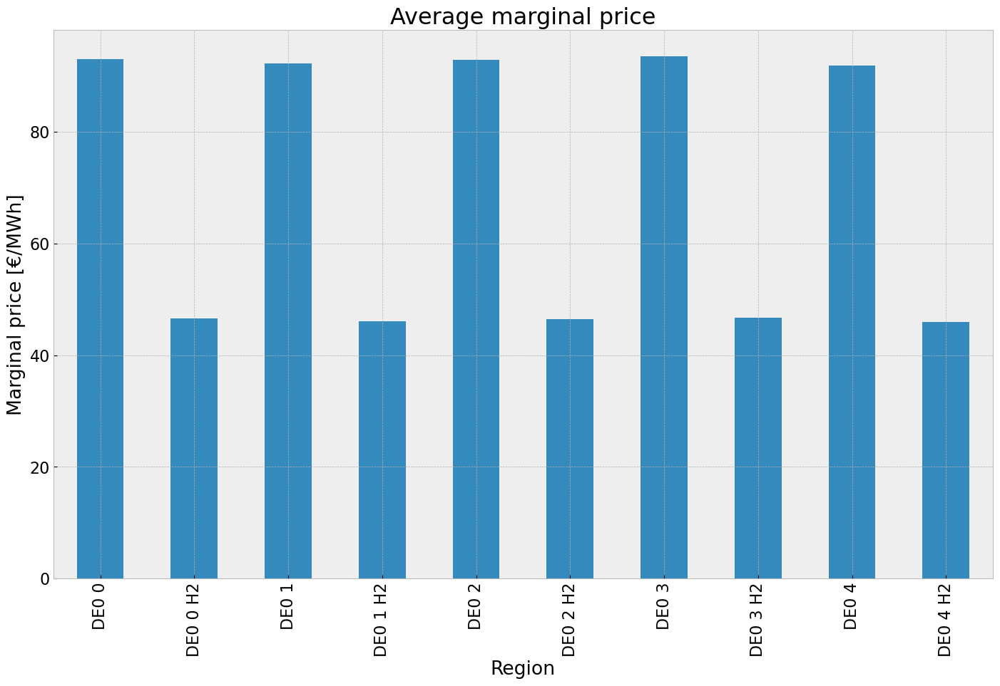

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


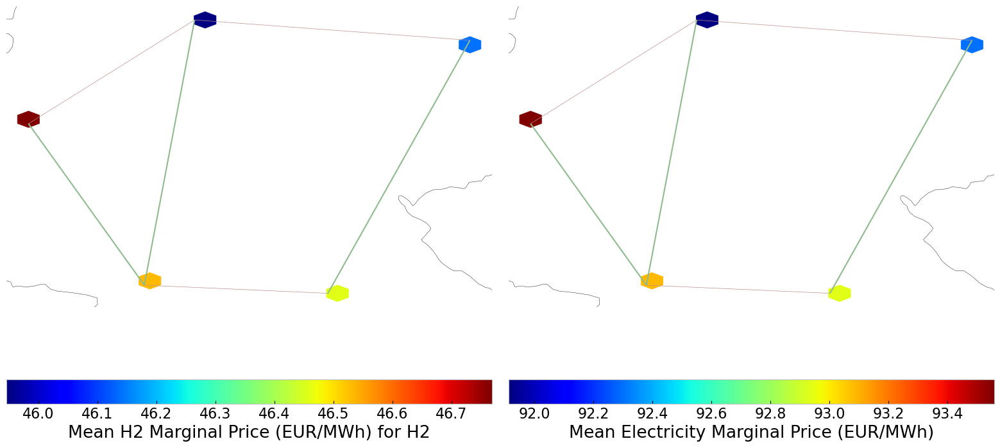

In [408]:
#storage unit & stores
inst_store_table(n2)
inst_storeh2_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [409]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2uxipjiv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2uxipjiv.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8e34e54d


INFO:gurobipy:Model fingerprint: 0x8e34e54d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     555    3.4733261e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     555    3.4733261e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 555 iterations and 0.13 seconds (0.01 work units)


INFO:gurobipy:Solved in 555 iterations and 0.13 seconds (0.01 work units)


Optimal objective  3.473326138e+07


INFO:gurobipy:Optimal objective  3.473326138e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fzhe2ddx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fzhe2ddx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdecc24ee


INFO:gurobipy:Model fingerprint: 0xdecc24ee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1351 columns


INFO:gurobipy:Presolve removed 6257 rows and 1351 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1974 columns, 3761 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1974 columns, 3761 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    1.1463518e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    1.1463518e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.146351836e+08


INFO:gurobipy:Optimal objective  1.146351836e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.15e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k0zr9_pz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k0zr9_pz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0c68b48b


INFO:gurobipy:Model fingerprint: 0x0c68b48b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1360 columns


INFO:gurobipy:Presolve removed 6257 rows and 1360 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1965 columns, 3752 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1965 columns, 3752 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    3.2780424e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    3.2780424e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.278042353e+08


INFO:gurobipy:Optimal objective  3.278042353e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8x9_vy_g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8x9_vy_g.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x170b5703


INFO:gurobipy:Model fingerprint: 0x170b5703


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1364 columns


INFO:gurobipy:Presolve removed 6257 rows and 1364 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1961 columns, 3748 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1961 columns, 3748 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     442    2.7483166e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     442    2.7483166e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 442 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 442 iterations and 0.08 seconds (0.01 work units)


Optimal objective  2.748316623e+08


INFO:gurobipy:Optimal objective  2.748316623e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_b3tknys.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_b3tknys.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9f1f47b7


INFO:gurobipy:Model fingerprint: 0x9f1f47b7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1357 columns


INFO:gurobipy:Presolve removed 6257 rows and 1357 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1968 columns, 3755 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1968 columns, 3755 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    3.4497860e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    3.4497860e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.449785984e+08


INFO:gurobipy:Optimal objective  3.449785984e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zxos1b5j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zxos1b5j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9ddd847a


INFO:gurobipy:Model fingerprint: 0x9ddd847a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1354 columns


INFO:gurobipy:Presolve removed 6257 rows and 1354 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1971 columns, 3758 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1971 columns, 3758 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    3.8406152e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    3.8406152e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.840615198e+08


INFO:gurobipy:Optimal objective  3.840615198e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-exkshavx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-exkshavx.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x353b2d3b


INFO:gurobipy:Model fingerprint: 0x353b2d3b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1358 columns


INFO:gurobipy:Presolve removed 6257 rows and 1358 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1967 columns, 3754 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1967 columns, 3754 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     438    1.7797210e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     438    1.7797210e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 438 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 438 iterations and 0.09 seconds (0.01 work units)


Optimal objective  1.779720980e+08


INFO:gurobipy:Optimal objective  1.779720980e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8upyhtjf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8upyhtjf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x268e2027


INFO:gurobipy:Model fingerprint: 0x268e2027


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1376 columns


INFO:gurobipy:Presolve removed 6257 rows and 1376 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1949 columns, 3736 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1949 columns, 3736 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     494    4.2571871e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     494    4.2571871e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 494 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 494 iterations and 0.06 seconds (0.01 work units)


Optimal objective  4.257187099e+08


INFO:gurobipy:Optimal objective  4.257187099e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k92voyf4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k92voyf4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc1b5108b


INFO:gurobipy:Model fingerprint: 0xc1b5108b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1356 columns


INFO:gurobipy:Presolve removed 6257 rows and 1356 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     481    2.0452957e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     481    2.0452957e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 481 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 481 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.045295686e+08


INFO:gurobipy:Optimal objective  2.045295686e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.05e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-33vxi9hw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-33vxi9hw.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x33f4a3dd


INFO:gurobipy:Model fingerprint: 0x33f4a3dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     646    6.4361717e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     646    6.4361717e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 646 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 646 iterations and 0.09 seconds (0.01 work units)


Optimal objective  6.436171679e+07


INFO:gurobipy:Optimal objective  6.436171679e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.44e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kuzzhnzl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kuzzhnzl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdc584faa


INFO:gurobipy:Model fingerprint: 0xdc584faa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1340 columns


INFO:gurobipy:Presolve removed 6257 rows and 1340 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    1.0814520e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    1.0814520e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.081452026e+08


INFO:gurobipy:Optimal objective  1.081452026e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.08e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ncanzcw5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ncanzcw5.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0dbcd361


INFO:gurobipy:Model fingerprint: 0x0dbcd361


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    5.6408859e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    5.6408859e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.10 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.10 seconds (0.01 work units)


Optimal objective  5.640885943e+07


INFO:gurobipy:Optimal objective  5.640885943e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.64e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.54s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wshuqg52.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wshuqg52.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x18c6f7fa


INFO:gurobipy:Model fingerprint: 0x18c6f7fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    3.2773585e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    3.2773585e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.09 seconds (0.01 work units)


Optimal objective  3.277358488e+08


INFO:gurobipy:Optimal objective  3.277358488e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9d6knza7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9d6knza7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6f0e2b8e


INFO:gurobipy:Model fingerprint: 0x6f0e2b8e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1356 columns


INFO:gurobipy:Presolve removed 6257 rows and 1356 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     481    1.7440342e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     481    1.7440342e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 481 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 481 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.744034231e+08


INFO:gurobipy:Optimal objective  1.744034231e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xa6jjoyq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xa6jjoyq.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbc3eef8e


INFO:gurobipy:Model fingerprint: 0xbc3eef8e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1348 columns


INFO:gurobipy:Presolve removed 6257 rows and 1348 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     458    3.1397294e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     458    3.1397294e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 458 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 458 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.139729406e+08


INFO:gurobipy:Optimal objective  3.139729406e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.14e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jxdxzv_d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jxdxzv_d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbebcfc6c


INFO:gurobipy:Model fingerprint: 0xbebcfc6c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1384 columns


INFO:gurobipy:Presolve removed 6257 rows and 1384 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1941 columns, 3728 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1941 columns, 3728 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    3.2201432e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    3.2201432e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.220143181e+08


INFO:gurobipy:Optimal objective  3.220143181e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-abuukfp7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-abuukfp7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0840ad0a


INFO:gurobipy:Model fingerprint: 0x0840ad0a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    2.6102379e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    2.6102379e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.610237864e+08


INFO:gurobipy:Optimal objective  2.610237864e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7e54v60f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7e54v60f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8a67bf0d


INFO:gurobipy:Model fingerprint: 0x8a67bf0d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     494    2.0045727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     494    2.0045727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 494 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 494 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.004572734e+08


INFO:gurobipy:Optimal objective  2.004572734e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qge0y73p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qge0y73p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9f11a9d2


INFO:gurobipy:Model fingerprint: 0x9f11a9d2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     438    2.3897835e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     438    2.3897835e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 438 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 438 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.389783549e+08


INFO:gurobipy:Optimal objective  2.389783549e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.39e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4h4b6kd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4h4b6kd.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4adf9f16


INFO:gurobipy:Model fingerprint: 0x4adf9f16


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1352 columns


INFO:gurobipy:Presolve removed 6257 rows and 1352 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    3.6620541e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    3.6620541e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.07 seconds (0.01 work units)


Optimal objective  3.662054076e+08


INFO:gurobipy:Optimal objective  3.662054076e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cdc7zpv8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cdc7zpv8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5fca2669


INFO:gurobipy:Model fingerprint: 0x5fca2669


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    1.3591570e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    1.3591570e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.359157006e+08


INFO:gurobipy:Optimal objective  1.359157006e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d5nmgbc3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d5nmgbc3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xae120b4d


INFO:gurobipy:Model fingerprint: 0xae120b4d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1345 columns


INFO:gurobipy:Presolve removed 6257 rows and 1345 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    1.6988730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    1.6988730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.698872987e+08


INFO:gurobipy:Optimal objective  1.698872987e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.70e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-antm9kkd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-antm9kkd.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xff7efe41


INFO:gurobipy:Model fingerprint: 0xff7efe41


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     524    5.2367749e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     524    5.2367749e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 524 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 524 iterations and 0.07 seconds (0.01 work units)


Optimal objective  5.236774866e+07


INFO:gurobipy:Optimal objective  5.236774866e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.24e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-99jerhv9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-99jerhv9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2e42dcc9


INFO:gurobipy:Model fingerprint: 0x2e42dcc9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    3.0252635e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    3.0252635e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.025263545e+08


INFO:gurobipy:Optimal objective  3.025263545e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qq1d6b0_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qq1d6b0_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd55bf1e8


INFO:gurobipy:Model fingerprint: 0xd55bf1e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1340 columns


INFO:gurobipy:Presolve removed 6257 rows and 1340 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    1.8983854e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    1.8983854e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.898385360e+08


INFO:gurobipy:Optimal objective  1.898385360e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.90e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_somz9u7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_somz9u7.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x983b151d


INFO:gurobipy:Model fingerprint: 0x983b151d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    1.1950175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    1.1950175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.195017483e+08


INFO:gurobipy:Optimal objective  1.195017483e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i3ofgs42.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i3ofgs42.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x91167e8a


INFO:gurobipy:Model fingerprint: 0x91167e8a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    2.3069758e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    2.3069758e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.306975849e+08


INFO:gurobipy:Optimal objective  2.306975849e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.31e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3qeozvxs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3qeozvxs.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x33c19938


INFO:gurobipy:Model fingerprint: 0x33c19938


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     534    6.8201558e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     534    6.8201558e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 534 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 534 iterations and 0.08 seconds (0.01 work units)


Optimal objective  6.820155810e+06


INFO:gurobipy:Optimal objective  6.820155810e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.82e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gxgjqir4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gxgjqir4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa38e1dae


INFO:gurobipy:Model fingerprint: 0xa38e1dae


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     436    1.4569240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     436    1.4569240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 436 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 436 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.456923974e+08


INFO:gurobipy:Optimal objective  1.456923974e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xmlvbape.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xmlvbape.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6116be70


INFO:gurobipy:Model fingerprint: 0x6116be70


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     438    1.7592082e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     438    1.7592082e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 438 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 438 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.759208232e+08


INFO:gurobipy:Optimal objective  1.759208232e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yjj508ik.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yjj508ik.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xddf3c594


INFO:gurobipy:Model fingerprint: 0xddf3c594


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    1.5619905e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    1.5619905e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.561990486e+08


INFO:gurobipy:Optimal objective  1.561990486e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qktfeqcx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qktfeqcx.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5c713bd1


INFO:gurobipy:Model fingerprint: 0x5c713bd1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1333 columns


INFO:gurobipy:Presolve removed 6257 rows and 1333 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1992 columns, 3779 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1992 columns, 3779 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    2.4039122e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    2.4039122e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.403912191e+08


INFO:gurobipy:Optimal objective  2.403912191e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0u_8hrsn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0u_8hrsn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1db1510b


INFO:gurobipy:Model fingerprint: 0x1db1510b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1341 columns


INFO:gurobipy:Presolve removed 6257 rows and 1341 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.6257771e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.6257771e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.625777113e+08


INFO:gurobipy:Optimal objective  1.625777113e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8ey998g7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8ey998g7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2a58129e


INFO:gurobipy:Model fingerprint: 0x2a58129e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    2.0684501e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    2.0684501e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.08 seconds (0.01 work units)


Optimal objective  2.068450062e+08


INFO:gurobipy:Optimal objective  2.068450062e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.07e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-efyyfxdo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-efyyfxdo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8c5dc253


INFO:gurobipy:Model fingerprint: 0x8c5dc253


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    7.4089014e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    7.4089014e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.408901393e+07


INFO:gurobipy:Optimal objective  7.408901393e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.41e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uhf6kkzp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uhf6kkzp.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc7e35e49


INFO:gurobipy:Model fingerprint: 0xc7e35e49


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1342 columns


INFO:gurobipy:Presolve removed 6257 rows and 1342 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     408    1.1300511e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     408    1.1300511e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 408 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 408 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.130051094e+08


INFO:gurobipy:Optimal objective  1.130051094e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.13e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5vc6bsc6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5vc6bsc6.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4cb0bdbb


INFO:gurobipy:Model fingerprint: 0x4cb0bdbb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1340 columns


INFO:gurobipy:Presolve removed 6257 rows and 1340 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     384    1.2910649e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     384    1.2910649e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 384 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 384 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.291064924e+08


INFO:gurobipy:Optimal objective  1.291064924e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.29e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.66s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8h5ihci2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8h5ihci2.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x54e92ff8


INFO:gurobipy:Model fingerprint: 0x54e92ff8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1348 columns


INFO:gurobipy:Presolve removed 6257 rows and 1348 columns


Presolve time: 0.09s


INFO:gurobipy:Presolve time: 0.09s


Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     357    1.4501109e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     357    1.4501109e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 357 iterations and 0.14 seconds (0.01 work units)


INFO:gurobipy:Solved in 357 iterations and 0.14 seconds (0.01 work units)


Optimal objective  1.450110905e+08


INFO:gurobipy:Optimal objective  1.450110905e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kh5bk9v5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kh5bk9v5.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4dcb04ec


INFO:gurobipy:Model fingerprint: 0x4dcb04ec


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1346 columns


INFO:gurobipy:Presolve removed 6257 rows and 1346 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     381    1.8009923e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     381    1.8009923e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 381 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 381 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.800992287e+08


INFO:gurobipy:Optimal objective  1.800992287e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.80e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-25y634f6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-25y634f6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x22c0dcbc


INFO:gurobipy:Model fingerprint: 0x22c0dcbc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     425    1.6566900e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     425    1.6566900e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 425 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 425 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.656690025e+08


INFO:gurobipy:Optimal objective  1.656690025e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-faq9pbfa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-faq9pbfa.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7c2ac8b3


INFO:gurobipy:Model fingerprint: 0x7c2ac8b3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     419    1.8169451e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     419    1.8169451e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 419 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 419 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.816945106e+08


INFO:gurobipy:Optimal objective  1.816945106e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdngn3i_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdngn3i_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb0decf9a


INFO:gurobipy:Model fingerprint: 0xb0decf9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1341 columns


INFO:gurobipy:Presolve removed 6257 rows and 1341 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     406    1.3162810e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     406    1.3162810e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 406 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 406 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.316280987e+08


INFO:gurobipy:Optimal objective  1.316280987e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7j35i5wn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7j35i5wn.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xcd122d05


INFO:gurobipy:Model fingerprint: 0xcd122d05


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     373    1.6460115e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     373    1.6460115e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 373 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 373 iterations and 0.09 seconds (0.01 work units)


Optimal objective  1.646011518e+08


INFO:gurobipy:Optimal objective  1.646011518e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.65e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vh5dihxc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vh5dihxc.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x306c32e7


INFO:gurobipy:Model fingerprint: 0x306c32e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1327 columns


INFO:gurobipy:Presolve removed 6257 rows and 1327 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     424    1.1064064e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     424    1.1064064e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 424 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 424 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.106406415e+08


INFO:gurobipy:Optimal objective  1.106406415e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qryty4hm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qryty4hm.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1d31e50e


INFO:gurobipy:Model fingerprint: 0x1d31e50e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1320 columns


INFO:gurobipy:Presolve removed 6257 rows and 1320 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2005 columns, 3792 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2005 columns, 3792 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    1.3996948e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    1.3996948e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.399694760e+08


INFO:gurobipy:Optimal objective  1.399694760e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nso_biu4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nso_biu4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5b48dbc8


INFO:gurobipy:Model fingerprint: 0x5b48dbc8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1324 columns


INFO:gurobipy:Presolve removed 6257 rows and 1324 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2001 columns, 3788 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2001 columns, 3788 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    1.8163357e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    1.8163357e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.816335709e+08


INFO:gurobipy:Optimal objective  1.816335709e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vkyjieie.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vkyjieie.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x24ef6ca3


INFO:gurobipy:Model fingerprint: 0x24ef6ca3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1319 columns


INFO:gurobipy:Presolve removed 6257 rows and 1319 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2006 columns, 3793 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2006 columns, 3793 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    1.3428372e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    1.3428372e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.342837204e+08


INFO:gurobipy:Optimal objective  1.342837204e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cpsh5c7e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cpsh5c7e.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x06aafa30


INFO:gurobipy:Model fingerprint: 0x06aafa30


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     547    1.8206588e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     547    1.8206588e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 547 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 547 iterations and 0.09 seconds (0.01 work units)


Optimal objective  1.820658793e+08


INFO:gurobipy:Optimal objective  1.820658793e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-80phqsy_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-80phqsy_.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc449cc4f


INFO:gurobipy:Model fingerprint: 0xc449cc4f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1331 columns


INFO:gurobipy:Presolve removed 6257 rows and 1331 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1994 columns, 3781 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1994 columns, 3781 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    9.7415414e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    9.7415414e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.06 seconds (0.01 work units)


Optimal objective  9.741541441e+07


INFO:gurobipy:Optimal objective  9.741541441e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.74e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_lyqd6mu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_lyqd6mu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1f1ae618


INFO:gurobipy:Model fingerprint: 0x1f1ae618


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    1.7796243e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    1.7796243e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.779624264e+08


INFO:gurobipy:Optimal objective  1.779624264e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pn5oahh3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pn5oahh3.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8df35a71


INFO:gurobipy:Model fingerprint: 0x8df35a71


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 4e+02]


INFO:gurobipy:  Bounds range     [1e+02, 4e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1323 columns


INFO:gurobipy:Presolve removed 6257 rows and 1323 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     404    2.6075457e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     404    2.6075457e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 404 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 404 iterations and 0.08 seconds (0.01 work units)


Optimal objective  2.607545659e+07


INFO:gurobipy:Optimal objective  2.607545659e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.61e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_g516ber.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_g516ber.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8e611bdd


INFO:gurobipy:Model fingerprint: 0x8e611bdd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1321 columns


INFO:gurobipy:Presolve removed 6257 rows and 1321 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2004 columns, 3791 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2004 columns, 3791 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     389    1.0575067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     389    1.0575067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 389 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 389 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.057506677e+08


INFO:gurobipy:Optimal objective  1.057506677e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vnd9ulbd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vnd9ulbd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0631070d


INFO:gurobipy:Model fingerprint: 0x0631070d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     375    1.2213319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     375    1.2213319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 375 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 375 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.221331893e+08


INFO:gurobipy:Optimal objective  1.221331893e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-otar7ct_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-otar7ct_.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x71f0434c


INFO:gurobipy:Model fingerprint: 0x71f0434c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 4e+02]


INFO:gurobipy:  Bounds range     [2e+02, 4e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     362    1.8626603e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     362    1.8626603e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 362 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 362 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.862660310e+08


INFO:gurobipy:Optimal objective  1.862660310e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.86e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0ibzde_y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0ibzde_y.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9809ce03


INFO:gurobipy:Model fingerprint: 0x9809ce03


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     401    1.0362500e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     401    1.0362500e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 401 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 401 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.036249957e+08


INFO:gurobipy:Optimal objective  1.036249957e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.04e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ktwjbo9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ktwjbo9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x446a972e


INFO:gurobipy:Model fingerprint: 0x446a972e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1318 columns


INFO:gurobipy:Presolve removed 6257 rows and 1318 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2007 columns, 3794 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2007 columns, 3794 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     388    8.1208649e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     388    8.1208649e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 388 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 388 iterations and 0.06 seconds (0.01 work units)


Optimal objective  8.120864877e+07


INFO:gurobipy:Optimal objective  8.120864877e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.12e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sgpb5lbt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sgpb5lbt.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf02762a1


INFO:gurobipy:Model fingerprint: 0xf02762a1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1328 columns


INFO:gurobipy:Presolve removed 6257 rows and 1328 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1997 columns, 3784 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1997 columns, 3784 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     413    1.5122913e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     413    1.5122913e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 413 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 413 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.512291260e+08


INFO:gurobipy:Optimal objective  1.512291260e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.51e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w3_t704w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w3_t704w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x71ec38b9


INFO:gurobipy:Model fingerprint: 0x71ec38b9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1314 columns


INFO:gurobipy:Presolve removed 6257 rows and 1314 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2011 columns, 3798 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2011 columns, 3798 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     370    3.9343559e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     370    3.9343559e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 370 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 370 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.934355854e+07


INFO:gurobipy:Optimal objective  3.934355854e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xgzz8qk9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xgzz8qk9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd11418ea


INFO:gurobipy:Model fingerprint: 0xd11418ea


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1317 columns


INFO:gurobipy:Presolve removed 6257 rows and 1317 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     422    1.2146667e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     422    1.2146667e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 422 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 422 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.214666734e+08


INFO:gurobipy:Optimal objective  1.214666734e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.21e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vxom1g60.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vxom1g60.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x469848d6


INFO:gurobipy:Model fingerprint: 0x469848d6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1327 columns


INFO:gurobipy:Presolve removed 6257 rows and 1327 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     378    1.2616645e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     378    1.2616645e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 378 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 378 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.261664462e+08


INFO:gurobipy:Optimal objective  1.261664462e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nxsr7whv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nxsr7whv.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x69384e3c


INFO:gurobipy:Model fingerprint: 0x69384e3c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1330 columns


INFO:gurobipy:Presolve removed 6257 rows and 1330 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1995 columns, 3782 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1995 columns, 3782 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     409    1.0862723e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     409    1.0862723e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 409 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 409 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.086272319e+08


INFO:gurobipy:Optimal objective  1.086272319e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.09e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-44c1yep5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-44c1yep5.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb4c1ed2b


INFO:gurobipy:Model fingerprint: 0xb4c1ed2b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     390    2.0978751e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     390    2.0978751e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 390 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 390 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.097875104e+08


INFO:gurobipy:Optimal objective  2.097875104e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d0qrs17h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d0qrs17h.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9ea36ada


INFO:gurobipy:Model fingerprint: 0x9ea36ada


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1325 columns


INFO:gurobipy:Presolve removed 6257 rows and 1325 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2000 columns, 3787 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2000 columns, 3787 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     380    1.0121763e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     380    1.0121763e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 380 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 380 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.012176292e+08


INFO:gurobipy:Optimal objective  1.012176292e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6hw0mb_d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6hw0mb_d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc1c2837c


INFO:gurobipy:Model fingerprint: 0xc1c2837c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1317 columns


INFO:gurobipy:Presolve removed 6257 rows and 1317 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    1.2231852e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    1.2231852e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.223185168e+08


INFO:gurobipy:Optimal objective  1.223185168e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hu8nmd5z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hu8nmd5z.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x235a637e


INFO:gurobipy:Model fingerprint: 0x235a637e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    1.0062030e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    1.0062030e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.006203000e+08


INFO:gurobipy:Optimal objective  1.006203000e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.66s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9p39mb1w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9p39mb1w.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4f5fa670


INFO:gurobipy:Model fingerprint: 0x4f5fa670


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1341 columns


INFO:gurobipy:Presolve removed 6257 rows and 1341 columns


Presolve time: 0.14s


INFO:gurobipy:Presolve time: 0.14s


Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    1.5208925e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    1.5208925e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.16 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.16 seconds (0.01 work units)


Optimal objective  1.520892461e+08


INFO:gurobipy:Optimal objective  1.520892461e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-464svh23.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-464svh23.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9144d779


INFO:gurobipy:Model fingerprint: 0x9144d779


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1323 columns


INFO:gurobipy:Presolve removed 6257 rows and 1323 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    1.1070163e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    1.1070163e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.107016281e+08


INFO:gurobipy:Optimal objective  1.107016281e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sizox5l8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sizox5l8.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0de856f2


INFO:gurobipy:Model fingerprint: 0x0de856f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1367 columns


INFO:gurobipy:Presolve removed 6257 rows and 1367 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    1.3753790e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    1.3753790e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.375379042e+08


INFO:gurobipy:Optimal objective  1.375379042e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1d7ckyp4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1d7ckyp4.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x452a635b


INFO:gurobipy:Model fingerprint: 0x452a635b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1370 columns


INFO:gurobipy:Presolve removed 6257 rows and 1370 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1955 columns, 3742 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1955 columns, 3742 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    2.1717187e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    2.1717187e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.08 seconds (0.01 work units)


Optimal objective  2.171718727e+08


INFO:gurobipy:Optimal objective  2.171718727e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8gq5sfsc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8gq5sfsc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe2a755e7


INFO:gurobipy:Model fingerprint: 0xe2a755e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1342 columns


INFO:gurobipy:Presolve removed 6257 rows and 1342 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    1.6106926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    1.6106926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.610692635e+08


INFO:gurobipy:Optimal objective  1.610692635e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hl2r2m7p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hl2r2m7p.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb19813ea


INFO:gurobipy:Model fingerprint: 0xb19813ea


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    1.2466802e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    1.2466802e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.246680200e+08


INFO:gurobipy:Optimal objective  1.246680200e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mglh_mcr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mglh_mcr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7a31a58e


INFO:gurobipy:Model fingerprint: 0x7a31a58e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.0968197e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.0968197e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.096819730e+08


INFO:gurobipy:Optimal objective  1.096819730e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kqlisl1l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kqlisl1l.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0faad39e


INFO:gurobipy:Model fingerprint: 0x0faad39e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1346 columns


INFO:gurobipy:Presolve removed 6257 rows and 1346 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     439    1.6312775e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     439    1.6312775e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 439 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 439 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.631277521e+08


INFO:gurobipy:Optimal objective  1.631277521e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c64s4h3u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c64s4h3u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x42696252


INFO:gurobipy:Model fingerprint: 0x42696252


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1349 columns


INFO:gurobipy:Presolve removed 6257 rows and 1349 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     425    1.8209604e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     425    1.8209604e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 425 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 425 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.820960367e+08


INFO:gurobipy:Optimal objective  1.820960367e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xlf9f2q5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xlf9f2q5.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xeb2582e3


INFO:gurobipy:Model fingerprint: 0xeb2582e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    1.0279724e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    1.0279724e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.027972394e+08


INFO:gurobipy:Optimal objective  1.027972394e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bum8y0qq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bum8y0qq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa4049a37


INFO:gurobipy:Model fingerprint: 0xa4049a37


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1367 columns


INFO:gurobipy:Presolve removed 6257 rows and 1367 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    1.3443575e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    1.3443575e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.344357489e+08


INFO:gurobipy:Optimal objective  1.344357489e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9m9uo_f5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9m9uo_f5.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb63e485a


INFO:gurobipy:Model fingerprint: 0xb63e485a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    1.4710620e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    1.4710620e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.471062007e+08


INFO:gurobipy:Optimal objective  1.471062007e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ai5y4bwb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ai5y4bwb.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe794a3fa


INFO:gurobipy:Model fingerprint: 0xe794a3fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1368 columns


INFO:gurobipy:Presolve removed 6257 rows and 1368 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1957 columns, 3744 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1957 columns, 3744 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    1.8757023e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    1.8757023e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.875702278e+08


INFO:gurobipy:Optimal objective  1.875702278e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.88e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ts1zbeoh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ts1zbeoh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb0ca3590


INFO:gurobipy:Model fingerprint: 0xb0ca3590


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     407    9.6430980e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     407    9.6430980e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 407 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 407 iterations and 0.07 seconds (0.01 work units)


Optimal objective  9.643097981e+07


INFO:gurobipy:Optimal objective  9.643097981e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.64e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eepphpzz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eepphpzz.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbd7e8a04


INFO:gurobipy:Model fingerprint: 0xbd7e8a04


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    2.0908756e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    2.0908756e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.08 seconds (0.01 work units)


Optimal objective  2.090875637e+08


INFO:gurobipy:Optimal objective  2.090875637e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.09e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f0i1dlpu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f0i1dlpu.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0fd82e1d


INFO:gurobipy:Model fingerprint: 0x0fd82e1d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1367 columns


INFO:gurobipy:Presolve removed 6257 rows and 1367 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    1.5549088e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    1.5549088e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.554908795e+08


INFO:gurobipy:Optimal objective  1.554908795e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9cqur4xx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9cqur4xx.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2226343a


INFO:gurobipy:Model fingerprint: 0x2226343a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    7.7665101e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    7.7665101e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.09 seconds (0.01 work units)


Optimal objective  7.766510085e+07


INFO:gurobipy:Optimal objective  7.766510085e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.77e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1wwj3jf7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1wwj3jf7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x51ef92de


INFO:gurobipy:Model fingerprint: 0x51ef92de


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1352 columns


INFO:gurobipy:Presolve removed 6257 rows and 1352 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     420    1.4863832e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     420    1.4863832e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 420 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 420 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.486383247e+08


INFO:gurobipy:Optimal objective  1.486383247e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e2bdr7mf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e2bdr7mf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3309 columns, 11667 nonzeros


INFO:gurobipy:obj: 7001 rows, 3309 columns, 11667 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


Model fingerprint: 0x6c3d2f8e


INFO:gurobipy:Model fingerprint: 0x6c3d2f8e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 7e+01]


INFO:gurobipy:  Bounds range     [1e+01, 7e+01]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6269 rows and 1399 columns


INFO:gurobipy:Presolve removed 6269 rows and 1399 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 732 rows, 1910 columns, 3685 nonzeros


INFO:gurobipy:Presolved: 732 rows, 1910 columns, 3685 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    1.6576724e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    1.6576724e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.657672393e+08


INFO:gurobipy:Optimal objective  1.657672393e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3309 primals, 7001 duals
Objective: 1.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.82s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_nqlt4rl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_nqlt4rl.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x94e05aeb


INFO:gurobipy:Model fingerprint: 0x94e05aeb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1337 columns


INFO:gurobipy:Presolve removed 6257 rows and 1337 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 744 rows, 1988 columns, 3775 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1988 columns, 3775 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    2.7818896e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    2.7818896e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.12 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.12 seconds (0.01 work units)


Optimal objective  2.781889584e+08


INFO:gurobipy:Optimal objective  2.781889584e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.52s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-466crmus.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-466crmus.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc37231cb


INFO:gurobipy:Model fingerprint: 0xc37231cb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 9e+01]


INFO:gurobipy:  Bounds range     [6e+01, 9e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.10s


INFO:gurobipy:Presolve time: 0.10s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    1.8414711e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    1.8414711e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.12 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.12 seconds (0.01 work units)


Optimal objective  1.841471113e+08


INFO:gurobipy:Optimal objective  1.841471113e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tya1cyfw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tya1cyfw.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2471d2d5


INFO:gurobipy:Model fingerprint: 0x2471d2d5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    1.8480642e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    1.8480642e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.10 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.10 seconds (0.01 work units)


Optimal objective  1.848064183e+08


INFO:gurobipy:Optimal objective  1.848064183e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3o2ah4yo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3o2ah4yo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7e07acd6


INFO:gurobipy:Model fingerprint: 0x7e07acd6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1344 columns


INFO:gurobipy:Presolve removed 6257 rows and 1344 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 744 rows, 1981 columns, 3768 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1981 columns, 3768 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     500    2.2192944e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     500    2.2192944e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 500 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 500 iterations and 0.09 seconds (0.01 work units)


Optimal objective  2.219294389e+08


INFO:gurobipy:Optimal objective  2.219294389e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6umdzlrq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6umdzlrq.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe5ff55f4


INFO:gurobipy:Model fingerprint: 0xe5ff55f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1361 columns


INFO:gurobipy:Presolve removed 6257 rows and 1361 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1964 columns, 3751 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1964 columns, 3751 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    1.3233231e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    1.3233231e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.323323148e+08


INFO:gurobipy:Optimal objective  1.323323148e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7uanst5g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7uanst5g.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3319 columns, 11677 nonzeros


INFO:gurobipy:obj: 7001 rows, 3319 columns, 11677 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


Model fingerprint: 0x92fa642a


INFO:gurobipy:Model fingerprint: 0x92fa642a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 8e+01]


INFO:gurobipy:  Bounds range     [1e+01, 8e+01]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6261 rows and 1362 columns


INFO:gurobipy:Presolve removed 6261 rows and 1362 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 740 rows, 1957 columns, 3740 nonzeros


INFO:gurobipy:Presolved: 740 rows, 1957 columns, 3740 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    2.6565894e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    2.6565894e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.656589398e+08


INFO:gurobipy:Optimal objective  2.656589398e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3319 primals, 7001 duals
Objective: 2.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g40w2t7w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g40w2t7w.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc2919402


INFO:gurobipy:Model fingerprint: 0xc2919402


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    9.0896277e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    9.0896277e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.07 seconds (0.01 work units)


Optimal objective  9.089627683e+07


INFO:gurobipy:Optimal objective  9.089627683e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.09e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8mlaw5_j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8mlaw5_j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfecc48fb


INFO:gurobipy:Model fingerprint: 0xfecc48fb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    8.3780607e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    8.3780607e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.06 seconds (0.01 work units)


Optimal objective  8.378060735e+07


INFO:gurobipy:Optimal objective  8.378060735e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.38e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b_0yb2fa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b_0yb2fa.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd2e8db73


INFO:gurobipy:Model fingerprint: 0xd2e8db73


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1345 columns


INFO:gurobipy:Presolve removed 6257 rows and 1345 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    1.9417277e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    1.9417277e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.941727705e+08


INFO:gurobipy:Optimal objective  1.941727705e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2e6nyzr9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2e6nyzr9.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x86aadca8


INFO:gurobipy:Model fingerprint: 0x86aadca8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1355 columns


INFO:gurobipy:Presolve removed 6257 rows and 1355 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1970 columns, 3757 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1970 columns, 3757 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     539    2.9948987e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     539    2.9948987e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 539 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 539 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.994898701e+08


INFO:gurobipy:Optimal objective  2.994898701e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c1jioazu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c1jioazu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd24767f5


INFO:gurobipy:Model fingerprint: 0xd24767f5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1349 columns


INFO:gurobipy:Presolve removed 6257 rows and 1349 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    2.2849597e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    2.2849597e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.284959725e+08


INFO:gurobipy:Optimal objective  2.284959725e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7dxrblc8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7dxrblc8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2c545b9a


INFO:gurobipy:Model fingerprint: 0x2c545b9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     484    2.2467080e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     484    2.2467080e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 484 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 484 iterations and 0.08 seconds (0.01 work units)


Optimal objective  2.246708016e+08


INFO:gurobipy:Optimal objective  2.246708016e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xg3ynowp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xg3ynowp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xac0a6e43


INFO:gurobipy:Model fingerprint: 0xac0a6e43


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1339 columns


INFO:gurobipy:Presolve removed 6257 rows and 1339 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    1.9931322e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    1.9931322e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.993132162e+08


INFO:gurobipy:Optimal objective  1.993132162e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o0j2gb0h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o0j2gb0h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7904cbcd


INFO:gurobipy:Model fingerprint: 0x7904cbcd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     423    1.2396985e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     423    1.2396985e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 423 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 423 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.239698519e+08


INFO:gurobipy:Optimal objective  1.239698519e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.24e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_v6wzbq4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_v6wzbq4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xda9b52d4


INFO:gurobipy:Model fingerprint: 0xda9b52d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 9e+01]


INFO:gurobipy:  Bounds range     [4e+01, 9e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    1.4131937e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    1.4131937e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.413193723e+08


INFO:gurobipy:Optimal objective  1.413193723e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lzi156xq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lzi156xq.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x97134b70


INFO:gurobipy:Model fingerprint: 0x97134b70


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 7e+01]


INFO:gurobipy:  Bounds range     [5e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    8.2199414e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    8.2199414e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.06 seconds (0.01 work units)


Optimal objective  8.219941418e+07


INFO:gurobipy:Optimal objective  8.219941418e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.22e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o62r4x8s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o62r4x8s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa231bf9a


INFO:gurobipy:Model fingerprint: 0xa231bf9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1339 columns


INFO:gurobipy:Presolve removed 6257 rows and 1339 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     582    6.5793670e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     582    6.5793670e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 582 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 582 iterations and 0.07 seconds (0.01 work units)


Optimal objective  6.579366980e+07


INFO:gurobipy:Optimal objective  6.579366980e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.58e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bk4k06ge.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bk4k06ge.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf9a61905


INFO:gurobipy:Model fingerprint: 0xf9a61905


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1247 columns


INFO:gurobipy:Presolve removed 6257 rows and 1247 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2078 columns, 3865 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2078 columns, 3865 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     494    6.8594215e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     494    6.8594215e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 494 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 494 iterations and 0.09 seconds (0.01 work units)


Optimal objective  6.859421490e+07


INFO:gurobipy:Optimal objective  6.859421490e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.86e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gn8wz_z9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gn8wz_z9.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7310b95f


INFO:gurobipy:Model fingerprint: 0x7310b95f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1201 columns


INFO:gurobipy:Presolve removed 6257 rows and 1201 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     529    1.7903116e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     529    1.7903116e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 529 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 529 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.790311581e+07


INFO:gurobipy:Optimal objective  1.790311581e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4ma7y9c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4ma7y9c.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xed06b081


INFO:gurobipy:Model fingerprint: 0xed06b081


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1203 columns


INFO:gurobipy:Presolve removed 6257 rows and 1203 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     521    1.0574205e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     521    1.0574205e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 521 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 521 iterations and 0.09 seconds (0.01 work units)


Optimal objective  1.057420520e+08


INFO:gurobipy:Optimal objective  1.057420520e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8kchxgsx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8kchxgsx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xedd802e9


INFO:gurobipy:Model fingerprint: 0xedd802e9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    5.9887183e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    5.9887183e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.06 seconds (0.01 work units)


Optimal objective  5.988718335e+07


INFO:gurobipy:Optimal objective  5.988718335e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x0pupx_b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x0pupx_b.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9a736996


INFO:gurobipy:Model fingerprint: 0x9a736996


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1226 columns


INFO:gurobipy:Presolve removed 6257 rows and 1226 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     481    1.5285972e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     481    1.5285972e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 481 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 481 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.528597158e+08


INFO:gurobipy:Optimal objective  1.528597158e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f6vt92mz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f6vt92mz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9dfcb7c2


INFO:gurobipy:Model fingerprint: 0x9dfcb7c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1219 columns


INFO:gurobipy:Presolve removed 6257 rows and 1219 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    2.0019238e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    2.0019238e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.001923766e+08


INFO:gurobipy:Optimal objective  2.001923766e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xr4cxekq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xr4cxekq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x18f3a8f7


INFO:gurobipy:Model fingerprint: 0x18f3a8f7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1215 columns


INFO:gurobipy:Presolve removed 6257 rows and 1215 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     518    2.5646209e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     518    2.5646209e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 518 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 518 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.564620862e+08


INFO:gurobipy:Optimal objective  2.564620862e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l7uq0lot.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l7uq0lot.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xaf797759


INFO:gurobipy:Model fingerprint: 0xaf797759


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    2.1825392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    2.1825392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.182539238e+08


INFO:gurobipy:Optimal objective  2.182539238e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qqh6xvix.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qqh6xvix.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x66d40aac


INFO:gurobipy:Model fingerprint: 0x66d40aac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1212 columns


INFO:gurobipy:Presolve removed 6257 rows and 1212 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    1.4766347e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    1.4766347e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.476634740e+08


INFO:gurobipy:Optimal objective  1.476634740e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zlh18hua.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zlh18hua.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2eb915d7


INFO:gurobipy:Model fingerprint: 0x2eb915d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    6.1934933e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    6.1934933e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.09 seconds (0.01 work units)


Optimal objective  6.193493333e+07


INFO:gurobipy:Optimal objective  6.193493333e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-34gajr7s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-34gajr7s.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x59d6d763


INFO:gurobipy:Model fingerprint: 0x59d6d763


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     439    1.1794612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     439    1.1794612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 439 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 439 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.179461172e+08


INFO:gurobipy:Optimal objective  1.179461172e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d43w9r08.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d43w9r08.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe539d1d4


INFO:gurobipy:Model fingerprint: 0xe539d1d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1217 columns


INFO:gurobipy:Presolve removed 6257 rows and 1217 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     539    9.8546653e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     539    9.8546653e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 539 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 539 iterations and 0.06 seconds (0.01 work units)


Optimal objective  9.854665347e+07


INFO:gurobipy:Optimal objective  9.854665347e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.85e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mlrlgvjm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mlrlgvjm.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc1547a30


INFO:gurobipy:Model fingerprint: 0xc1547a30


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1208 columns


INFO:gurobipy:Presolve removed 6257 rows and 1208 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    2.8313209e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    2.8313209e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.831320891e+07


INFO:gurobipy:Optimal objective  2.831320891e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.83e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b82jnl4q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b82jnl4q.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x61836c3c


INFO:gurobipy:Model fingerprint: 0x61836c3c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1228 columns


INFO:gurobipy:Presolve removed 6257 rows and 1228 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.7898881e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.7898881e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.789888085e+08


INFO:gurobipy:Optimal objective  1.789888085e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ny5qq1rs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ny5qq1rs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x80f84ecb


INFO:gurobipy:Model fingerprint: 0x80f84ecb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1218 columns


INFO:gurobipy:Presolve removed 6257 rows and 1218 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    1.4012694e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    1.4012694e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.401269378e+08


INFO:gurobipy:Optimal objective  1.401269378e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dfy7h97y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dfy7h97y.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6360207e


INFO:gurobipy:Model fingerprint: 0x6360207e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    7.1963458e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    7.1963458e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.06 seconds (0.01 work units)


Optimal objective  7.196345757e+07


INFO:gurobipy:Optimal objective  7.196345757e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c2ew868_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c2ew868_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfd3dfc94


INFO:gurobipy:Model fingerprint: 0xfd3dfc94


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     500    4.7451665e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     500    4.7451665e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 500 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 500 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.745166511e+07


INFO:gurobipy:Optimal objective  4.745166511e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8349o7sh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8349o7sh.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe94e3648


INFO:gurobipy:Model fingerprint: 0xe94e3648


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     422    9.4762755e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     422    9.4762755e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 422 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 422 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.476275488e+04


INFO:gurobipy:Optimal objective  9.476275488e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.48e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-26yyuc0o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-26yyuc0o.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8312459d


INFO:gurobipy:Model fingerprint: 0x8312459d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     431    5.2060811e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     431    5.2060811e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 431 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 431 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.206081116e+07


INFO:gurobipy:Optimal objective  5.206081116e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.21e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iog8cbjo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iog8cbjo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa9e5c9c5


INFO:gurobipy:Model fingerprint: 0xa9e5c9c5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     404    2.6215282e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     404    2.6215282e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 404 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 404 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.621528207e+06


INFO:gurobipy:Optimal objective  2.621528207e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.62e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hlsxn78m.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hlsxn78m.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4673 rows, 2221 columns, 7795 nonzeros


INFO:gurobipy:obj: 4673 rows, 2221 columns, 7795 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


INFO:gurobipy:Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


Model fingerprint: 0x32b0ef11


INFO:gurobipy:Model fingerprint: 0x32b0ef11


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 4177 rows and 802 columns


INFO:gurobipy:Presolve removed 4177 rows and 802 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     298    5.7057849e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     298    5.7057849e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 298 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 298 iterations and 0.06 seconds (0.01 work units)


Optimal objective  5.705784909e+04


INFO:gurobipy:Optimal objective  5.705784909e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2221 primals, 4673 duals
Objective: 5.71e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

PyPSA Network
Components:
 - Bus: 10
 - Carrier: 23
 - Generator: 71
 - GlobalConstraint: 1
 - Line: 6
 - Link: 13
 - Load: 5
 - StorageUnit: 12
 - Store: 5
 - SubNetwork: 1
Snapshots: 2920

In [410]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

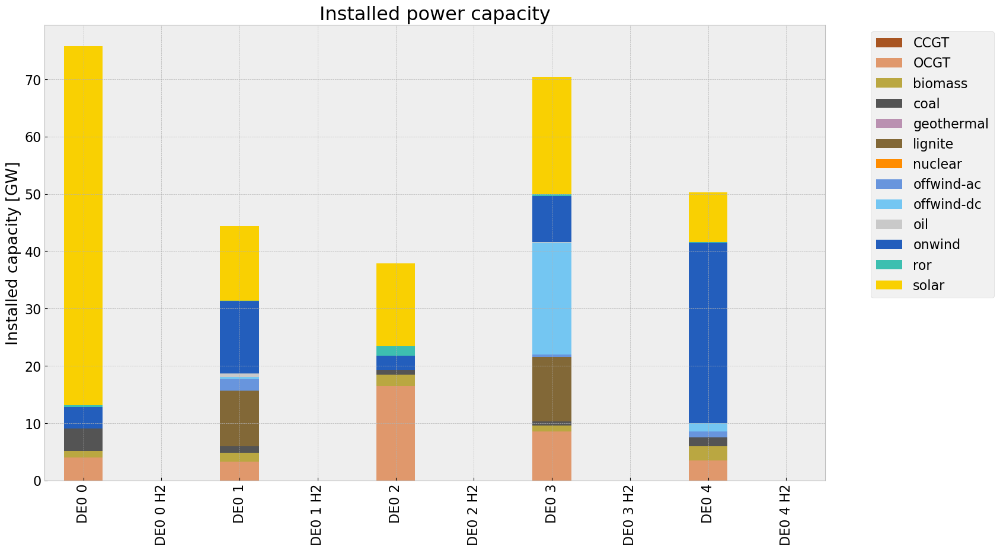

<Figure size 640x480 with 0 Axes>

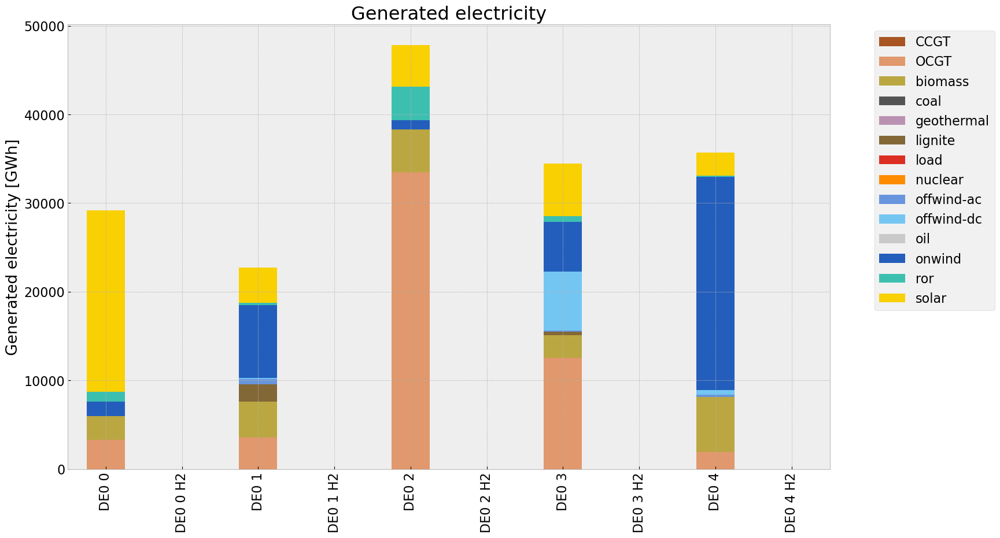

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\1913995090.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\1913995090.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carri

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.483700e+07,0.499437,0.1980,2.173994e+07
biomass,2.020635e+07,0.468000,0.0000,0.000000e+00
coal,1.103975e+02,0.329632,0.3361,1.125637e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,2.340880e+06,0.358368,0.4069,2.657898e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.028886e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


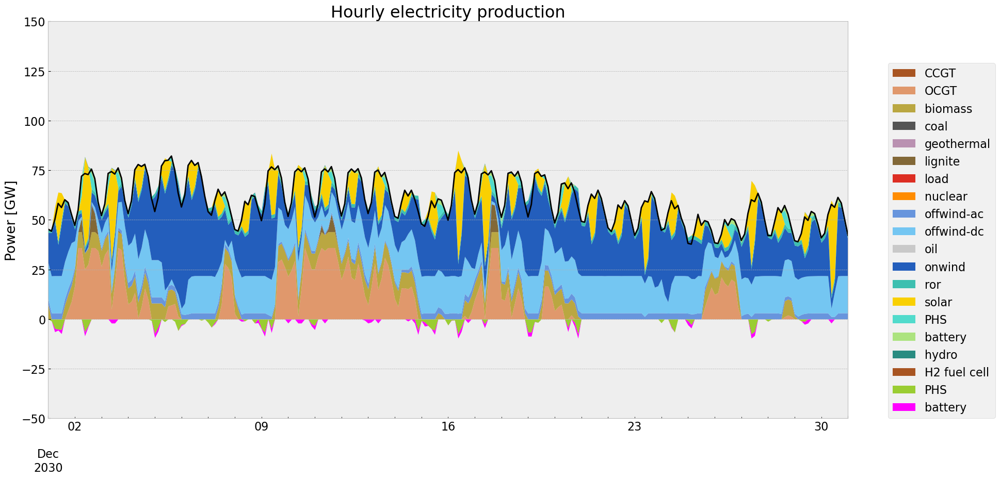

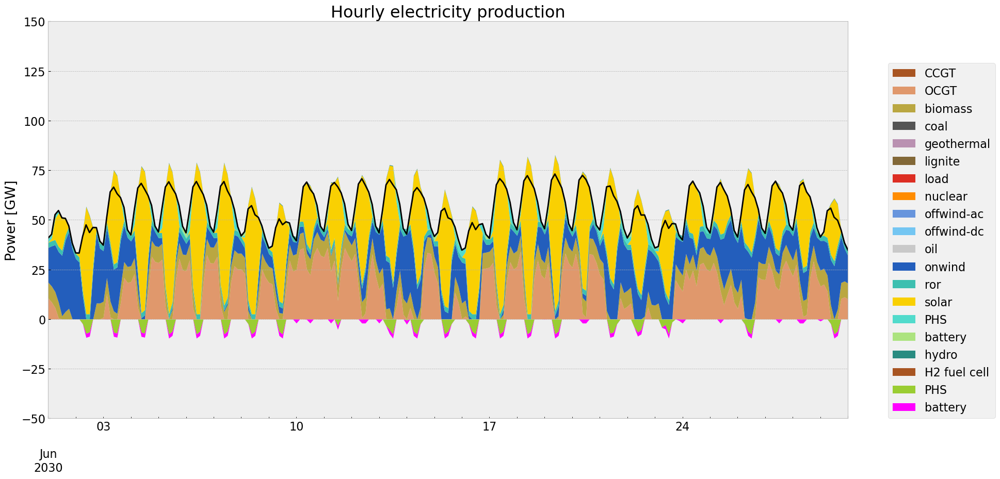

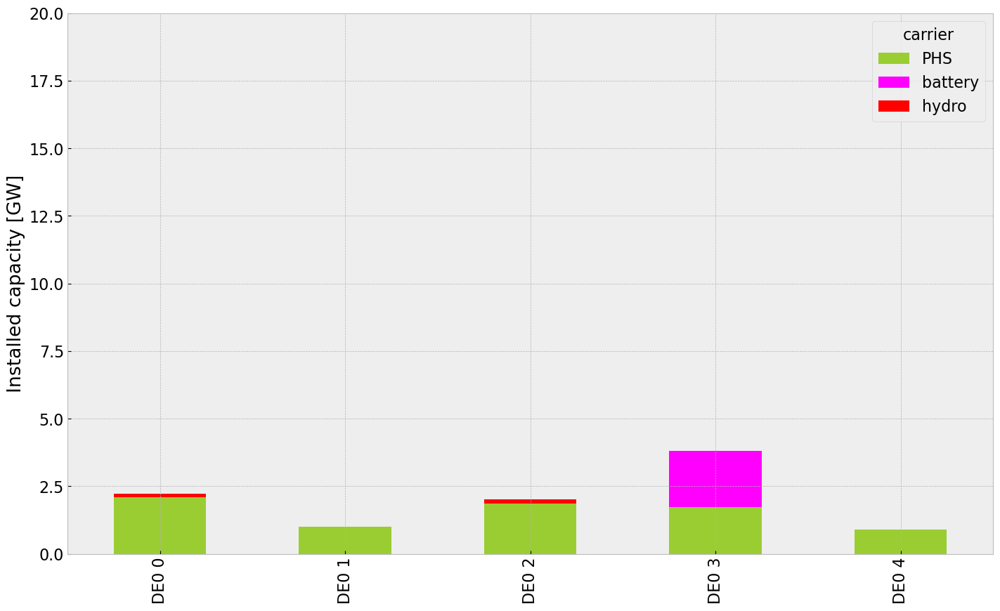

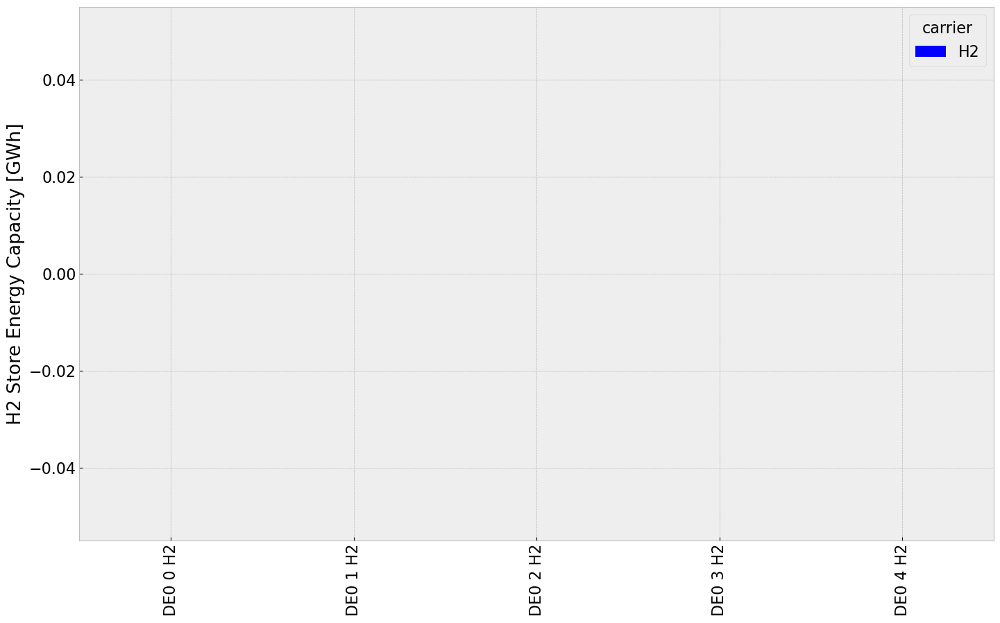

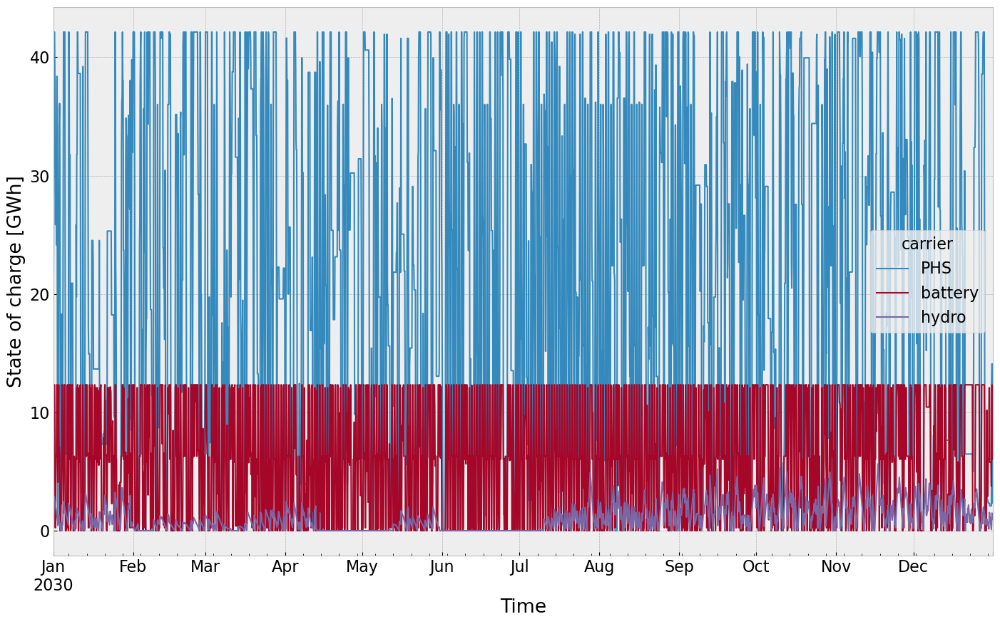

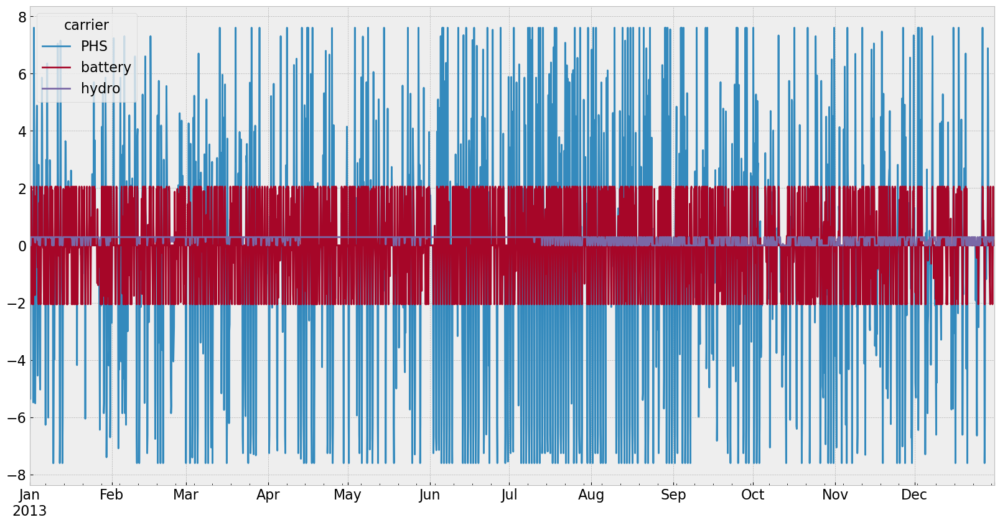

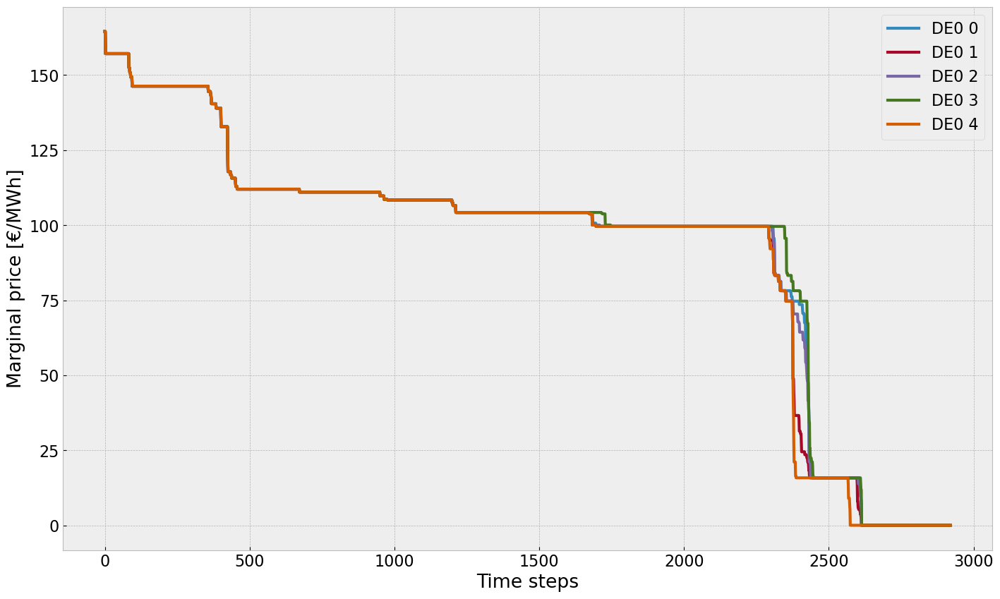

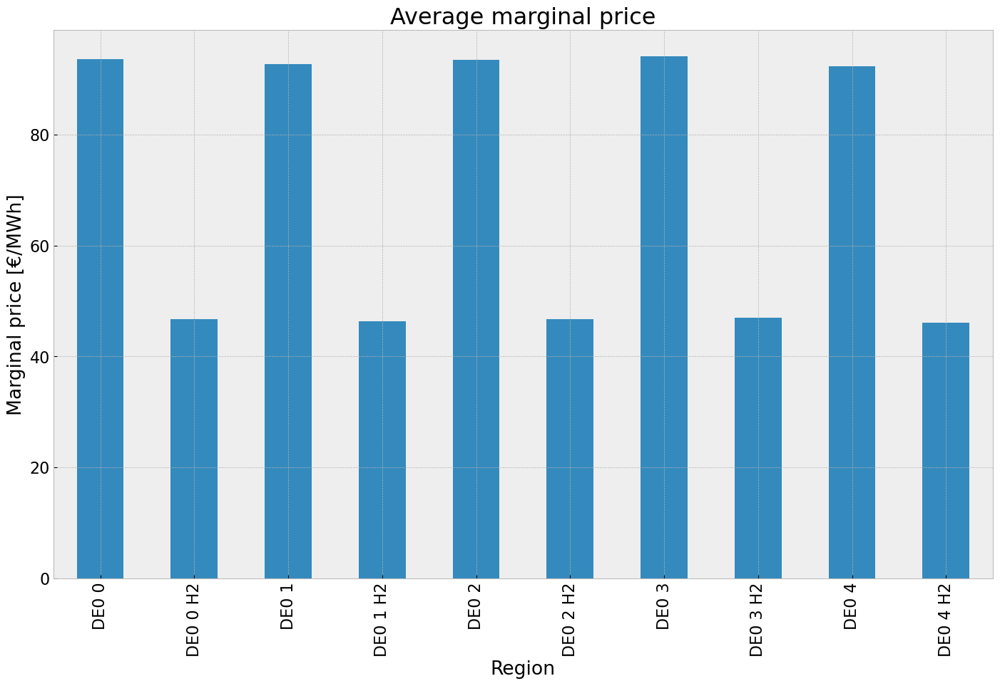

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


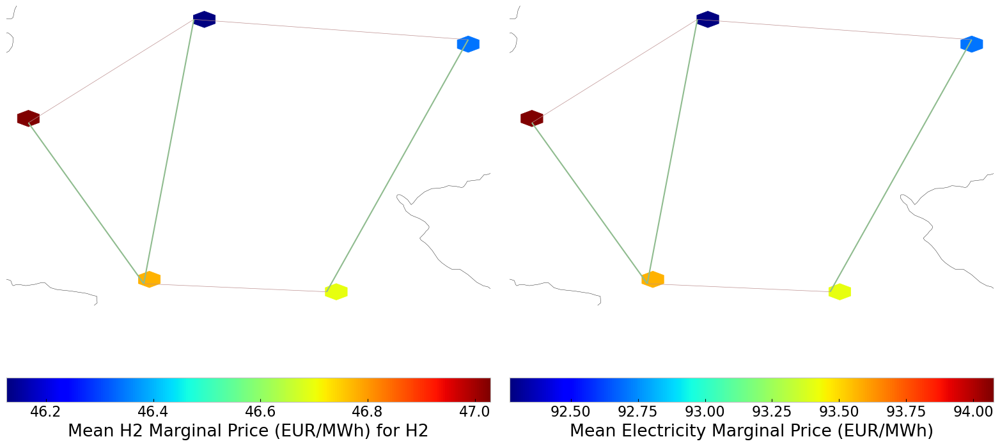

In [411]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
inst_store_table(n3)
inst_storeh2_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

# Scenario Analysis

## Installed Capacity

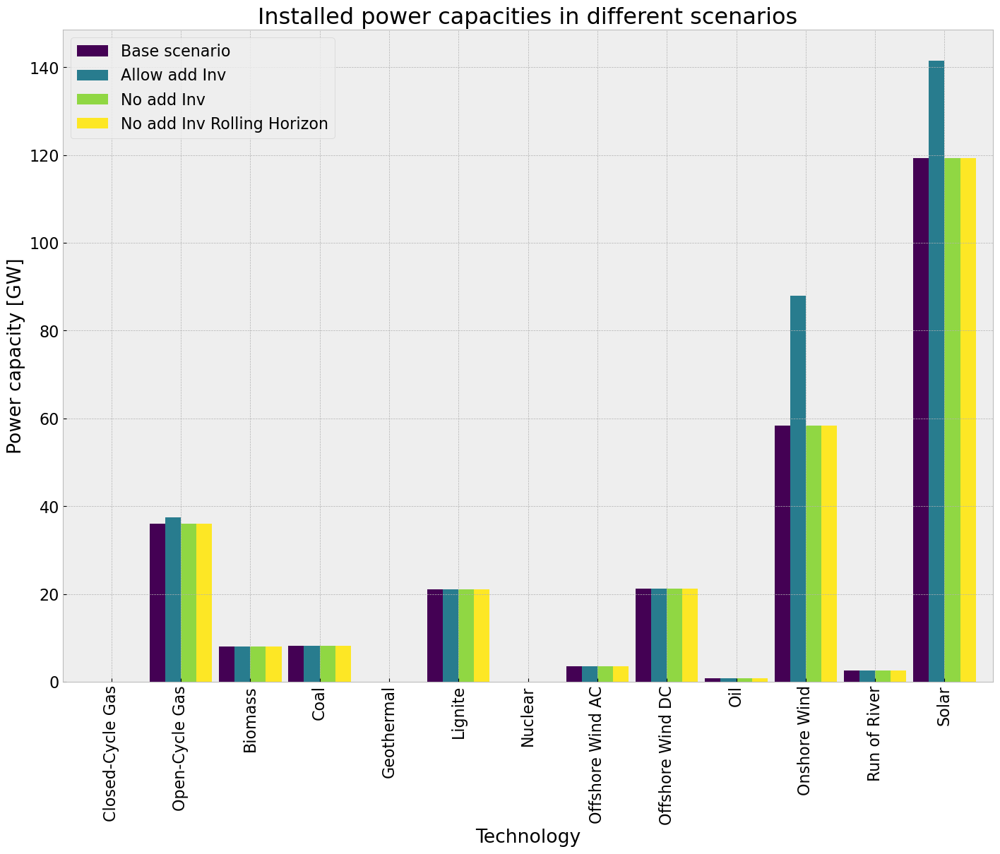

In [412]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [413]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,35.939257,37.521285,35.939257,35.939257
Biomass,8.011736,8.011736,8.011736,8.011736
Coal,8.158220,8.158220,8.158220,8.158220
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,20.999170,20.999170,20.999170,20.999170
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,3.464309,3.464309,3.464309,3.464309
Offshore Wind DC,21.180997,21.180997,21.180997,21.180997


## Power Generation

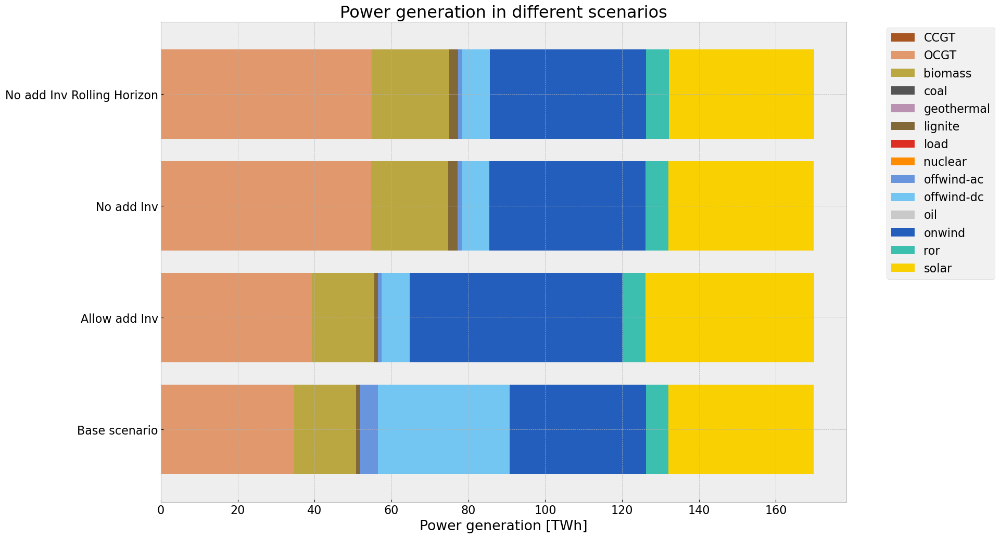

In [414]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [415]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


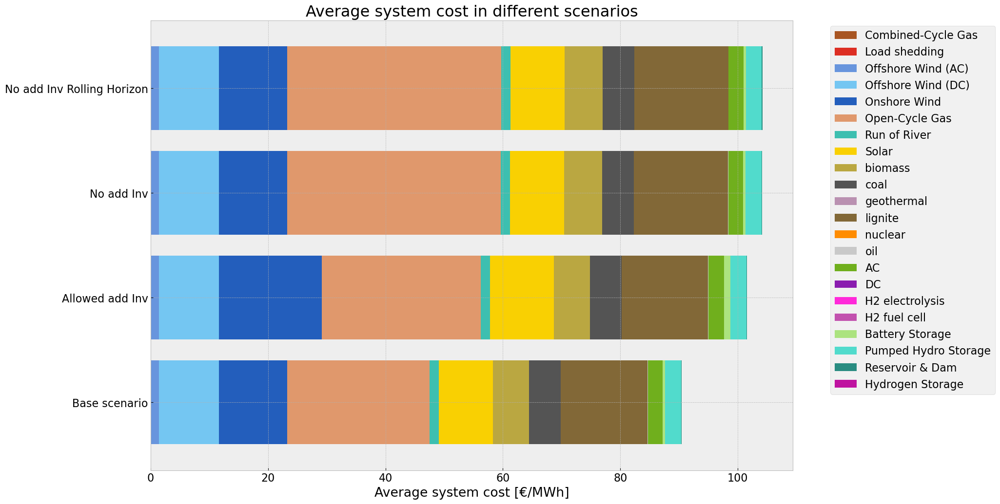

In [416]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [417]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [418]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


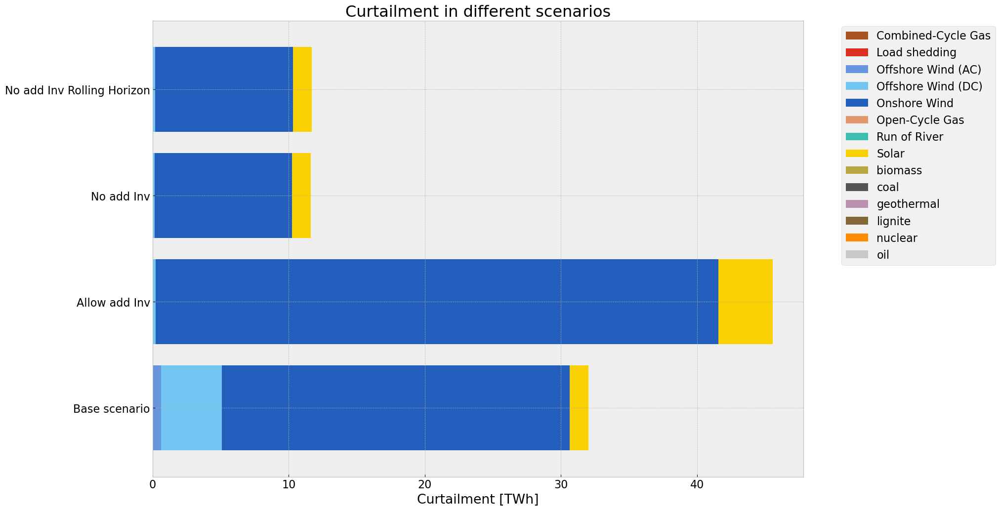

In [419]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13720\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


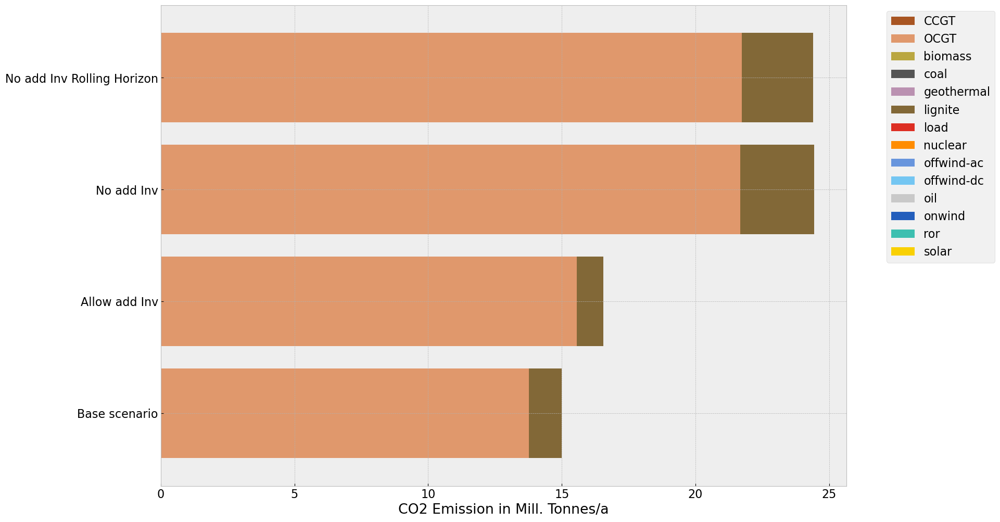

In [420]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()